# 06. Análisis visual con Deep Learning

En este notebook se desarrolla un análisis visual complementario utilizando las fotografías disponibles en **PetFinder**, con el objetivo de estudiar si la información contenida directamente en las imágenes aporta señal adicional para identificar perros con riesgo de adopción lenta.

A diferencia del notebook 05, donde se analizaron variables estructuradas, factores de visibilidad, contenido textual, sentimiento y características visuales agregadas, en este caso se trabajará directamente con **los píxeles de las fotografías mediante técnicas de Deep Learning**.

Para mantener la coherencia metodológica con el análisis anterior, se reutilizará la misma asignación de perros a los conjuntos de entrenamiento, validación y test definida en el notebook 05, evitando que fotografías de un mismo animal aparezcan en conjuntos diferentes.

El análisis permitirá evaluar el rendimiento de un modelo exclusivamente visual y estudiar posteriormente si su información puede complementar el score tabular y textual desarrollado previamente.


In [1]:
from pathlib import Path
import os
import sys
import random

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image, ImageOps, UnidentifiedImageError


pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 100)
pd.set_option("display.width", 180)

RANDOM_STATE = 42

np.random.seed(RANDOM_STATE)
random.seed(RANDOM_STATE)

print("Entorno inicializado correctamente.")

Entorno inicializado correctamente.


## 1. Definición de rutas

En primer lugar, se definen las rutas necesarias para el análisis visual. El proyecto mantiene una estructura relativa para los datos procesados y los resultados, mientras que la ubicación de las imágenes originales de PetFinder puede configurarse mediante la variable de entorno `PETFINDER_DATA_DIR`.

PetFinder constituye la única fuente de imágenes utilizada en este notebook, ya que sus fotografías pueden vincularse con la variable objetivo de adopción lenta definida en el notebook anterior. El análisis de otras fuentes visuales se reserva para notebooks posteriores.


In [2]:
# Definición de rutas del proyecto y del dataset visual de PetFinder

current_path = Path.cwd()

if current_path.name == "notebooks":
    project_path = current_path.parent
else:
    project_path = current_path

data_path = project_path / "data"
processed_data_path = data_path / "processed"

outputs_path = project_path / "outputs"
figures_path = outputs_path / "figures"
models_path = outputs_path / "models"

figures_path.mkdir(parents=True, exist_ok=True)
models_path.mkdir(parents=True, exist_ok=True)

# PetFinder: se prioriza una ruta definida mediante variable de entorno.
petfinder_env_path = os.getenv("PETFINDER_DATA_DIR")

candidatos_petfinder = []

if petfinder_env_path:
    candidatos_petfinder.append(
        Path(petfinder_env_path).expanduser()
    )

candidatos_petfinder.extend([
    data_path / "raw_petfinder",
    data_path / "raw_petfinder" / "petfinder-adoption-prediction",
    (
        data_path
        / "raw_petfinder"
        / "petfinder-adoption-prediction"
        / "petfinder-adoption-prediction"
    )
])

petfinder_local_path = next(
    (
        ruta
        for ruta in candidatos_petfinder
        if (ruta / "train_images").exists()
    ),
    None
)

if petfinder_local_path is None:
    raise FileNotFoundError(
        "No se ha localizado la carpeta 'train_images' de PetFinder. "
        "Coloque el dataset bajo data/raw_petfinder o defina la variable "
        "de entorno PETFINDER_DATA_DIR apuntando a la carpeta que contiene "
        "'train_images'."
    )

petfinder_train_images_path = (
    petfinder_local_path
    / "train_images"
)

# Reutilizar artefactos ya calculados por defecto.
# Cambiar a True solo si se desea forzar un recálculo completo.
RECALCULAR_ARTEFACTOS = False

print("Ruta del proyecto:")
print(project_path)

print("\nPetFinder:")
print(petfinder_local_path)
print("¿Existe PetFinder?:", petfinder_local_path.exists())

print("\nCarpeta train_images:")
print(petfinder_train_images_path)
print("¿Existe?:", petfinder_train_images_path.exists())

print("\nRecalcular artefactos pesados:")
print(RECALCULAR_ARTEFACTOS)


Ruta del proyecto:
g:\Mi unidad\TFM\invisible-dogs-tfm

PetFinder:
g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_petfinder
¿Existe PetFinder?: True

Carpeta train_images:
g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_petfinder\train_images
¿Existe?: True

Recalcular artefactos pesados:
False


## 2. Preparación del dataset visual de PetFinder

Para desarrollar el análisis visual se parte del dataset de perros preparado en el notebook anterior y se recupera la misma asignación de observaciones a los conjuntos de entrenamiento, validación y test.

Mantener esta partición permite comparar posteriormente el modelo visual con el modelo complementario de PetFinder bajo las mismas condiciones de evaluación. Además, la asignación se realiza a nivel de `PetID`, de forma que todas las fotografías correspondientes a un mismo perro permanezcan siempre dentro del mismo conjunto.

In [3]:
# Carga del dataset enriquecido y del split definido en el notebook 05

petfinder_enriched_path = (
    processed_data_path
    / "petfinder_dogs_enriched_completo.csv"
)

split_petfinder_path = (
    outputs_path
    / "petfinder"
    / "split_petfinder_modelizacion.csv"
)

print("Dataset enriquecido de PetFinder:")
print(petfinder_enriched_path)
print("¿Existe?:", petfinder_enriched_path.exists())

print("\nSplit de modelización de PetFinder:")
print(split_petfinder_path)
print("¿Existe?:", split_petfinder_path.exists())

if not petfinder_enriched_path.exists():
    raise FileNotFoundError(
        f"No se ha encontrado el dataset enriquecido: {petfinder_enriched_path}"
    )

if not split_petfinder_path.exists():
    raise FileNotFoundError(
        f"No se ha encontrado el split de modelización: {split_petfinder_path}"
    )

petfinder_visual_df = pd.read_csv(
    petfinder_enriched_path,
    encoding="utf-8-sig"
)

split_petfinder = pd.read_csv(
    split_petfinder_path,
    encoding="utf-8-sig"
)

print("\nDimensiones del dataset enriquecido:")
print(petfinder_visual_df.shape)

print("\nDimensiones del archivo de split:")
print(split_petfinder.shape)

print("\nDistribución del split:")
display(
    split_petfinder[
        "conjunto_petfinder"
    ]
    .value_counts()
    .rename("n_perros")
    .to_frame()
)

Dataset enriquecido de PetFinder:
g:\Mi unidad\TFM\invisible-dogs-tfm\data\processed\petfinder_dogs_enriched_completo.csv
¿Existe?: True

Split de modelización de PetFinder:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\petfinder\split_petfinder_modelizacion.csv
¿Existe?: True

Dimensiones del dataset enriquecido:
(8132, 101)

Dimensiones del archivo de split:
(8132, 2)

Distribución del split:


,n_perros
conjunto_petfinder,
train,5204
test,1627
valid,1301


In [4]:
# Comprobación de consistencia y asociación del split

print("PetID duplicados en el dataset enriquecido:")
print(petfinder_visual_df["PetID"].duplicated().sum())

print("\nPetID duplicados en el archivo de split:")
print(split_petfinder["PetID"].duplicated().sum())

if petfinder_visual_df["PetID"].duplicated().any():
    raise ValueError(
        "El dataset enriquecido contiene PetID duplicados."
    )

if split_petfinder["PetID"].duplicated().any():
    raise ValueError(
        "El archivo de split contiene PetID duplicados."
    )

petfinder_visual_df = petfinder_visual_df.merge(
    split_petfinder,
    on="PetID",
    how="left",
    validate="one_to_one"
)

n_sin_split = (
    petfinder_visual_df["conjunto_petfinder"]
    .isna()
    .sum()
)

print("\nPerros sin asignación de split:")
print(n_sin_split)

print("\nDimensiones tras incorporar el split:")
print(petfinder_visual_df.shape)

print("\nDistribución final:")
display(
    petfinder_visual_df[
        "conjunto_petfinder"
    ]
    .value_counts()
    .rename("n_perros")
    .to_frame()
)

PetID duplicados en el dataset enriquecido:
0

PetID duplicados en el archivo de split:
0

Perros sin asignación de split:
0

Dimensiones tras incorporar el split:
(8132, 102)

Distribución final:


,n_perros
conjunto_petfinder,
train,5204
test,1627
valid,1301


## 3. Asociación de las fotografías de PetFinder

El siguiente paso consiste en vincular cada perro del dataset de modelización con las fotografías disponibles en PetFinder.

Los perros utilizados en este análisis proceden del conjunto original de entrenamiento de PetFinder, ya que es el que contiene la variable `AdoptionSpeed` necesaria para construir el objetivo de adopción lenta. Por este motivo, las imágenes correspondientes se localizan en la carpeta `train_images`.

La asignación `train`, `valid` y `test` utilizada en este notebook corresponde a la partición interna definida en el notebook 05 y no debe confundirse con las carpetas originales `train_images` y `test_images` de PetFinder.

In [5]:
# Inventario de fotografías disponibles en PetFinder

extensiones_imagen = {".jpg", ".jpeg", ".png"}

archivos_imagen = [
    archivo
    for archivo in petfinder_train_images_path.iterdir()
    if archivo.is_file()
    and archivo.suffix.lower() in extensiones_imagen
]

print("Número total de fotografías localizadas:")
print(len(archivos_imagen))

registros_imagenes = []

for archivo in archivos_imagen:
    nombre_sin_extension = archivo.stem

    if "-" not in nombre_sin_extension:
        continue

    pet_id, numero_imagen = nombre_sin_extension.rsplit("-", 1)

    if not numero_imagen.isdigit():
        continue

    registros_imagenes.append({
        "PetID": pet_id,
        "numero_imagen": int(numero_imagen),
        "ruta_imagen": str(archivo)
    })

indice_imagenes_petfinder = pd.DataFrame(registros_imagenes)

indice_imagenes_petfinder = (
    indice_imagenes_petfinder
    .sort_values(["PetID", "numero_imagen"])
    .reset_index(drop=True)
)

print("\nFotografías correctamente indexadas:")
print(len(indice_imagenes_petfinder))

print("\nPerros diferentes con al menos una fotografía:")
print(indice_imagenes_petfinder["PetID"].nunique())

print("\nPrimeras filas del índice de imágenes:")
display(indice_imagenes_petfinder.head(10))

Número total de fotografías localizadas:
58311

Fotografías correctamente indexadas:
58311

Perros diferentes con al menos una fotografía:
14652

Primeras filas del índice de imágenes:


,PetID,numero_imagen,ruta_imagen
0,0008c5398,1,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
1,0008c5398,2,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
2,0008c5398,3,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
3,0008c5398,4,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
4,0008c5398,5,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
5,0008c5398,6,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
6,000a290e4,1,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
7,000a290e4,2,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
8,000fb9572,1,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
9,000fb9572,2,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...


In [6]:
# Comprobación de cobertura de imágenes en el dataset de modelización

petids_con_imagen = set(
    indice_imagenes_petfinder["PetID"].astype(str)
)

petfinder_visual_df["tiene_imagen"] = (
    petfinder_visual_df["PetID"]
    .astype(str)
    .isin(petids_con_imagen)
)

n_total_perros = len(petfinder_visual_df)

n_perros_con_imagen = (
    petfinder_visual_df["tiene_imagen"]
    .sum()
)

n_perros_sin_imagen = (
    n_total_perros
    - n_perros_con_imagen
)

porcentaje_con_imagen = (
    n_perros_con_imagen
    / n_total_perros
    * 100
)

print("Perros incluidos en el análisis:")
print(n_total_perros)

print("\nPerros con al menos una fotografía:")
print(n_perros_con_imagen)

print("\nPerros sin fotografía:")
print(n_perros_sin_imagen)

print("\nCobertura de imágenes:")
print(f"{porcentaje_con_imagen:.2f}%")

resumen_cobertura_split = (
    petfinder_visual_df
    .groupby("conjunto_petfinder")
    .agg(
        n_perros=("PetID", "size"),
        perros_con_imagen=("tiene_imagen", "sum")
    )
)

resumen_cobertura_split["perros_sin_imagen"] = (
    resumen_cobertura_split["n_perros"]
    - resumen_cobertura_split["perros_con_imagen"]
)

resumen_cobertura_split["porcentaje_con_imagen"] = (
    resumen_cobertura_split["perros_con_imagen"]
    / resumen_cobertura_split["n_perros"]
    * 100
)

print("\nCobertura por conjunto:")
display(
    resumen_cobertura_split.round(2)
)

Perros incluidos en el análisis:
8132

Perros con al menos una fotografía:
7938

Perros sin fotografía:
194

Cobertura de imágenes:
97.61%

Cobertura por conjunto:


,n_perros,perros_con_imagen,perros_sin_imagen,porcentaje_con_imagen
conjunto_petfinder,,,,
test,1627,1592,35,97.85
train,5204,5085,119,97.71
valid,1301,1261,40,96.93


In [7]:
# Selección de una fotografía principal por perro

imagen_principal_petfinder = (
    indice_imagenes_petfinder
    .sort_values(
        ["PetID", "numero_imagen"]
    )
    .drop_duplicates(
        subset="PetID",
        keep="first"
    )
    .rename(
        columns={
            "numero_imagen": "numero_imagen_principal",
            "ruta_imagen": "ruta_imagen_principal"
        }
    )
)

print("Perros con fotografía principal seleccionada:")
print(len(imagen_principal_petfinder))

print("\nDistribución del número de imagen seleccionado:")
display(
    imagen_principal_petfinder[
        "numero_imagen_principal"
    ]
    .value_counts()
    .sort_index()
    .rename("n_perros")
    .to_frame()
)

petfinder_visual_df = petfinder_visual_df.merge(
    imagen_principal_petfinder[
        [
            "PetID",
            "numero_imagen_principal",
            "ruta_imagen_principal"
        ]
    ],
    on="PetID",
    how="left",
    validate="one_to_one"
)

print("\nPerros del análisis con fotografía principal:")
print(
    petfinder_visual_df[
        "ruta_imagen_principal"
    ]
    .notna()
    .sum()
)

print("\nPerros del análisis sin fotografía principal:")
print(
    petfinder_visual_df[
        "ruta_imagen_principal"
    ]
    .isna()
    .sum()
)

print("\nEjemplo de asociación:")
display(
    petfinder_visual_df[
        [
            "PetID",
            "conjunto_petfinder",
            "PhotoAmt",
            "numero_imagen_principal",
            "ruta_imagen_principal"
        ]
    ]
    .head(10)
)

Perros con fotografía principal seleccionada:
14652

Distribución del número de imagen seleccionado:


,n_perros
numero_imagen_principal,
1,14652



Perros del análisis con fotografía principal:
7938

Perros del análisis sin fotografía principal:
194

Ejemplo de asociación:


,PetID,conjunto_petfinder,PhotoAmt,numero_imagen_principal,ruta_imagen_principal
0,3422e4906,train,7.0,1.0,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
1,5842f1ff5,train,8.0,1.0,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
2,850a43f90,test,3.0,1.0,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
3,97aa9eeac,valid,9.0,1.0,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
4,8b693ca84,train,7.0,1.0,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
5,aaedd873d,train,1.0,1.0,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
6,c02be41e6,test,2.0,1.0,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
7,1fd342e17,train,2.0,1.0,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
8,f9d07d5fa,train,2.0,1.0,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
9,1c92ce464,train,8.0,1.0,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...


## 4. Comprobación de integridad de las imágenes

Antes de utilizar las fotografías como entrada de un modelo de Deep Learning, se comprueba que los archivos asociados a los perros del análisis puedan abrirse correctamente y que no existan imágenes dañadas o ilegibles.

Esta revisión permite identificar posibles pérdidas adicionales de observaciones antes de iniciar el procesamiento visual. Los perros sin fotografía disponible se mantienen registrados en el dataset original, pero no podrán formar parte del modelo basado exclusivamente en imágenes.

In [8]:
# Comprobación optimizada de integridad de las fotografías principales

from concurrent.futures import ThreadPoolExecutor
import os
import time


def comprobar_imagen(ruta_imagen):
    try:
        with Image.open(ruta_imagen) as imagen:
            imagen.verify()

        return True

    except (
        UnidentifiedImageError,
        OSError,
        ValueError
    ):
        return False


# ---------------------------------------------------------
# Fotografías que se van a comprobar
# ---------------------------------------------------------

imagenes_a_comprobar = (
    petfinder_visual_df.loc[
        petfinder_visual_df[
            "ruta_imagen_principal"
        ].notna(),
        [
            "PetID",
            "ruta_imagen_principal"
        ]
    ]
    .copy()
    .reset_index(drop=True)
)


petids_integridad = (
    imagenes_a_comprobar[
        "PetID"
    ]
    .tolist()
)

rutas_integridad = (
    imagenes_a_comprobar[
        "ruta_imagen_principal"
    ]
    .tolist()
)


# ---------------------------------------------------------
# Comprobación paralela
# ---------------------------------------------------------

# Al tratarse principalmente de lectura de archivos,
# varios hilos permiten reducir el tiempo de espera.
MAX_WORKERS_INTEGRIDAD = 16

print(
    "Comprobando integridad de "
    f"{len(rutas_integridad)} fotografías..."
)

print(
    f"Hilos utilizados: "
    f"{MAX_WORKERS_INTEGRIDAD}"
)

inicio_integridad = time.perf_counter()

resultados_validos = []


with ThreadPoolExecutor(
    max_workers=MAX_WORKERS_INTEGRIDAD
) as executor:

    resultados = executor.map(
        comprobar_imagen,
        rutas_integridad
    )

    for i, imagen_valida in enumerate(
        resultados,
        start=1
    ):

        resultados_validos.append(
            imagen_valida
        )

        if (
            i % 500 == 0
            or i == len(rutas_integridad)
        ):
            print(
                f"Imágenes comprobadas: "
                f"{i}/{len(rutas_integridad)}"
            )


tiempo_integridad = (
    time.perf_counter()
    - inicio_integridad
)


# ---------------------------------------------------------
# Construcción del resultado
# ---------------------------------------------------------

integridad_imagenes = pd.DataFrame({
    "PetID": petids_integridad,
    "imagen_valida": resultados_validos
})


# Evitar duplicar la columna si se vuelve a ejecutar la celda
if "imagen_valida" in petfinder_visual_df.columns:

    petfinder_visual_df = (
        petfinder_visual_df
        .drop(
            columns=[
                "imagen_valida"
            ]
        )
    )


petfinder_visual_df = (
    petfinder_visual_df
    .merge(
        integridad_imagenes,
        on="PetID",
        how="left",
        validate="one_to_one"
    )
)


petfinder_visual_df[
    "imagen_valida"
] = (
    petfinder_visual_df[
        "imagen_valida"
    ]
    .fillna(False)
    .astype(bool)
)


# ---------------------------------------------------------
# Resumen
# ---------------------------------------------------------

n_imagenes_validas = (
    petfinder_visual_df[
        "imagen_valida"
    ]
    .sum()
)

n_imagenes_invalidas = (
    petfinder_visual_df[
        "ruta_imagen_principal"
    ]
    .notna()
    .sum()
    - n_imagenes_validas
)


print("\nComprobación finalizada.")

print("\nTiempo total:")
print(
    f"{tiempo_integridad / 60:.2f} minutos"
)

print("\nImágenes principales válidas:")
print(
    n_imagenes_validas
)

print("\nImágenes principales no válidas:")
print(
    n_imagenes_invalidas
)

print("\nPerros sin fotografía disponible:")
print(
    petfinder_visual_df[
        "ruta_imagen_principal"
    ]
    .isna()
    .sum()
)

Comprobando integridad de 7938 fotografías...
Hilos utilizados: 16
Imágenes comprobadas: 500/7938
Imágenes comprobadas: 1000/7938
Imágenes comprobadas: 1500/7938
Imágenes comprobadas: 2000/7938
Imágenes comprobadas: 2500/7938
Imágenes comprobadas: 3000/7938
Imágenes comprobadas: 3500/7938
Imágenes comprobadas: 4000/7938
Imágenes comprobadas: 4500/7938
Imágenes comprobadas: 5000/7938
Imágenes comprobadas: 5500/7938
Imágenes comprobadas: 6000/7938
Imágenes comprobadas: 6500/7938
Imágenes comprobadas: 7000/7938
Imágenes comprobadas: 7500/7938
Imágenes comprobadas: 7938/7938

Comprobación finalizada.

Tiempo total:
3.59 minutos

Imágenes principales válidas:
7938

Imágenes principales no válidas:
0

Perros sin fotografía disponible:
194


## 5. Análisis exploratorio de las imágenes

Una vez comprobada la integridad de las fotografías, se analizan sus principales características técnicas antes de aplicar cualquier transformación para el modelado.

Este análisis permite conocer la variabilidad existente en dimensiones, proporciones y modos de color, aspectos relevantes para definir posteriormente un tamaño de entrada común y un procedimiento de preprocesamiento adecuado para la red neuronal.

In [9]:
# Extracción de dimensiones y modo de color de las imágenes

caracteristicas_imagenes = []

imagenes_validas_df = (
    petfinder_visual_df.loc[
        petfinder_visual_df["imagen_valida"],
        [
            "PetID",
            "ruta_imagen_principal"
        ]
    ]
    .copy()
)

for i, fila in enumerate(
    imagenes_validas_df.itertuples(index=False),
    start=1
):
    with Image.open(fila.ruta_imagen_principal) as imagen:
        ancho, alto = imagen.size

        caracteristicas_imagenes.append({
            "PetID": fila.PetID,
            "image_width": ancho,
            "image_height": alto,
            "image_aspect_ratio": ancho / alto,
            "image_mode": imagen.mode
        })

    if i % 1000 == 0:
        print(
            f"Imágenes analizadas: "
            f"{i}/{len(imagenes_validas_df)}"
        )

caracteristicas_imagenes = pd.DataFrame(
    caracteristicas_imagenes
)

petfinder_visual_df = (
    petfinder_visual_df
    .merge(
        caracteristicas_imagenes,
        on="PetID",
        how="left",
        validate="one_to_one"
    )
)

print("\nResumen de dimensiones:")

display(
    petfinder_visual_df.loc[
        petfinder_visual_df["imagen_valida"],
        [
            "image_width",
            "image_height",
            "image_aspect_ratio"
        ]
    ]
    .describe()
    .round(2)
)

print("\nModos de color:")

display(
    petfinder_visual_df.loc[
        petfinder_visual_df["imagen_valida"],
        "image_mode"
    ]
    .value_counts()
    .rename("n_imagenes")
    .to_frame()
)

Imágenes analizadas: 1000/7938
Imágenes analizadas: 2000/7938
Imágenes analizadas: 3000/7938
Imágenes analizadas: 4000/7938
Imágenes analizadas: 5000/7938
Imágenes analizadas: 6000/7938
Imágenes analizadas: 7000/7938

Resumen de dimensiones:


,image_width,image_height,image_aspect_ratio
count,7938.00,7938.00,7938.00
mean,381.99,403.79,0.99
std,122.83,94.41,0.37
min,60.00,67.00,0.30
25%,300.00,300.00,0.75
50%,360.00,400.00,0.75
75%,400.00,480.00,1.33
max,640.00,640.00,4.40



Modos de color:


,n_imagenes
image_mode,
RGB,7935
L,3


### 5.1. Distribución de dimensiones y proporciones

Las fotografías presentan tamaños y formatos heterogéneos, por lo que resulta conveniente analizar su distribución antes de establecer un tamaño común de entrada para el modelo.

La relación de aspecto permite identificar la presencia de imágenes verticales, horizontales y aproximadamente cuadradas. Esta variabilidad se tendrá en cuenta posteriormente durante el preprocesamiento para evitar deformaciones innecesarias del contenido visual.

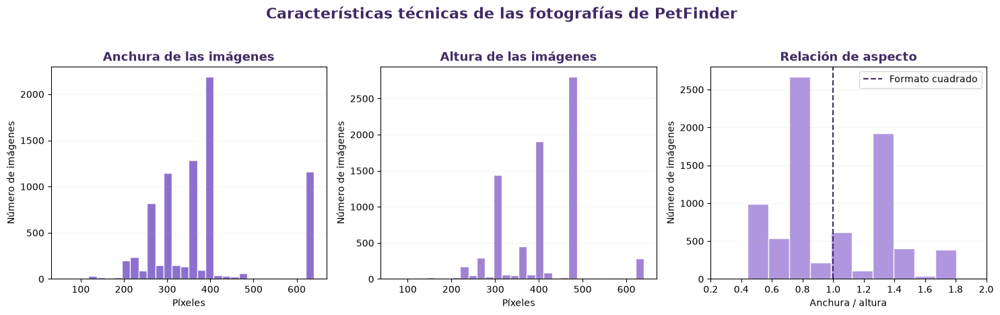

Figura guardada en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\figures\petfinder_visual_dimensiones_imagenes.png


In [10]:
# Distribución de dimensiones y relación de aspecto

datos_imagenes_validas = (
    petfinder_visual_df.loc[
        petfinder_visual_df["imagen_valida"],
        [
            "image_width",
            "image_height",
            "image_aspect_ratio"
        ]
    ]
    .copy()
)

fig, axes = plt.subplots(
    1,
    3,
    figsize=(15, 4.5)
)

axes[0].hist(
    datos_imagenes_validas["image_width"],
    bins=30,
    color="#8060C9",
    edgecolor="white",
    alpha=0.90
)

axes[0].set_title(
    "Anchura de las imágenes",
    fontsize=13,
    fontweight="bold",
    color="#3F2A64"
)

axes[0].set_xlabel("Píxeles")
axes[0].set_ylabel("Número de imágenes")


axes[1].hist(
    datos_imagenes_validas["image_height"],
    bins=30,
    color="#9575CD",
    edgecolor="white",
    alpha=0.90
)

axes[1].set_title(
    "Altura de las imágenes",
    fontsize=13,
    fontweight="bold",
    color="#3F2A64"
)

axes[1].set_xlabel("Píxeles")
axes[1].set_ylabel("Número de imágenes")


axes[2].hist(
    datos_imagenes_validas["image_aspect_ratio"],
    bins=30,
    color="#A78BDB",
    edgecolor="white",
    alpha=0.90
)

axes[2].axvline(
    1,
    color="#3F2A64",
    linestyle="--",
    linewidth=1.5,
    label="Formato cuadrado"
)

axes[2].set_title(
    "Relación de aspecto",
    fontsize=13,
    fontweight="bold",
    color="#3F2A64"
)

axes[2].set_xlabel("Anchura / altura")
axes[2].set_ylabel("Número de imágenes")

axes[2].set_xlim(0.2, 2.0)

axes[2].legend()


for ax in axes:
    ax.grid(
        axis="y",
        linestyle="--",
        alpha=0.20
    )

fig.suptitle(
    "Características técnicas de las fotografías de PetFinder",
    fontsize=16,
    fontweight="bold",
    color="#3F2A64",
    y=1.03
)

fig.tight_layout()

fig_path_dimensiones = (
    figures_path
    / "petfinder_visual_dimensiones_imagenes.png"
)

fig.savefig(
    fig_path_dimensiones,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("Figura guardada en:")
print(fig_path_dimensiones)

### 5.2. Exploración visual de las fotografías

Además de sus características técnicas, resulta útil observar directamente una muestra de las fotografías utilizadas en el análisis.

Para esta exploración se seleccionan ejemplos aleatorios del conjunto de entrenamiento, diferenciando entre perros con adopción no lenta y adopción lenta. El conjunto de test se mantiene fuera de esta inspección para conservar su función como evaluación final independiente.

Esta visualización tiene un carácter exclusivamente exploratorio y no se utiliza para modificar etiquetas, seleccionar observaciones ni tomar decisiones individuales sobre el entrenamiento.

In [11]:
# Selección de ejemplos visuales del conjunto de entrenamiento

def mostrar_muestra_imagenes(
    df,
    clase,
    titulo,
    n_imagenes=8,
    random_state=42
):
    candidatos = df.loc[
        (df["conjunto_petfinder"] == "train")
        & (df["target_adopcion_lenta"] == clase)
        & (df["imagen_valida"])
    ].copy()

    muestra = candidatos.sample(
        n=min(n_imagenes, len(candidatos)),
        random_state=random_state
    )

    n_columnas = 4
    n_filas = int(
        np.ceil(len(muestra) / n_columnas)
    )

    fig, axes = plt.subplots(
        n_filas,
        n_columnas,
        figsize=(12, 3.5 * n_filas)
    )

    axes = np.array(axes).reshape(-1)

    for ax in axes:
        ax.axis("off")

    for ax, fila in zip(
        axes,
        muestra.itertuples(index=False)
    ):
        with Image.open(
            fila.ruta_imagen_principal
        ) as imagen:
            imagen_rgb = imagen.convert("RGB")
            ax.imshow(imagen_rgb)

        ax.set_title(
            f"PetID: {fila.PetID}",
            fontsize=9,
            color="#3F2A64"
        )

        ax.axis("off")

    fig.suptitle(
        titulo,
        fontsize=16,
        fontweight="bold",
        color="#3F2A64",
        y=1.01
    )

    fig.tight_layout()

    return fig

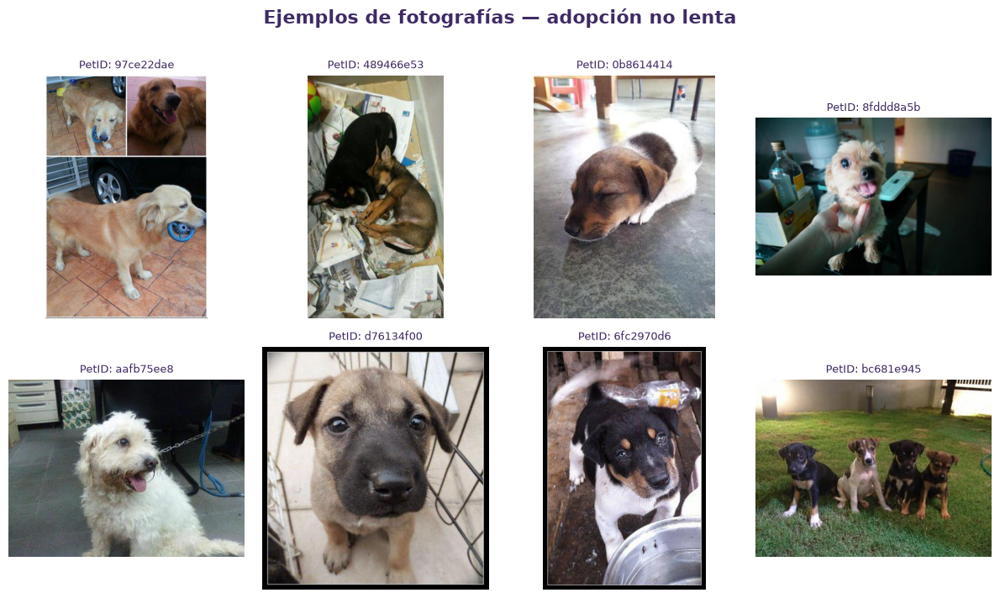

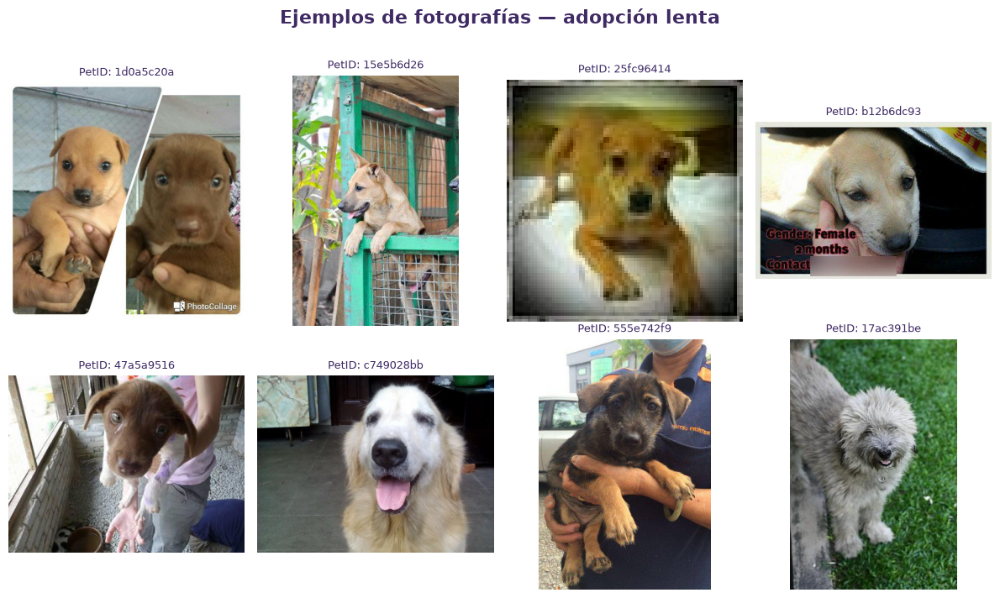

In [12]:
# Fotografías de perros con adopción no lenta

fig_no_lenta = mostrar_muestra_imagenes(
    petfinder_visual_df,
    clase=0,
    titulo="Ejemplos de fotografías — adopción no lenta",
    n_imagenes=8,
    random_state=RANDOM_STATE
)

fig_path_no_lenta = (
    figures_path
    / "petfinder_visual_ejemplos_adopcion_no_lenta.png"
)

fig_no_lenta.savefig(
    fig_path_no_lenta,
    dpi=300,
    bbox_inches="tight"
)

plt.show()


# Fotografías de perros con adopción lenta

fig_lenta = mostrar_muestra_imagenes(
    petfinder_visual_df,
    clase=1,
    titulo="Ejemplos de fotografías — adopción lenta",
    n_imagenes=8,
    random_state=RANDOM_STATE
)

fig_path_lenta = (
    figures_path
    / "petfinder_visual_ejemplos_adopcion_lenta.png"
)

fig_lenta.savefig(
    fig_path_lenta,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

### 5.3. Preparación del conjunto visual de modelización

A partir de las comprobaciones anteriores, se construye el conjunto específico que se utilizará posteriormente para el entrenamiento del modelo visual.

Se incluyen únicamente los perros que disponen de una fotografía principal válida, manteniendo en todo momento la asignación `train`, `valid` y `test` definida previamente. De esta forma, cada perro aporta una única imagen al modelo y se evita que los animales con mayor número de fotografías tengan una representación superior durante el entrenamiento.

La distribución de la variable objetivo se revisa únicamente en los conjuntos de entrenamiento y validación. El conjunto de test se reserva para la evaluación final del modelo y no se utiliza para tomar decisiones durante su desarrollo.

In [13]:
# Creación del dataset visual de modelización

columnas_dataset_visual = [
    "PetID",
    "target_adopcion_lenta",
    "conjunto_petfinder",
    "ruta_imagen_principal",
    "numero_imagen_principal",
    "PhotoAmt",
    "VideoAmt",
    "image_width",
    "image_height",
    "image_aspect_ratio"
]

petfinder_visual_model_df = (
    petfinder_visual_df.loc[
        petfinder_visual_df["imagen_valida"],
        columnas_dataset_visual
    ]
    .copy()
    .reset_index(drop=True)
)

print("Dimensiones del dataset visual:")
print(petfinder_visual_model_df.shape)

print("\nDistribución por conjunto:")

display(
    petfinder_visual_model_df[
        "conjunto_petfinder"
    ]
    .value_counts()
    .rename("n_perros")
    .to_frame()
)

print("\nDistribución de clases en entrenamiento:")

display(
    petfinder_visual_model_df.loc[
        petfinder_visual_model_df[
            "conjunto_petfinder"
        ] == "train",
        "target_adopcion_lenta"
    ]
    .value_counts()
    .sort_index()
    .rename("n_perros")
    .to_frame()
)

print("\nProporción de clases en entrenamiento:")

display(
    petfinder_visual_model_df.loc[
        petfinder_visual_model_df[
            "conjunto_petfinder"
        ] == "train",
        "target_adopcion_lenta"
    ]
    .value_counts(normalize=True)
    .sort_index()
    .rename("proporcion")
    .to_frame()
    .round(4)
)

print("\nDistribución de clases en validación:")

display(
    petfinder_visual_model_df.loc[
        petfinder_visual_model_df[
            "conjunto_petfinder"
        ] == "valid",
        "target_adopcion_lenta"
    ]
    .value_counts()
    .sort_index()
    .rename("n_perros")
    .to_frame()
)

print("\nProporción de clases en validación:")

display(
    petfinder_visual_model_df.loc[
        petfinder_visual_model_df[
            "conjunto_petfinder"
        ] == "valid",
        "target_adopcion_lenta"
    ]
    .value_counts(normalize=True)
    .sort_index()
    .rename("proporcion")
    .to_frame()
    .round(4)
)

Dimensiones del dataset visual:
(7938, 10)

Distribución por conjunto:


,n_perros
conjunto_petfinder,
train,5085
test,1592
valid,1261



Distribución de clases en entrenamiento:


,n_perros
target_adopcion_lenta,
0,2374
1,2711



Proporción de clases en entrenamiento:


,proporcion
target_adopcion_lenta,
0,0.4669
1,0.5331



Distribución de clases en validación:


,n_perros
target_adopcion_lenta,
0,590
1,671



Proporción de clases en validación:


,proporcion
target_adopcion_lenta,
0,0.4679
1,0.5321


In [14]:
# Guardado del dataset visual preparado

visual_outputs_path = (
    outputs_path
    / "petfinder_visual"
)

visual_outputs_path.mkdir(
    parents=True,
    exist_ok=True
)

petfinder_visual_model_path = (
    visual_outputs_path
    / "petfinder_visual_model_dataset.csv"
)

petfinder_visual_model_df.to_csv(
    petfinder_visual_model_path,
    index=False,
    encoding="utf-8-sig"
)

print("Dataset visual guardado en:")
print(petfinder_visual_model_path)

print("\nDimensiones:")
print(petfinder_visual_model_df.shape)

Dataset visual guardado en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\petfinder_visual\petfinder_visual_model_dataset.csv

Dimensiones:
(7938, 10)


## 6. Preparación del entorno de Deep Learning

Una vez construido el dataset visual, el siguiente paso consiste en preparar el entorno necesario para desarrollar el modelo basado en imágenes.

Antes de definir las transformaciones y la arquitectura de la red neuronal, se comprueba la disponibilidad de las librerías de Deep Learning y del hardware utilizado para el entrenamiento. El uso de GPU puede reducir considerablemente el tiempo necesario para entrenar modelos convolucionales sobre varios miles de fotografías.

In [15]:
# Comprobación del entorno de Deep Learning

import torch
import torchvision

print("Versión de PyTorch:")
print(torch.__version__)

print("\nVersión de torchvision:")
print(torchvision.__version__)

print("\nCUDA disponible:")
print(torch.cuda.is_available())

if torch.cuda.is_available():
    print("\nGPU utilizada:")
    print(torch.cuda.get_device_name(0))

Versión de PyTorch:
2.7.1+cu118

Versión de torchvision:
0.22.1+cu118

CUDA disponible:
True

GPU utilizada:
NVIDIA GeForce GTX 1650


## 7. Preprocesamiento de imágenes para Deep Learning

Las fotografías de PetFinder presentan diferentes dimensiones y relaciones de aspecto, por lo que es necesario aplicar un procedimiento común antes de utilizarlas como entrada de la red neuronal.

Para evitar deformaciones, las imágenes no se redimensionan directamente a un formato cuadrado. En entrenamiento se aplican transformaciones moderadas que introducen variabilidad sin modificar de forma sustancial el contenido de la fotografía, mientras que en validación y test se utiliza un procesamiento determinista.

Todas las imágenes se convierten a RGB y se adaptan finalmente a un tamaño de 224 × 224 píxeles, compatible con las arquitecturas preentrenadas que se evaluarán posteriormente. También se aplica la normalización utilizada en ImageNet, coherente con el uso posterior de modelos con pesos preentrenados.

In [16]:
# Definición de transformaciones para las imágenes

from torchvision import transforms

IMAGE_SIZE = 224

imagenet_mean = [
    0.485,
    0.456,
    0.406
]

imagenet_std = [
    0.229,
    0.224,
    0.225
]

transform_train = transforms.Compose([
    transforms.Lambda(
        lambda imagen: imagen.convert("RGB")
    ),
    transforms.RandomResizedCrop(
        IMAGE_SIZE,
        scale=(0.80, 1.00),
        ratio=(0.75, 1.33)
    ),
    transforms.RandomHorizontalFlip(
        p=0.5
    ),
    transforms.ColorJitter(
        brightness=0.10,
        contrast=0.10,
        saturation=0.10
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=imagenet_mean,
        std=imagenet_std
    )
])

transform_eval = transforms.Compose([
    transforms.Lambda(
        lambda imagen: imagen.convert("RGB")
    ),
    transforms.Resize(256),
    transforms.CenterCrop(
        IMAGE_SIZE
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=imagenet_mean,
        std=imagenet_std
    )
])

print("Tamaño de entrada:")
print(f"{IMAGE_SIZE} x {IMAGE_SIZE} píxeles")

print("\nTransformaciones de entrenamiento:")
print(transform_train)

print("\nTransformaciones de validación y test:")
print(transform_eval)

Tamaño de entrada:
224 x 224 píxeles

Transformaciones de entrenamiento:
Compose(
    Lambda()
    RandomResizedCrop(size=(224, 224), scale=(0.8, 1.0), ratio=(0.75, 1.33), interpolation=bilinear, antialias=True)
    RandomHorizontalFlip(p=0.5)
    ColorJitter(brightness=(0.9, 1.1), contrast=(0.9, 1.1), saturation=(0.9, 1.1), hue=None)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)

Transformaciones de validación y test:
Compose(
    Lambda()
    Resize(size=256, interpolation=bilinear, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


### 7.1. Comprobación visual del preprocesamiento

Antes de utilizar las transformaciones durante el entrenamiento, se comprueba visualmente su efecto sobre una fotografía del conjunto de entrenamiento.

El objetivo es verificar que el aumento de datos introduce variabilidad suficiente para favorecer la generalización del modelo sin alterar de forma excesiva el contenido original de la imagen. Las modificaciones aplicadas se limitan a recortes, reflejos horizontales y pequeñas variaciones de iluminación y color.

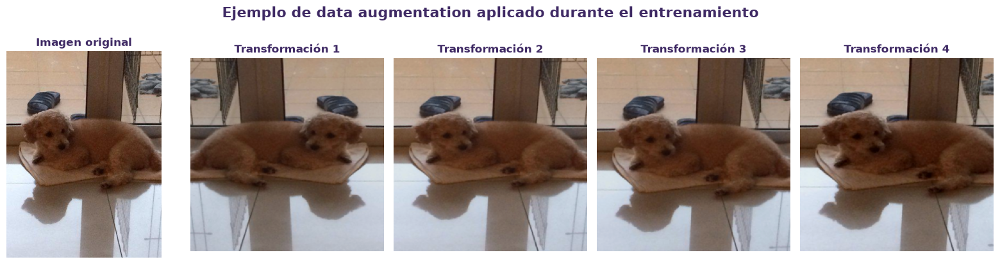

PetID del ejemplo:
8599dc67a


In [17]:
# Visualización de las transformaciones de entrenamiento

def desnormalizar_imagen(tensor):
    mean = torch.tensor(
        imagenet_mean
    ).view(3, 1, 1)

    std = torch.tensor(
        imagenet_std
    ).view(3, 1, 1)

    imagen = tensor * std + mean

    return (
        imagen
        .clamp(0, 1)
        .permute(1, 2, 0)
        .numpy()
    )


ejemplo_train = (
    petfinder_visual_model_df.loc[
        petfinder_visual_model_df[
            "conjunto_petfinder"
        ] == "train"
    ]
    .sample(
        n=1,
        random_state=RANDOM_STATE
    )
    .iloc[0]
)

ruta_ejemplo = (
    ejemplo_train[
        "ruta_imagen_principal"
    ]
)

with Image.open(ruta_ejemplo) as imagen:
    imagen_original = imagen.convert("RGB")

    torch.manual_seed(RANDOM_STATE)

    imagenes_transformadas = [
        transform_train(imagen_original)
        for _ in range(4)
    ]


fig, axes = plt.subplots(
    1,
    5,
    figsize=(16, 4)
)

axes[0].imshow(
    imagen_original
)

axes[0].set_title(
    "Imagen original",
    fontsize=12,
    fontweight="bold",
    color="#3F2A64"
)

axes[0].axis("off")


for i, tensor_imagen in enumerate(
    imagenes_transformadas,
    start=1
):
    axes[i].imshow(
        desnormalizar_imagen(
            tensor_imagen
        )
    )

    axes[i].set_title(
        f"Transformación {i}",
        fontsize=12,
        fontweight="bold",
        color="#3F2A64"
    )

    axes[i].axis("off")


fig.suptitle(
    "Ejemplo de data augmentation aplicado durante el entrenamiento",
    fontsize=16,
    fontweight="bold",
    color="#3F2A64",
    y=1.02
)

fig.tight_layout()

fig_path_augmentation = (
    figures_path
    / "petfinder_visual_data_augmentation.png"
)

fig.savefig(
    fig_path_augmentation,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("PetID del ejemplo:")
print(ejemplo_train["PetID"])

### 7.2. Creación de los conjuntos de datos para PyTorch

Una vez definido y revisado el preprocesamiento, se preparan los conjuntos de entrenamiento, validación y test para su utilización con PyTorch.

Cada observación corresponde a un único perro y contiene su fotografía principal y la variable objetivo de adopción lenta. Las transformaciones aleatorias se aplican exclusivamente al conjunto de entrenamiento, mientras que validación y test utilizan el procesamiento determinista definido anteriormente.

Los cargadores de datos permiten suministrar las imágenes al modelo en pequeños lotes durante el entrenamiento. Dadas las características del hardware disponible, se utiliza inicialmente un tamaño de lote moderado para limitar el consumo de memoria de la GPU.

In [18]:
# Dataset personalizado para las fotografías de PetFinder

from torch.utils.data import Dataset, DataLoader


class PetFinderImageDataset(Dataset):

    def __init__(
        self,
        dataframe,
        transform=None
    ):
        self.dataframe = (
            dataframe
            .reset_index(drop=True)
            .copy()
        )

        self.transform = transform


    def __len__(self):
        return len(self.dataframe)


    def __getitem__(self, idx):

        fila = self.dataframe.iloc[idx]

        ruta_imagen = fila[
            "ruta_imagen_principal"
        ]

        with Image.open(ruta_imagen) as imagen:
            imagen = imagen.convert("RGB")

            if self.transform is not None:
                imagen = self.transform(imagen)

        target = torch.tensor(
            fila["target_adopcion_lenta"],
            dtype=torch.float32
        )

        pet_id = fila["PetID"]

        return imagen, target, pet_id

In [19]:
# Separación de los conjuntos visuales

train_visual_df = (
    petfinder_visual_model_df.loc[
        petfinder_visual_model_df[
            "conjunto_petfinder"
        ] == "train"
    ]
    .copy()
    .reset_index(drop=True)
)

valid_visual_df = (
    petfinder_visual_model_df.loc[
        petfinder_visual_model_df[
            "conjunto_petfinder"
        ] == "valid"
    ]
    .copy()
    .reset_index(drop=True)
)

test_visual_df = (
    petfinder_visual_model_df.loc[
        petfinder_visual_model_df[
            "conjunto_petfinder"
        ] == "test"
    ]
    .copy()
    .reset_index(drop=True)
)


train_dataset = PetFinderImageDataset(
    train_visual_df,
    transform=transform_train
)

valid_dataset = PetFinderImageDataset(
    valid_visual_df,
    transform=transform_eval
)

test_dataset = PetFinderImageDataset(
    test_visual_df,
    transform=transform_eval
)


print("Tamaño del conjunto de entrenamiento:")
print(len(train_dataset))

print("\nTamaño del conjunto de validación:")
print(len(valid_dataset))

print("\nTamaño del conjunto de test:")
print(len(test_dataset))

Tamaño del conjunto de entrenamiento:
5085

Tamaño del conjunto de validación:
1261

Tamaño del conjunto de test:
1592


### 7.3. Creación de los cargadores de datos

Los conjuntos anteriores se organizan en lotes mediante `DataLoader`, lo que permite cargar progresivamente las imágenes durante el entrenamiento sin mantener todo el dataset simultáneamente en memoria.

El conjunto de entrenamiento se mezcla en cada época para evitar que el modelo reciba las observaciones siempre en el mismo orden. En validación y test se conserva un orden estable, ya que no es necesario introducir aleatoriedad durante la evaluación.

In [20]:
# Creación de los DataLoader

BATCH_SIZE = 16

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,
    pin_memory=True
)

valid_loader = DataLoader(
    valid_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    pin_memory=True
)

print("Batch size:")
print(BATCH_SIZE)

print("\nNúmero de lotes de entrenamiento:")
print(len(train_loader))

print("\nNúmero de lotes de validación:")
print(len(valid_loader))

print("\nNúmero de lotes de test:")
print(len(test_loader))

Batch size:
16

Número de lotes de entrenamiento:
318

Número de lotes de validación:
79

Número de lotes de test:
100


In [21]:
# Comprobación de un lote de entrenamiento

imagenes_batch, targets_batch, petids_batch = next(
    iter(train_loader)
)

print("Dimensiones del lote de imágenes:")
print(imagenes_batch.shape)

print("\nDimensiones del vector objetivo:")
print(targets_batch.shape)

print("\nTipo de datos de las imágenes:")
print(imagenes_batch.dtype)

print("\nTipo de datos del objetivo:")
print(targets_batch.dtype)

print("\nPrimeros PetID del lote:")
print(list(petids_batch[:5]))

print("\nPrimeros valores del objetivo:")
print(targets_batch[:5])

Dimensiones del lote de imágenes:
torch.Size([16, 3, 224, 224])

Dimensiones del vector objetivo:
torch.Size([16])

Tipo de datos de las imágenes:
torch.float32

Tipo de datos del objetivo:
torch.float32

Primeros PetID del lote:
['fdd77ab31', '288445cbd', 'd4bb8cf0a', '8dbbd91bb', 'a4385e043']

Primeros valores del objetivo:
tensor([0., 0., 0., 0., 0.])


## 8. Modelo visual mediante Transfer Learning

Una vez preparado el flujo de entrada de imágenes, se desarrolla un modelo de clasificación binaria orientado a estimar la probabilidad de adopción lenta a partir exclusivamente del contenido visual de la fotografía principal de cada perro.

Debido al tamaño disponible del dataset y al coste computacional de entrenar una red convolucional desde cero, se utiliza una estrategia de **Transfer Learning**. Para ello, se parte de una arquitectura EfficientNet-B0 previamente entrenada sobre ImageNet, aprovechando representaciones visuales ya aprendidas sobre un conjunto amplio y diverso de imágenes.

En una primera fase se mantienen congeladas las capas encargadas de extraer características visuales y se sustituye únicamente la capa final de clasificación por una salida binaria adaptada al objetivo del proyecto. Posteriormente se evaluará si un ajuste parcial de las capas finales de la red permite mejorar el rendimiento.

In [22]:
# Definición del dispositivo de ejecución

device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

print("Dispositivo utilizado:")
print(device)

if torch.cuda.is_available():
    print("\nGPU:")
    print(torch.cuda.get_device_name(0))

Dispositivo utilizado:
cuda

GPU:
NVIDIA GeForce GTX 1650


In [23]:
# Construcción del modelo visual con EfficientNet-B0

from torchvision.models import (
    efficientnet_b0,
    EfficientNet_B0_Weights
)

weights = EfficientNet_B0_Weights.DEFAULT

modelo_visual = efficientnet_b0(
    weights=weights
)

# Congelación inicial del extractor de características
for parametro in modelo_visual.features.parameters():
    parametro.requires_grad = False

# Sustitución de la capa final por una salida binaria
n_features = (
    modelo_visual.classifier[1].in_features
)

modelo_visual.classifier[1] = torch.nn.Linear(
    n_features,
    1
)

modelo_visual = modelo_visual.to(
    device
)

n_parametros_totales = sum(
    p.numel()
    for p in modelo_visual.parameters()
)

n_parametros_entrenables = sum(
    p.numel()
    for p in modelo_visual.parameters()
    if p.requires_grad
)

print("Arquitectura:")
print("EfficientNet-B0")

print("\nCaracterísticas de entrada de la capa final:")
print(n_features)

print("\nParámetros totales:")
print(f"{n_parametros_totales:,}")

print("\nParámetros entrenables:")
print(f"{n_parametros_entrenables:,}")

Arquitectura:
EfficientNet-B0

Características de entrada de la capa final:
1280

Parámetros totales:
4,008,829

Parámetros entrenables:
1,281


### 8.1. Comprobación de la salida del modelo

Antes de iniciar el entrenamiento, se realiza una pasada de prueba con un lote de imágenes para comprobar que la arquitectura recibe correctamente los datos preparados y genera una única salida por perro.

La salida directa de la red se expresa en forma de *logit*. Mediante la función sigmoide puede transformarse posteriormente en una probabilidad comprendida entre 0 y 1, interpretable como la probabilidad estimada de adopción lenta.

In [24]:
# Comprobación de una pasada por el modelo

modelo_visual.eval()

imagenes_prueba, targets_prueba, petids_prueba = next(
    iter(train_loader)
)

imagenes_prueba = imagenes_prueba.to(
    device
)

targets_prueba = targets_prueba.to(
    device
)

with torch.no_grad():
    logits_prueba = (
        modelo_visual(imagenes_prueba)
        .squeeze(1)
    )

    probabilidades_prueba = torch.sigmoid(
        logits_prueba
    )

print("Dimensiones de entrada:")
print(imagenes_prueba.shape)

print("\nDimensiones de salida:")
print(logits_prueba.shape)

print("\nPrimeros logits:")
print(
    logits_prueba[:5]
    .detach()
    .cpu()
)

print("\nPrimeras probabilidades:")
print(
    probabilidades_prueba[:5]
    .detach()
    .cpu()
)

print("\nDispositivo de las imágenes:")
print(imagenes_prueba.device)

print("\nDispositivo de la salida:")
print(logits_prueba.device)

Dimensiones de entrada:
torch.Size([16, 3, 224, 224])

Dimensiones de salida:
torch.Size([16])

Primeros logits:
tensor([-0.0355,  0.1549,  0.0365, -0.3044,  0.2558])

Primeras probabilidades:
tensor([0.4911, 0.5387, 0.5091, 0.4245, 0.5636])

Dispositivo de las imágenes:
cuda:0

Dispositivo de la salida:
cuda:0


### 8.2. Configuración del entrenamiento

Para entrenar la nueva capa de clasificación se utiliza una función de pérdida adecuada para clasificación binaria a partir de *logits*. Dado que las clases de entrenamiento presentan una distribución próxima al equilibrio, no se aplican inicialmente ponderaciones adicionales.

En esta primera fase únicamente se optimizan los parámetros de la capa final, manteniendo congelado el extractor de características de EfficientNet-B0. Esta estrategia permite adaptar progresivamente el modelo al problema de adopción lenta antes de valorar un ajuste parcial de las capas convolucionales.

In [25]:
# Configuración de la función de pérdida y del optimizador

import torch.nn as nn
import torch.optim as optim

criterion = nn.BCEWithLogitsLoss()

optimizer = optim.AdamW(
    filter(
        lambda p: p.requires_grad,
        modelo_visual.parameters()
    ),
    lr=1e-3,
    weight_decay=1e-4
)

print("Función de pérdida:")
print(criterion)

print("\nOptimizador:")
print(optimizer.__class__.__name__)

print("\nLearning rate:")
print(optimizer.param_groups[0]["lr"])

print("\nWeight decay:")
print(optimizer.param_groups[0]["weight_decay"])

Función de pérdida:
BCEWithLogitsLoss()

Optimizador:
AdamW

Learning rate:
0.001

Weight decay:
0.0001


In [26]:
# Métricas utilizadas durante entrenamiento y validación

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score
)


def calcular_metricas_clasificacion(
    y_true,
    y_score,
    threshold=0.5
):
    y_true = np.asarray(y_true)
    y_score = np.asarray(y_score)

    y_pred = (
        y_score >= threshold
    ).astype(int)

    return {
        "accuracy": accuracy_score(
            y_true,
            y_pred
        ),
        "precision": precision_score(
            y_true,
            y_pred,
            zero_division=0
        ),
        "recall": recall_score(
            y_true,
            y_pred,
            zero_division=0
        ),
        "f1": f1_score(
            y_true,
            y_pred,
            zero_division=0
        ),
        "roc_auc": roc_auc_score(
            y_true,
            y_score
        ),
        "average_precision": average_precision_score(
            y_true,
            y_score
        )
    }


print("Métricas preparadas:")
print(
    "Accuracy, Precision, Recall, F1, "
    "ROC-AUC y Average Precision"
)

Métricas preparadas:
Accuracy, Precision, Recall, F1, ROC-AUC y Average Precision


### 8.3. Funciones de entrenamiento y validación

El entrenamiento se organiza mediante funciones independientes para cada época. Durante la fase de entrenamiento se actualizan únicamente los parámetros definidos como entrenables, mientras que en validación el modelo se evalúa sin modificar sus pesos.

Dado que el extractor de características de EfficientNet-B0 permanece congelado en esta primera fase, sus capas se mantienen también en modo de evaluación durante el entrenamiento. De este modo se conservan las representaciones aprendidas previamente en ImageNet mientras se adapta la nueva capa de clasificación al problema de adopción lenta.

Para reducir el consumo de memoria y aprovechar la GPU disponible se utiliza precisión mixta cuando CUDA está activa. Al finalizar cada época se calculan las mismas métricas de clasificación utilizadas en los análisis anteriores.

In [27]:
# Funciones para una época de entrenamiento y validación

from torch.amp import autocast, GradScaler


usar_amp = (
    device.type == "cuda"
)

scaler = GradScaler(
    "cuda",
    enabled=usar_amp
)


def entrenar_una_epoca(
    modelo,
    loader,
    criterion,
    optimizer,
    device,
    scaler
):
    modelo.train()

    # El extractor permanece congelado en esta primera fase
    modelo.features.eval()

    perdida_acumulada = 0.0
    n_observaciones = 0

    y_true = []
    y_score = []

    for imagenes, targets, _ in loader:

        imagenes = imagenes.to(
            device,
            non_blocking=True
        )

        targets = targets.to(
            device,
            non_blocking=True
        )

        optimizer.zero_grad(
            set_to_none=True
        )

        with autocast(
            device_type=device.type,
            enabled=usar_amp
        ):
            logits = (
                modelo(imagenes)
                .squeeze(1)
            )

            loss = criterion(
                logits,
                targets
            )

        scaler.scale(
            loss
        ).backward()

        scaler.step(
            optimizer
        )

        scaler.update()

        batch_size_actual = (
            imagenes.size(0)
        )

        perdida_acumulada += (
            loss.item()
            * batch_size_actual
        )

        n_observaciones += (
            batch_size_actual
        )

        probabilidades = torch.sigmoid(
            logits
        )

        y_true.extend(
            targets
            .detach()
            .cpu()
            .numpy()
        )

        y_score.extend(
            probabilidades
            .detach()
            .cpu()
            .numpy()
        )

    perdida_media = (
        perdida_acumulada
        / n_observaciones
    )

    metricas = calcular_metricas_clasificacion(
        y_true,
        y_score,
        threshold=0.5
    )

    return perdida_media, metricas


def validar_una_epoca(
    modelo,
    loader,
    criterion,
    device
):
    modelo.eval()

    perdida_acumulada = 0.0
    n_observaciones = 0

    y_true = []
    y_score = []

    with torch.no_grad():

        for imagenes, targets, _ in loader:

            imagenes = imagenes.to(
                device,
                non_blocking=True
            )

            targets = targets.to(
                device,
                non_blocking=True
            )

            with autocast(
                device_type=device.type,
                enabled=usar_amp
            ):
                logits = (
                    modelo(imagenes)
                    .squeeze(1)
                )

                loss = criterion(
                    logits,
                    targets
                )

            batch_size_actual = (
                imagenes.size(0)
            )

            perdida_acumulada += (
                loss.item()
                * batch_size_actual
            )

            n_observaciones += (
                batch_size_actual
            )

            probabilidades = torch.sigmoid(
                logits
            )

            y_true.extend(
                targets
                .detach()
                .cpu()
                .numpy()
            )

            y_score.extend(
                probabilidades
                .detach()
                .cpu()
                .numpy()
            )

    perdida_media = (
        perdida_acumulada
        / n_observaciones
    )

    metricas = calcular_metricas_clasificacion(
        y_true,
        y_score,
        threshold=0.5
    )

    return perdida_media, metricas


print("Funciones de entrenamiento y validación preparadas.")

print("\nPrecisión mixta activada:")
print(usar_amp)

Funciones de entrenamiento y validación preparadas.

Precisión mixta activada:
True


### 8.4. Entrenamiento inicial de la capa de clasificación

En la primera fase de entrenamiento se mantiene congelado el extractor de características de EfficientNet-B0 y se optimiza únicamente la nueva capa de clasificación binaria.

El rendimiento se evalúa después de cada época sobre el conjunto de validación. Estas métricas permiten analizar la evolución del modelo y decidir posteriormente si resulta conveniente continuar el entrenamiento o realizar un ajuste parcial de las capas finales de la red.

El conjunto de test permanece completamente fuera de esta etapa y se reserva para la evaluación final.

In [28]:
# Primera época de entrenamiento

import time

if torch.cuda.is_available():
    torch.cuda.empty_cache()

inicio_epoca = time.perf_counter()

train_loss_1, train_metricas_1 = entrenar_una_epoca(
    modelo=modelo_visual,
    loader=train_loader,
    criterion=criterion,
    optimizer=optimizer,
    device=device,
    scaler=scaler
)

valid_loss_1, valid_metricas_1 = validar_una_epoca(
    modelo=modelo_visual,
    loader=valid_loader,
    criterion=criterion,
    device=device
)

tiempo_epoca_1 = (
    time.perf_counter()
    - inicio_epoca
)

historial_visual = [
    {
        "epoca": 1,
        "train_loss": train_loss_1,
        "valid_loss": valid_loss_1,
        "train_accuracy": train_metricas_1["accuracy"],
        "train_precision": train_metricas_1["precision"],
        "train_recall": train_metricas_1["recall"],
        "train_f1": train_metricas_1["f1"],
        "train_roc_auc": train_metricas_1["roc_auc"],
        "train_average_precision": train_metricas_1["average_precision"],
        "valid_accuracy": valid_metricas_1["accuracy"],
        "valid_precision": valid_metricas_1["precision"],
        "valid_recall": valid_metricas_1["recall"],
        "valid_f1": valid_metricas_1["f1"],
        "valid_roc_auc": valid_metricas_1["roc_auc"],
        "valid_average_precision": valid_metricas_1["average_precision"],
        "tiempo_segundos": tiempo_epoca_1
    }
]

print("Época 1 completada")

print("\nTiempo:")
print(f"{tiempo_epoca_1 / 60:.2f} minutos")

print("\nEntrenamiento:")
print(f"Loss:              {train_loss_1:.4f}")
print(f"Accuracy:          {train_metricas_1['accuracy']:.4f}")
print(f"Precision:         {train_metricas_1['precision']:.4f}")
print(f"Recall:            {train_metricas_1['recall']:.4f}")
print(f"F1-score:          {train_metricas_1['f1']:.4f}")
print(f"ROC-AUC:           {train_metricas_1['roc_auc']:.4f}")
print(f"Average Precision: {train_metricas_1['average_precision']:.4f}")

print("\nValidación:")
print(f"Loss:              {valid_loss_1:.4f}")
print(f"Accuracy:          {valid_metricas_1['accuracy']:.4f}")
print(f"Precision:         {valid_metricas_1['precision']:.4f}")
print(f"Recall:            {valid_metricas_1['recall']:.4f}")
print(f"F1-score:          {valid_metricas_1['f1']:.4f}")
print(f"ROC-AUC:           {valid_metricas_1['roc_auc']:.4f}")
print(f"Average Precision: {valid_metricas_1['average_precision']:.4f}")

Época 1 completada

Tiempo:
2.08 minutos

Entrenamiento:
Loss:              0.6570
Accuracy:          0.6087
Precision:         0.6166
Recall:            0.7031
F1-score:          0.6570
ROC-AUC:           0.6494
Average Precision: 0.6632

Validación:
Loss:              0.6387
Accuracy:          0.6312
Precision:         0.6488
Recall:            0.6692
F1-score:          0.6588
ROC-AUC:           0.6813
Average Precision: 0.7014


### 8.5. Evolución del entrenamiento de la capa de clasificación

Tras la primera época, el modelo muestra capacidad para discriminar entre adopción lenta y no lenta utilizando únicamente información visual.

Se continúa el entrenamiento de la capa de clasificación durante varias épocas adicionales, manteniendo congelado el extractor visual. El rendimiento se controla sobre validación y se conserva automáticamente el estado asociado a la menor pérdida de validación, evitando seleccionar el modelo a partir del conjunto de test.

Se incorpora además un criterio de parada temprana para detener el entrenamiento si el rendimiento deja de mejorar durante varias épocas consecutivas.

In [29]:
# Continuación del entrenamiento con parada temprana

import copy

MAX_EPOCHS_FASE_1 = 8
PATIENCE = 3

mejor_valid_loss = valid_loss_1
mejor_epoca = 1

mejor_estado_modelo = copy.deepcopy(
    modelo_visual.state_dict()
)

epocas_sin_mejora = 0

print(
    f"Mejor resultado inicial: "
    f"época 1 | valid loss = {mejor_valid_loss:.4f}"
)

for epoca in range(2, MAX_EPOCHS_FASE_1 + 1):

    inicio_epoca = time.perf_counter()

    train_loss, train_metricas = entrenar_una_epoca(
        modelo=modelo_visual,
        loader=train_loader,
        criterion=criterion,
        optimizer=optimizer,
        device=device,
        scaler=scaler
    )

    valid_loss, valid_metricas = validar_una_epoca(
        modelo=modelo_visual,
        loader=valid_loader,
        criterion=criterion,
        device=device
    )

    tiempo_epoca = (
        time.perf_counter()
        - inicio_epoca
    )

    historial_visual.append({
        "epoca": epoca,
        "train_loss": train_loss,
        "valid_loss": valid_loss,
        "train_accuracy": train_metricas["accuracy"],
        "train_precision": train_metricas["precision"],
        "train_recall": train_metricas["recall"],
        "train_f1": train_metricas["f1"],
        "train_roc_auc": train_metricas["roc_auc"],
        "train_average_precision": train_metricas["average_precision"],
        "valid_accuracy": valid_metricas["accuracy"],
        "valid_precision": valid_metricas["precision"],
        "valid_recall": valid_metricas["recall"],
        "valid_f1": valid_metricas["f1"],
        "valid_roc_auc": valid_metricas["roc_auc"],
        "valid_average_precision": valid_metricas["average_precision"],
        "tiempo_segundos": tiempo_epoca
    })

    print(f"\nÉpoca {epoca}")

    print(
        f"Train | "
        f"Loss: {train_loss:.4f} | "
        f"F1: {train_metricas['f1']:.4f} | "
        f"ROC-AUC: {train_metricas['roc_auc']:.4f} | "
        f"AP: {train_metricas['average_precision']:.4f}"
    )

    print(
        f"Valid | "
        f"Loss: {valid_loss:.4f} | "
        f"F1: {valid_metricas['f1']:.4f} | "
        f"ROC-AUC: {valid_metricas['roc_auc']:.4f} | "
        f"AP: {valid_metricas['average_precision']:.4f}"
    )

    print(
        f"Tiempo: {tiempo_epoca / 60:.2f} min"
    )

    if valid_loss < mejor_valid_loss:

        mejor_valid_loss = valid_loss
        mejor_epoca = epoca

        mejor_estado_modelo = copy.deepcopy(
            modelo_visual.state_dict()
        )

        epocas_sin_mejora = 0

        print(
            "Nuevo mejor modelo de la fase 1."
        )

    else:

        epocas_sin_mejora += 1

        print(
            f"Épocas sin mejora: "
            f"{epocas_sin_mejora}/{PATIENCE}"
        )

    if epocas_sin_mejora >= PATIENCE:

        print(
            "\nParada temprana activada."
        )

        break


modelo_visual.load_state_dict(
    mejor_estado_modelo
)

print("\nMejor época de la fase 1:")
print(mejor_epoca)

print("\nMejor pérdida de validación:")
print(f"{mejor_valid_loss:.4f}")

Mejor resultado inicial: época 1 | valid loss = 0.6387

Época 2
Train | Loss: 0.6348 | F1: 0.6751 | ROC-AUC: 0.6894 | AP: 0.7007
Valid | Loss: 0.6366 | F1: 0.6832 | ROC-AUC: 0.6884 | AP: 0.7059
Tiempo: 1.87 min
Nuevo mejor modelo de la fase 1.

Época 3
Train | Loss: 0.6241 | F1: 0.6821 | ROC-AUC: 0.7043 | AP: 0.7195
Valid | Loss: 0.6417 | F1: 0.6597 | ROC-AUC: 0.6794 | AP: 0.7098
Tiempo: 2.13 min
Épocas sin mejora: 1/3

Época 4
Train | Loss: 0.6168 | F1: 0.6939 | ROC-AUC: 0.7140 | AP: 0.7344
Valid | Loss: 0.6451 | F1: 0.6465 | ROC-AUC: 0.6797 | AP: 0.7015
Tiempo: 1.97 min
Épocas sin mejora: 2/3

Época 5
Train | Loss: 0.6171 | F1: 0.6834 | ROC-AUC: 0.7120 | AP: 0.7335
Valid | Loss: 0.6472 | F1: 0.6992 | ROC-AUC: 0.6826 | AP: 0.7064
Tiempo: 1.96 min
Épocas sin mejora: 3/3

Parada temprana activada.

Mejor época de la fase 1:
2

Mejor pérdida de validación:
0.6366


### 8.6. Ajuste parcial de las capas finales

Una vez entrenada la nueva capa de clasificación, se evalúa si un ajuste parcial del extractor visual permite adaptar mejor las representaciones preentrenadas al problema específico de adopción lenta.

Para limitar el riesgo de sobreajuste y el coste computacional, únicamente se desbloquean las capas finales de EfficientNet-B0. Estas capas se actualizan con una tasa de aprendizaje reducida, mientras que la capa de clasificación mantiene una tasa ligeramente superior.

El modelo parte del mejor estado obtenido en la fase anterior y continúa utilizando exclusivamente el conjunto de validación para controlar su evolución. El conjunto de test permanece reservado para la evaluación final.

In [30]:
# Preparación del fine-tuning parcial

# El modelo ya contiene los pesos de la mejor época de la fase 1
for parametro in modelo_visual.features.parameters():
    parametro.requires_grad = False

# Desbloqueo de las capas finales del extractor visual
for parametro in modelo_visual.features[-2:].parameters():
    parametro.requires_grad = True

# La capa de clasificación continúa siendo entrenable
for parametro in modelo_visual.classifier.parameters():
    parametro.requires_grad = True


parametros_features = [
    parametro
    for parametro in modelo_visual.features[-2:].parameters()
    if parametro.requires_grad
]

parametros_classifier = [
    parametro
    for parametro in modelo_visual.classifier.parameters()
    if parametro.requires_grad
]


optimizer_finetune = optim.AdamW(
    [
        {
            "params": parametros_features,
            "lr": 1e-5
        },
        {
            "params": parametros_classifier,
            "lr": 3e-4
        }
    ],
    weight_decay=1e-4
)


n_parametros_entrenables_finetune = sum(
    p.numel()
    for p in modelo_visual.parameters()
    if p.requires_grad
)


print("Bloques finales desbloqueados:")
print(2)

print("\nParámetros entrenables durante fine-tuning:")
print(f"{n_parametros_entrenables_finetune:,}")

print("\nLearning rate del extractor:")
print(optimizer_finetune.param_groups[0]["lr"])

print("\nLearning rate del clasificador:")
print(optimizer_finetune.param_groups[1]["lr"])

Bloques finales desbloqueados:
2

Parámetros entrenables durante fine-tuning:
1,130,673

Learning rate del extractor:
1e-05

Learning rate del clasificador:
0.0003


### 8.7. Comprobación exploratoria del ajuste parcial

El ajuste parcial parte del mejor estado obtenido durante la fase anterior. En esta etapa, los bloques finales desbloqueados del extractor visual se mantienen en modo de entrenamiento, mientras que las capas que continúan congeladas conservan las representaciones preentrenadas.

Se realiza una **comprobación exploratoria de una época** para evaluar si una adaptación limitada de las características visuales aporta una mejora inmediata y consistente sobre validación. Esta prueba no pretende constituir una búsqueda exhaustiva de estrategias de *fine-tuning*; su finalidad es decidir si existen indicios suficientes para justificar un entrenamiento adicional más prolongado.


In [31]:
# Función de entrenamiento para el fine-tuning parcial

def entrenar_una_epoca_finetune(
    modelo,
    loader,
    criterion,
    optimizer,
    device,
    scaler
):
    modelo.train()

    # Los bloques congelados permanecen en modo evaluación
    modelo.features.eval()

    # Los bloques finales desbloqueados sí se entrenan
    modelo.features[-2:].train()
    modelo.classifier.train()

    perdida_acumulada = 0.0
    n_observaciones = 0

    y_true = []
    y_score = []

    for imagenes, targets, _ in loader:

        imagenes = imagenes.to(
            device,
            non_blocking=True
        )

        targets = targets.to(
            device,
            non_blocking=True
        )

        optimizer.zero_grad(
            set_to_none=True
        )

        with autocast(
            device_type=device.type,
            enabled=usar_amp
        ):
            logits = (
                modelo(imagenes)
                .squeeze(1)
            )

            loss = criterion(
                logits,
                targets
            )

        scaler.scale(
            loss
        ).backward()

        scaler.step(
            optimizer
        )

        scaler.update()

        batch_size_actual = imagenes.size(0)

        perdida_acumulada += (
            loss.item()
            * batch_size_actual
        )

        n_observaciones += batch_size_actual

        probabilidades = torch.sigmoid(
            logits
        )

        y_true.extend(
            targets
            .detach()
            .cpu()
            .numpy()
        )

        y_score.extend(
            probabilidades
            .detach()
            .cpu()
            .numpy()
        )

    perdida_media = (
        perdida_acumulada
        / n_observaciones
    )

    metricas = calcular_metricas_clasificacion(
        y_true,
        y_score,
        threshold=0.5
    )

    return perdida_media, metricas


print(
    "Función de fine-tuning preparada."
)

Función de fine-tuning preparada.


In [32]:
# Primera época de fine-tuning parcial

if torch.cuda.is_available():
    torch.cuda.empty_cache()

inicio_finetune_1 = time.perf_counter()

train_loss_ft1, train_metricas_ft1 = entrenar_una_epoca_finetune(
    modelo=modelo_visual,
    loader=train_loader,
    criterion=criterion,
    optimizer=optimizer_finetune,
    device=device,
    scaler=scaler
)

valid_loss_ft1, valid_metricas_ft1 = validar_una_epoca(
    modelo=modelo_visual,
    loader=valid_loader,
    criterion=criterion,
    device=device
)

tiempo_finetune_1 = (
    time.perf_counter()
    - inicio_finetune_1
)

print("Primera época de fine-tuning completada")

print("\nTiempo:")
print(f"{tiempo_finetune_1 / 60:.2f} minutos")

print("\nEntrenamiento:")
print(f"Loss:              {train_loss_ft1:.4f}")
print(f"Accuracy:          {train_metricas_ft1['accuracy']:.4f}")
print(f"Precision:         {train_metricas_ft1['precision']:.4f}")
print(f"Recall:            {train_metricas_ft1['recall']:.4f}")
print(f"F1-score:          {train_metricas_ft1['f1']:.4f}")
print(f"ROC-AUC:           {train_metricas_ft1['roc_auc']:.4f}")
print(f"Average Precision: {train_metricas_ft1['average_precision']:.4f}")

print("\nValidación:")
print(f"Loss:              {valid_loss_ft1:.4f}")
print(f"Accuracy:          {valid_metricas_ft1['accuracy']:.4f}")
print(f"Precision:         {valid_metricas_ft1['precision']:.4f}")
print(f"Recall:            {valid_metricas_ft1['recall']:.4f}")
print(f"F1-score:          {valid_metricas_ft1['f1']:.4f}")
print(f"ROC-AUC:           {valid_metricas_ft1['roc_auc']:.4f}")
print(f"Average Precision: {valid_metricas_ft1['average_precision']:.4f}")

print("\nComparación con la mejor fase congelada:")
print(f"Valid loss anterior: {mejor_valid_loss:.4f}")
print(f"Valid loss fine-tuning: {valid_loss_ft1:.4f}")

Primera época de fine-tuning completada

Tiempo:
1.88 minutos

Entrenamiento:
Loss:              0.6391
Accuracy:          0.6342
Precision:         0.6465
Recall:            0.6927
F1-score:          0.6688
ROC-AUC:           0.6834
Average Precision: 0.6952

Validación:
Loss:              0.6449
Accuracy:          0.6503
Precision:         0.6580
Recall:            0.7139
F1-score:          0.6848
ROC-AUC:           0.6754
Average Precision: 0.6808

Comparación con la mejor fase congelada:
Valid loss anterior: 0.6366
Valid loss fine-tuning: 0.6449


### 8.8. Selección de la estrategia de entrenamiento

En la comprobación exploratoria realizada, el ajuste parcial de las capas finales de EfficientNet-B0 no mejora globalmente el rendimiento obtenido durante la fase con el extractor visual congelado.

Aunque el F1-score con umbral 0,5 presenta una variación mínima, la pérdida de validación aumenta y se reducen tanto ROC-AUC como Average Precision. Al no observarse una mejora consistente en esta primera comprobación, no se prolonga el *fine-tuning* y se conserva como modelo visual de referencia el mejor estado de la primera fase, correspondiente al entrenamiento exclusivo de la capa de clasificación.

Este resultado debe interpretarse como evidencia a favor de la estrategia congelada dentro del procedimiento evaluado, y no como una comparación exhaustiva de todas las posibles configuraciones de ajuste parcial.


In [33]:
# Comparación de estrategias y recuperación del mejor modelo visual

comparacion_entrenamiento_visual = pd.DataFrame([
    {
        "estrategia": "Extractor congelado",
        "epoca": mejor_epoca,
        "valid_loss": mejor_valid_loss,
        "valid_f1": historial_visual[
            mejor_epoca - 1
        ]["valid_f1"],
        "valid_roc_auc": historial_visual[
            mejor_epoca - 1
        ]["valid_roc_auc"],
        "valid_average_precision": historial_visual[
            mejor_epoca - 1
        ]["valid_average_precision"]
    },
    {
        "estrategia": "Ajuste parcial exploratorio (1 época)",
        "epoca": 1,
        "valid_loss": valid_loss_ft1,
        "valid_f1": valid_metricas_ft1["f1"],
        "valid_roc_auc": valid_metricas_ft1["roc_auc"],
        "valid_average_precision": valid_metricas_ft1[
            "average_precision"
        ]
    }
])

display(
    comparacion_entrenamiento_visual.round(4)
)

# Recuperación del mejor estado de la fase con extractor congelado
modelo_visual.load_state_dict(
    mejor_estado_modelo
)

for parametro in modelo_visual.features.parameters():
    parametro.requires_grad = False

for parametro in modelo_visual.classifier.parameters():
    parametro.requires_grad = True

modelo_visual.eval()

print("\nModelo seleccionado:")
print(
    f"EfficientNet-B0 con extractor congelado "
    f"(época {mejor_epoca})"
)

print("\nMejor pérdida de validación:")
print(f"{mejor_valid_loss:.4f}")

,estrategia,epoca,valid_loss,valid_f1,valid_roc_auc,valid_average_precision
0,Extractor congelado,2,0.6366,0.6832,0.6884,0.7059
1,Ajuste parcial exploratorio (1 época),1,0.6449,0.6848,0.6754,0.6808



Modelo seleccionado:
EfficientNet-B0 con extractor congelado (época 2)

Mejor pérdida de validación:
0.6366


### 8.9. Obtención de probabilidades sobre validación

Una vez seleccionada la estrategia de entrenamiento, se obtienen las probabilidades generadas por el mejor modelo sobre el conjunto de validación.

Estas probabilidades se utilizarán posteriormente para estudiar el umbral de decisión más adecuado para identificar adopción lenta. La selección del umbral se realiza exclusivamente con datos de validación, manteniendo el conjunto de test reservado para la evaluación final.

Las métricas ROC-AUC y Average Precision se calculan directamente a partir del score continuo y, por tanto, no dependen del umbral de clasificación seleccionado.

In [34]:
# Obtención de probabilidades del mejor modelo sobre validación

def obtener_predicciones_modelo(
    modelo,
    loader,
    device
):
    modelo.eval()

    petids = []
    y_true = []
    y_score = []

    with torch.no_grad():

        for imagenes, targets, petids_batch in loader:

            imagenes = imagenes.to(
                device,
                non_blocking=True
            )

            with autocast(
                device_type=device.type,
                enabled=usar_amp
            ):
                logits = (
                    modelo(imagenes)
                    .squeeze(1)
                )

            probabilidades = torch.sigmoid(
                logits
            )

            petids.extend(
                list(petids_batch)
            )

            y_true.extend(
                targets
                .cpu()
                .numpy()
            )

            y_score.extend(
                probabilidades
                .cpu()
                .numpy()
            )

    return pd.DataFrame({
        "PetID": petids,
        "y_true": np.asarray(y_true).astype(int),
        "y_score": np.asarray(y_score).astype(float)
    })


predicciones_valid_visual = obtener_predicciones_modelo(
    modelo=modelo_visual,
    loader=valid_loader,
    device=device
)

roc_auc_valid_visual = roc_auc_score(
    predicciones_valid_visual["y_true"],
    predicciones_valid_visual["y_score"]
)

average_precision_valid_visual = average_precision_score(
    predicciones_valid_visual["y_true"],
    predicciones_valid_visual["y_score"]
)

print("Número de predicciones de validación:")
print(len(predicciones_valid_visual))

print("\nRango de probabilidades:")
print(
    f"{predicciones_valid_visual['y_score'].min():.4f}"
    f" - "
    f"{predicciones_valid_visual['y_score'].max():.4f}"
)

print("\nROC-AUC:")
print(f"{roc_auc_valid_visual:.4f}")

print("\nAverage Precision:")
print(f"{average_precision_valid_visual:.4f}")

print("\nPrimeras predicciones:")
display(
    predicciones_valid_visual.head(10)
)

Número de predicciones de validación:
1261

Rango de probabilidades:
0.1587 - 0.9268

ROC-AUC:
0.6884

Average Precision:
0.7059

Primeras predicciones:


,PetID,y_true,y_score
0,97aa9eeac,1,0.382080
1,543130f60,1,0.652344
2,671ffc570,1,0.751465
3,3181e5424,1,0.620605
4,2c93c0c11,1,0.658203
5,35593da00,0,0.422852
6,ff125cf8d,1,0.514648
7,815f4cc08,1,0.672852
8,3d0752cd9,1,0.620117
9,dae92dd61,1,0.491943


### 8.10. Selección del umbral de clasificación

El modelo visual genera un score continuo de probabilidad de adopción lenta. Aunque el umbral de 0,5 constituye una referencia natural para convertir estas probabilidades en clases, no tiene por qué representar el punto de decisión más adecuado para el objetivo del proyecto.

Por este motivo, el umbral se selecciona utilizando exclusivamente el conjunto de validación y tomando como criterio principal el F1-score, que permite equilibrar precisión y sensibilidad en la identificación de perros con adopción lenta.

El conjunto de test permanece fuera de este proceso y no se utiliza para seleccionar ni modificar el umbral.

In [35]:
# Selección del umbral de clasificación sobre validación

from sklearn.metrics import precision_recall_curve

y_valid_visual = (
    predicciones_valid_visual["y_true"]
    .to_numpy()
)

y_valid_score_visual = (
    predicciones_valid_visual["y_score"]
    .to_numpy()
)

precision_curve, recall_curve, thresholds_curve = (
    precision_recall_curve(
        y_valid_visual,
        y_valid_score_visual
    )
)

f1_curve = (
    2
    * precision_curve[:-1]
    * recall_curve[:-1]
    / (
        precision_curve[:-1]
        + recall_curve[:-1]
        + 1e-12
    )
)

indice_mejor_umbral = np.argmax(
    f1_curve
)

umbral_visual_optimo = float(
    thresholds_curve[
        indice_mejor_umbral
    ]
)

precision_umbral_optimo = float(
    precision_curve[
        indice_mejor_umbral
    ]
)

recall_umbral_optimo = float(
    recall_curve[
        indice_mejor_umbral
    ]
)

f1_umbral_optimo = float(
    f1_curve[
        indice_mejor_umbral
    ]
)

metricas_umbral_05 = (
    calcular_metricas_clasificacion(
        y_valid_visual,
        y_valid_score_visual,
        threshold=0.5
    )
)

metricas_umbral_optimo = (
    calcular_metricas_clasificacion(
        y_valid_visual,
        y_valid_score_visual,
        threshold=umbral_visual_optimo
    )
)

comparacion_umbrales_visual = pd.DataFrame([
    {
        "umbral": 0.5,
        "precision": metricas_umbral_05["precision"],
        "recall": metricas_umbral_05["recall"],
        "f1": metricas_umbral_05["f1"],
        "roc_auc": metricas_umbral_05["roc_auc"],
        "average_precision": metricas_umbral_05["average_precision"]
    },
    {
        "umbral": umbral_visual_optimo,
        "precision": metricas_umbral_optimo["precision"],
        "recall": metricas_umbral_optimo["recall"],
        "f1": metricas_umbral_optimo["f1"],
        "roc_auc": metricas_umbral_optimo["roc_auc"],
        "average_precision": metricas_umbral_optimo["average_precision"]
    }
])

print("Umbral seleccionado:")
print(f"{umbral_visual_optimo:.4f}")

print("\nPrecision con el umbral seleccionado:")
print(f"{precision_umbral_optimo:.4f}")

print("\nRecall con el umbral seleccionado:")
print(f"{recall_umbral_optimo:.4f}")

print("\nF1-score con el umbral seleccionado:")
print(f"{f1_umbral_optimo:.4f}")

print("\nComparación con el umbral 0,5:")
display(
    comparacion_umbrales_visual.round(4)
)

Umbral seleccionado:
0.3359

Precision con el umbral seleccionado:
0.5700

Recall con el umbral seleccionado:
0.9404

F1-score con el umbral seleccionado:
0.7098

Comparación con el umbral 0,5:


,umbral,precision,recall,f1,roc_auc,average_precision
0,0.5000,0.6362,0.7377,0.6832,0.6884,0.7059
1,0.3359,0.5700,0.9404,0.7098,0.6884,0.7059


### 8.11. Análisis del umbral de decisión

La reducción del umbral respecto al valor de referencia de 0,5 incrementa considerablemente la sensibilidad del modelo, permitiendo identificar una mayor proporción de perros con adopción lenta a costa de una reducción de la precisión.

Para analizar este compromiso de forma gráfica, se representa la evolución de Precision, Recall y F1-score en función del umbral de clasificación. Esta visualización permite contextualizar el punto seleccionado y comprobar que corresponde a una zona razonable del equilibrio entre ambas métricas.

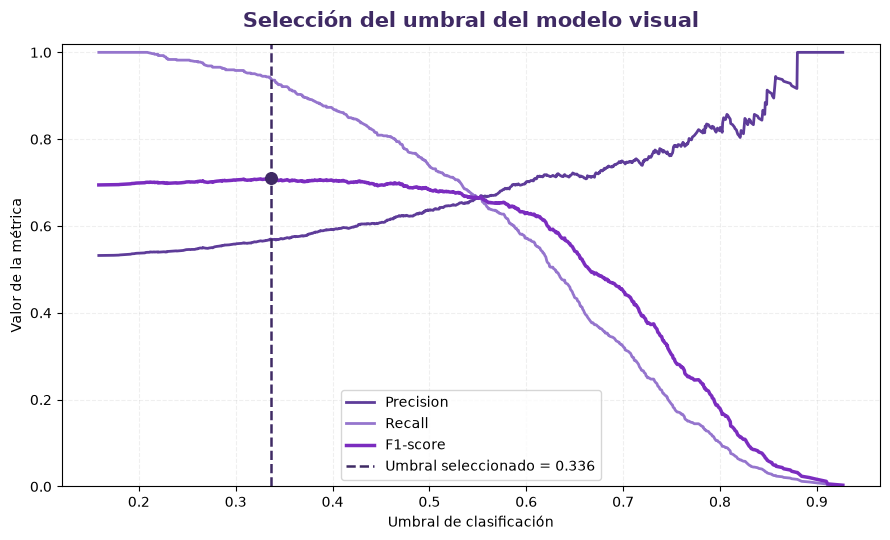

Figura guardada en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\figures\petfinder_visual_seleccion_umbral.png


In [36]:
# Evolución de Precision, Recall y F1 según el umbral

fig, ax = plt.subplots(
    figsize=(9, 5.5)
)

ax.plot(
    thresholds_curve,
    precision_curve[:-1],
    label="Precision",
    linewidth=2,
    color="#5E3C99"
)

ax.plot(
    thresholds_curve,
    recall_curve[:-1],
    label="Recall",
    linewidth=2,
    color="#9575CD"
)

ax.plot(
    thresholds_curve,
    f1_curve,
    label="F1-score",
    linewidth=2.5,
    color="#7B2CBF"
)

ax.axvline(
    umbral_visual_optimo,
    linestyle="--",
    linewidth=1.8,
    color="#3F2A64",
    label=f"Umbral seleccionado = {umbral_visual_optimo:.3f}"
)

ax.scatter(
    umbral_visual_optimo,
    f1_umbral_optimo,
    s=70,
    color="#3F2A64",
    zorder=5
)

ax.set_title(
    "Selección del umbral del modelo visual",
    fontsize=15,
    fontweight="bold",
    color="#3F2A64",
    pad=12
)

ax.set_xlabel(
    "Umbral de clasificación"
)

ax.set_ylabel(
    "Valor de la métrica"
)

ax.set_ylim(
    0,
    1.02
)

ax.grid(
    linestyle="--",
    alpha=0.20
)

ax.legend()

fig.tight_layout()

fig_path_umbral_visual = (
    figures_path
    / "petfinder_visual_seleccion_umbral.png"
)

fig.savefig(
    fig_path_umbral_visual,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("Figura guardada en:")
print(fig_path_umbral_visual)

## 9. Evaluación final del modelo visual

Una vez seleccionados la estrategia de entrenamiento y el umbral de clasificación utilizando exclusivamente los datos de desarrollo, se realiza la evaluación final sobre el conjunto de test.

El modelo utilizado corresponde a EfficientNet-B0 con el extractor de características congelado y la capa de clasificación adaptada al objetivo de adopción lenta. El umbral de decisión se fija previamente a partir del conjunto de validación y no se modifica después de observar los resultados de test.

Esta evaluación permite estimar el comportamiento del modelo visual sobre observaciones no utilizadas durante el entrenamiento, la selección del modelo ni la elección del umbral.

> **Nota metodológica.** El conjunto de test se utiliza también en análisis posteriores con fines de evaluación, interpretación y comparación. En esos bloques, las configuraciones correspondientes se fijan utilizando entrenamiento y validación y no se modifican a partir de los resultados observados en test. Por tanto, las comparaciones posteriores deben entenderse como evaluaciones independientes sobre el mismo conjunto *hold-out*, no como una nueva búsqueda global de modelos basada en test.


In [37]:
# Obtención de predicciones finales sobre test

predicciones_test_visual = obtener_predicciones_modelo(
    modelo=modelo_visual,
    loader=test_loader,
    device=device
)

y_test_visual = (
    predicciones_test_visual["y_true"]
    .to_numpy()
)

y_test_score_visual = (
    predicciones_test_visual["y_score"]
    .to_numpy()
)

metricas_test_visual = calcular_metricas_clasificacion(
    y_test_visual,
    y_test_score_visual,
    threshold=umbral_visual_optimo
)

print("Número de observaciones de test:")
print(len(predicciones_test_visual))

print("\nUmbral fijado en validación:")
print(f"{umbral_visual_optimo:.4f}")

print("\nResultados finales en test:")

print(
    f"Accuracy:          "
    f"{metricas_test_visual['accuracy']:.4f}"
)

print(
    f"Precision:         "
    f"{metricas_test_visual['precision']:.4f}"
)

print(
    f"Recall:            "
    f"{metricas_test_visual['recall']:.4f}"
)

print(
    f"F1-score:          "
    f"{metricas_test_visual['f1']:.4f}"
)

print(
    f"ROC-AUC:           "
    f"{metricas_test_visual['roc_auc']:.4f}"
)

print(
    f"Average Precision: "
    f"{metricas_test_visual['average_precision']:.4f}"
)

Número de observaciones de test:
1592

Umbral fijado en validación:
0.3359

Resultados finales en test:
Accuracy:          0.5773
Precision:         0.5618
Recall:            0.9291
F1-score:          0.7002
ROC-AUC:           0.6736
Average Precision: 0.6917


### 9.1. Matriz de confusión del modelo visual

La matriz de confusión permite analizar con mayor detalle el comportamiento del modelo sobre el conjunto de test utilizando el umbral seleccionado previamente en validación.

Dado que el modelo está orientado a identificar perros con riesgo de adopción lenta, resulta especialmente relevante observar el número de casos positivos correctamente detectados y la proporción de animales de adopción lenta que no son identificados por el modelo.

Verdaderos negativos:
133

Falsos positivos:
613

Falsos negativos:
60

Verdaderos positivos:
786


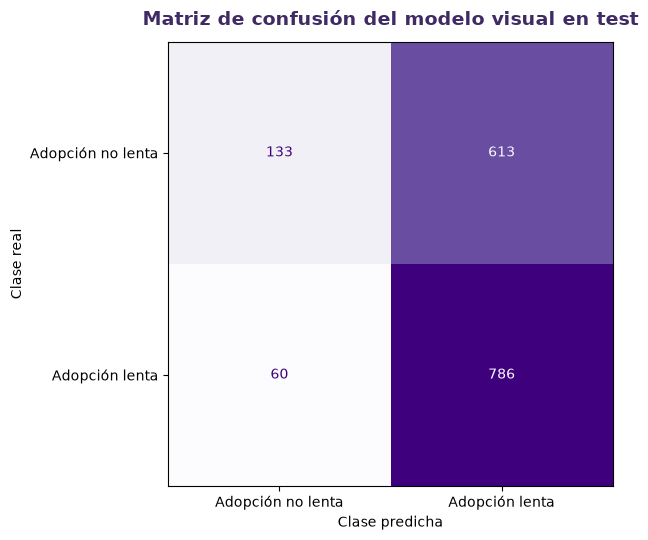

In [38]:
# Matriz de confusión sobre el conjunto de test

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

y_test_pred_visual = (
    y_test_score_visual
    >= umbral_visual_optimo
).astype(int)

matriz_confusion_visual = confusion_matrix(
    y_test_visual,
    y_test_pred_visual
)

tn, fp, fn, tp = (
    matriz_confusion_visual.ravel()
)

print("Verdaderos negativos:")
print(tn)

print("\nFalsos positivos:")
print(fp)

print("\nFalsos negativos:")
print(fn)

print("\nVerdaderos positivos:")
print(tp)

fig, ax = plt.subplots(
    figsize=(6.5, 5.5)
)

disp = ConfusionMatrixDisplay(
    confusion_matrix=matriz_confusion_visual,
    display_labels=[
        "Adopción no lenta",
        "Adopción lenta"
    ]
)

disp.plot(
    ax=ax,
    cmap="Purples",
    colorbar=False,
    values_format="d"
)

ax.set_title(
    "Matriz de confusión del modelo visual en test",
    fontsize=14,
    fontweight="bold",
    color="#3F2A64",
    pad=12
)

ax.set_xlabel(
    "Clase predicha"
)

ax.set_ylabel(
    "Clase real"
)

fig.tight_layout()

fig_path_confusion_visual = (
    figures_path
    / "petfinder_visual_matriz_confusion_test.png"
)

fig.savefig(
    fig_path_confusion_visual,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

### 9.2. Curvas ROC y Precision-Recall

La capacidad discriminativa del modelo se analiza también independientemente del umbral de clasificación mediante las curvas ROC y Precision-Recall.

La curva ROC representa el compromiso entre sensibilidad y tasa de falsos positivos a lo largo de todos los posibles umbrales, mientras que la curva Precision-Recall resulta especialmente útil para valorar la capacidad del modelo para identificar correctamente los casos de adopción lenta.

Estas representaciones complementan la matriz de confusión y permiten evaluar el comportamiento del score continuo generado por el modelo visual.

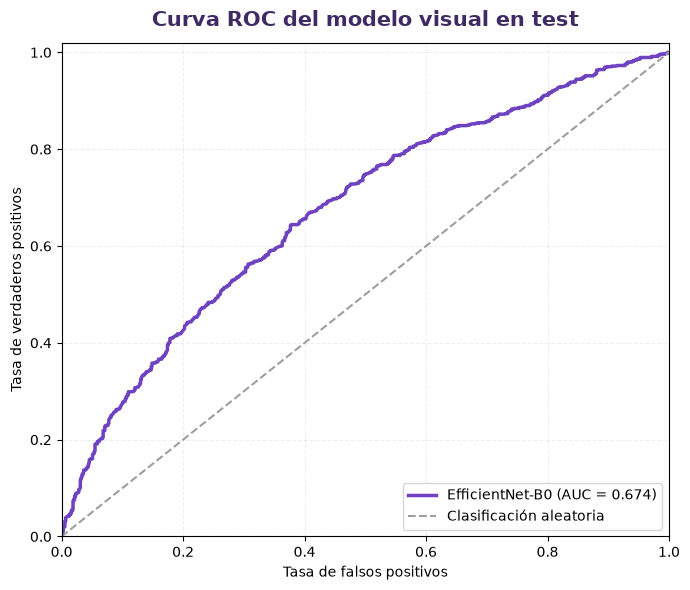

In [39]:
# Curva ROC del modelo visual en test

from sklearn.metrics import roc_curve

fpr_visual, tpr_visual, _ = roc_curve(
    y_test_visual,
    y_test_score_visual
)

fig, ax = plt.subplots(
    figsize=(7, 6)
)

ax.plot(
    fpr_visual,
    tpr_visual,
    linewidth=2.5,
    color="#6F42C1",
    label=f"EfficientNet-B0 (AUC = {metricas_test_visual['roc_auc']:.3f})"
)

ax.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    linewidth=1.5,
    color="#9E9E9E",
    label="Clasificación aleatoria"
)

ax.set_title(
    "Curva ROC del modelo visual en test",
    fontsize=15,
    fontweight="bold",
    color="#3F2A64",
    pad=12
)

ax.set_xlabel(
    "Tasa de falsos positivos"
)

ax.set_ylabel(
    "Tasa de verdaderos positivos"
)

ax.set_xlim(0, 1)
ax.set_ylim(0, 1.02)

ax.grid(
    linestyle="--",
    alpha=0.20
)

ax.legend(
    loc="lower right"
)

fig.tight_layout()

fig_path_roc_visual = (
    figures_path
    / "petfinder_visual_curva_roc_test.png"
)

fig.savefig(
    fig_path_roc_visual,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

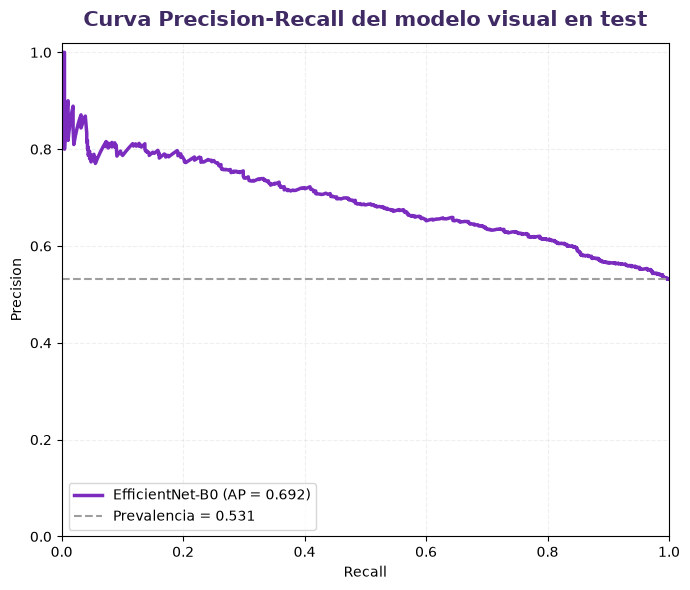

In [40]:
# Curva Precision-Recall del modelo visual en test

precision_test_curve, recall_test_curve, _ = precision_recall_curve(
    y_test_visual,
    y_test_score_visual
)

prevalencia_test_visual = (
    y_test_visual.mean()
)

fig, ax = plt.subplots(
    figsize=(7, 6)
)

ax.plot(
    recall_test_curve,
    precision_test_curve,
    linewidth=2.5,
    color="#7B2CBF",
    label=(
        "EfficientNet-B0 "
        f"(AP = {metricas_test_visual['average_precision']:.3f})"
    )
)

ax.axhline(
    prevalencia_test_visual,
    linestyle="--",
    linewidth=1.5,
    color="#9E9E9E",
    label=f"Prevalencia = {prevalencia_test_visual:.3f}"
)

ax.set_title(
    "Curva Precision-Recall del modelo visual en test",
    fontsize=15,
    fontweight="bold",
    color="#3F2A64",
    pad=12
)

ax.set_xlabel(
    "Recall"
)

ax.set_ylabel(
    "Precision"
)

ax.set_xlim(0, 1)
ax.set_ylim(0, 1.02)

ax.grid(
    linestyle="--",
    alpha=0.20
)

ax.legend(
    loc="lower left"
)

fig.tight_layout()

fig_path_pr_visual = (
    figures_path
    / "petfinder_visual_curva_precision_recall_test.png"
)

fig.savefig(
    fig_path_pr_visual,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

### 9.3. Comparación con el modelo complementario de PetFinder

Para contextualizar el rendimiento del modelo visual, se compara con el modelo complementario desarrollado en el notebook 05, basado en información estructurada, textual y de visibilidad.

La comparación se realiza exclusivamente sobre los perros del conjunto de test que disponen de una fotografía válida y que, por tanto, han podido ser evaluados por ambos modelos. De esta forma, las métricas se calculan sobre exactamente las mismas observaciones y resultan directamente comparables.

Esta comparación permite estudiar si el contenido de la fotografía aporta una capacidad predictiva similar o complementaria a la obtenida mediante las características de la ficha de adopción.

In [41]:
# Comparación del modelo visual y el modelo del notebook 05
# sobre la misma muestra de test

petfinder_scored_05_path = (
    processed_data_path
    / "petfinder_dogs_enriched_scored.csv"
)

if not petfinder_scored_05_path.exists():
    raise FileNotFoundError(
        f"No se ha encontrado el dataset puntuado del notebook 05: "
        f"{petfinder_scored_05_path}"
    )

petfinder_scored_05 = pd.read_csv(
    petfinder_scored_05_path,
    encoding="utf-8-sig"
)

predicciones_05_test = (
    petfinder_scored_05.loc[
        petfinder_scored_05[
            "origen_score_petfinder_final"
        ] == "Test fuera de muestra",
        [
            "PetID",
            "target_adopcion_lenta",
            "prob_adopcion_lenta_petfinder_final",
            "pred_adopcion_lenta_petfinder_final"
        ]
    ]
    .copy()
)

comparacion_modelos_test = (
    predicciones_test_visual
    .rename(
        columns={
            "y_true": "target_visual",
            "y_score": "score_visual"
        }
    )
    .merge(
        predicciones_05_test,
        on="PetID",
        how="inner",
        validate="one_to_one"
    )
)

print("Perros comparables en test:")
print(len(comparacion_modelos_test))

n_targets_distintos = (
    comparacion_modelos_test[
        "target_visual"
    ]
    != comparacion_modelos_test[
        "target_adopcion_lenta"
    ]
).sum()

print("\nDiferencias en la variable objetivo:")
print(n_targets_distintos)

if n_targets_distintos > 0:
    raise ValueError(
        "La variable objetivo no coincide entre ambos modelos."
    )

y_true_comparacion = (
    comparacion_modelos_test[
        "target_visual"
    ]
    .to_numpy()
)

y_score_visual_comparacion = (
    comparacion_modelos_test[
        "score_visual"
    ]
    .to_numpy()
)

y_pred_visual_comparacion = (
    y_score_visual_comparacion
    >= umbral_visual_optimo
).astype(int)

y_score_05_comparacion = (
    comparacion_modelos_test[
        "prob_adopcion_lenta_petfinder_final"
    ]
    .to_numpy()
)

y_pred_05_comparacion = (
    comparacion_modelos_test[
        "pred_adopcion_lenta_petfinder_final"
    ]
    .to_numpy()
)


resultados_comparacion_modelos = pd.DataFrame([
    {
        "modelo": "Notebook 05 - estructurado + texto",
        "accuracy": accuracy_score(
            y_true_comparacion,
            y_pred_05_comparacion
        ),
        "precision": precision_score(
            y_true_comparacion,
            y_pred_05_comparacion,
            zero_division=0
        ),
        "recall": recall_score(
            y_true_comparacion,
            y_pred_05_comparacion,
            zero_division=0
        ),
        "f1": f1_score(
            y_true_comparacion,
            y_pred_05_comparacion,
            zero_division=0
        ),
        "roc_auc": roc_auc_score(
            y_true_comparacion,
            y_score_05_comparacion
        ),
        "average_precision": average_precision_score(
            y_true_comparacion,
            y_score_05_comparacion
        )
    },
    {
        "modelo": "Notebook 06 - EfficientNet-B0",
        "accuracy": accuracy_score(
            y_true_comparacion,
            y_pred_visual_comparacion
        ),
        "precision": precision_score(
            y_true_comparacion,
            y_pred_visual_comparacion,
            zero_division=0
        ),
        "recall": recall_score(
            y_true_comparacion,
            y_pred_visual_comparacion,
            zero_division=0
        ),
        "f1": f1_score(
            y_true_comparacion,
            y_pred_visual_comparacion,
            zero_division=0
        ),
        "roc_auc": roc_auc_score(
            y_true_comparacion,
            y_score_visual_comparacion
        ),
        "average_precision": average_precision_score(
            y_true_comparacion,
            y_score_visual_comparacion
        )
    }
])

print("\nComparación sobre la misma muestra de test:")

display(
    resultados_comparacion_modelos.round(4)
)

Perros comparables en test:
1592

Diferencias en la variable objetivo:
0

Comparación sobre la misma muestra de test:


,modelo,accuracy,precision,recall,f1,roc_auc,average_precision
0,Notebook 05 - estructurado + texto,0.6363,0.6034,0.9208,0.7291,0.7377,0.7528
1,Notebook 06 - EfficientNet-B0,0.5773,0.5618,0.9291,0.7002,0.6736,0.6917


## 10. Complementariedad entre las señales visuales y el modelo de PetFinder

El modelo basado exclusivamente en imágenes presenta capacidad predictiva, aunque su rendimiento global es inferior al obtenido mediante las variables estructuradas, textuales y de visibilidad analizadas en el notebook 05.

Este resultado no implica necesariamente que la información visual sea redundante. Dos modelos pueden presentar rendimientos diferentes y, al mismo tiempo, identificar patrones complementarios.

Antes de plantear una posible combinación de scores, se analiza por tanto la relación entre las probabilidades generadas por ambos enfoques y el grado de coincidencia entre sus predicciones. Para evitar utilizar el conjunto de test en decisiones posteriores de modelado, este análisis se realiza sobre el conjunto de validación.

In [42]:
# Comparación de los scores sobre el conjunto de validación

predicciones_05_valid = (
    petfinder_scored_05.loc[
        (
            petfinder_scored_05[
                "origen_score_petfinder_final"
            ] == "OOF desarrollo"
        ),
        [
            "PetID",
            "target_adopcion_lenta",
            "prob_adopcion_lenta_petfinder_final",
            "pred_adopcion_lenta_petfinder_final"
        ]
    ]
    .copy()
)

comparacion_valid_modelos = (
    predicciones_valid_visual
    .rename(
        columns={
            "y_true": "target_visual",
            "y_score": "score_visual"
        }
    )
    .merge(
        predicciones_05_valid,
        on="PetID",
        how="inner",
        validate="one_to_one"
    )
)

print("Perros comparables en validación:")
print(len(comparacion_valid_modelos))

n_targets_distintos_valid = (
    comparacion_valid_modelos["target_visual"]
    != comparacion_valid_modelos["target_adopcion_lenta"]
).sum()

print("\nDiferencias en la variable objetivo:")
print(n_targets_distintos_valid)

if n_targets_distintos_valid > 0:
    raise ValueError(
        "La variable objetivo no coincide entre ambos modelos."
    )

# Predicción binaria del modelo visual
comparacion_valid_modelos["pred_visual"] = (
    comparacion_valid_modelos["score_visual"]
    >= umbral_visual_optimo
).astype(int)

# Correlación entre los scores
correlacion_pearson = (
    comparacion_valid_modelos[
        [
            "score_visual",
            "prob_adopcion_lenta_petfinder_final"
        ]
    ]
    .corr(method="pearson")
    .iloc[0, 1]
)

correlacion_spearman = (
    comparacion_valid_modelos[
        [
            "score_visual",
            "prob_adopcion_lenta_petfinder_final"
        ]
    ]
    .corr(method="spearman")
    .iloc[0, 1]
)

print("\nCorrelación de Pearson entre scores:")
print(f"{correlacion_pearson:.4f}")

print("\nCorrelación de Spearman entre scores:")
print(f"{correlacion_spearman:.4f}")

# Coincidencia entre clasificaciones
coincidencia_predicciones = (
    comparacion_valid_modelos["pred_visual"]
    == comparacion_valid_modelos[
        "pred_adopcion_lenta_petfinder_final"
    ]
).mean()

print("\nCoincidencia entre las clasificaciones:")
print(f"{coincidencia_predicciones * 100:.2f}%")

# Análisis específico de los casos reales de adopción lenta
positivos_valid = comparacion_valid_modelos.loc[
    comparacion_valid_modelos["target_visual"] == 1
].copy()

positivos_valid["detectado_05"] = (
    positivos_valid[
        "pred_adopcion_lenta_petfinder_final"
    ] == 1
)

positivos_valid["detectado_visual"] = (
    positivos_valid["pred_visual"] == 1
)

resumen_complementariedad = pd.DataFrame({
    "situacion": [
        "Detectados por ambos",
        "Solo por notebook 05",
        "Solo por modelo visual",
        "No detectados por ninguno"
    ],
    "n_perros": [
        (
            positivos_valid["detectado_05"]
            & positivos_valid["detectado_visual"]
        ).sum(),
        (
            positivos_valid["detectado_05"]
            & ~positivos_valid["detectado_visual"]
        ).sum(),
        (
            ~positivos_valid["detectado_05"]
            & positivos_valid["detectado_visual"]
        ).sum(),
        (
            ~positivos_valid["detectado_05"]
            & ~positivos_valid["detectado_visual"]
        ).sum()
    ]
})

print("\nComplementariedad en perros con adopción lenta:")

display(
    resumen_complementariedad
)

Perros comparables en validación:
1261

Diferencias en la variable objetivo:
0

Correlación de Pearson entre scores:
0.5066

Correlación de Spearman entre scores:
0.5104

Coincidencia entre las clasificaciones:
79.78%

Complementariedad en perros con adopción lenta:


,situacion,n_perros
0,Detectados por ambos,584
1,Solo por notebook 05,27
2,Solo por modelo visual,47
3,No detectados por ninguno,13


### 10.1. Fusión tardía de los scores

La correlación moderada observada entre las probabilidades de ambos modelos, junto con la existencia de perros de adopción lenta identificados exclusivamente por el modelo visual, indica que ambas aproximaciones contienen información parcialmente complementaria.

A partir de esta evidencia se evalúa una estrategia de fusión tardía, combinando el score del modelo estructurado y textual del notebook 05 con la probabilidad generada por EfficientNet-B0.

Los pesos de la combinación y el correspondiente umbral de clasificación se seleccionan exclusivamente sobre el conjunto de validación. Se utiliza una búsqueda deliberadamente acotada de pesos para evitar una optimización excesiva, manteniendo el conjunto de test completamente fuera de este proceso.

In [43]:
# Búsqueda de pesos para la fusión tardía

y_valid_fusion = (
    comparacion_valid_modelos[
        "target_visual"
    ]
    .to_numpy()
)

score_05_valid = (
    comparacion_valid_modelos[
        "prob_adopcion_lenta_petfinder_final"
    ]
    .to_numpy()
)

score_visual_valid = (
    comparacion_valid_modelos[
        "score_visual"
    ]
    .to_numpy()
)

resultados_fusion_valid = []

pesos_modelo_05 = np.arange(
    0.0,
    1.01,
    0.05
)

for peso_05 in pesos_modelo_05:

    peso_visual = 1.0 - peso_05

    score_fusion = (
        peso_05 * score_05_valid
        + peso_visual * score_visual_valid
    )

    precision_fusion, recall_fusion, thresholds_fusion = (
        precision_recall_curve(
            y_valid_fusion,
            score_fusion
        )
    )

    f1_fusion = (
        2
        * precision_fusion[:-1]
        * recall_fusion[:-1]
        / (
            precision_fusion[:-1]
            + recall_fusion[:-1]
            + 1e-12
        )
    )

    indice_mejor = np.argmax(
        f1_fusion
    )

    umbral_fusion = float(
        thresholds_fusion[
            indice_mejor
        ]
    )

    metricas_fusion = (
        calcular_metricas_clasificacion(
            y_valid_fusion,
            score_fusion,
            threshold=umbral_fusion
        )
    )

    resultados_fusion_valid.append({
        "peso_modelo_05": peso_05,
        "peso_visual": peso_visual,
        "umbral": umbral_fusion,
        "precision": metricas_fusion["precision"],
        "recall": metricas_fusion["recall"],
        "f1": metricas_fusion["f1"],
        "roc_auc": metricas_fusion["roc_auc"],
        "average_precision": metricas_fusion[
            "average_precision"
        ]
    })


resultados_fusion_valid = pd.DataFrame(
    resultados_fusion_valid
)

resultados_fusion_valid = (
    resultados_fusion_valid
    .sort_values(
        [
            "f1",
            "average_precision",
            "precision"
        ],
        ascending=[
            False,
            False,
            False
        ]
    )
    .reset_index(drop=True)
)

mejor_fusion_valid = (
    resultados_fusion_valid
    .iloc[0]
)

peso_05_fusion = float(
    mejor_fusion_valid[
        "peso_modelo_05"
    ]
)

peso_visual_fusion = float(
    mejor_fusion_valid[
        "peso_visual"
    ]
)

umbral_fusion_optimo = float(
    mejor_fusion_valid[
        "umbral"
    ]
)

print("Mejor combinación encontrada en validación:")

print("\nPeso modelo notebook 05:")
print(f"{peso_05_fusion:.2f}")

print("\nPeso modelo visual:")
print(f"{peso_visual_fusion:.2f}")

print("\nUmbral seleccionado:")
print(f"{umbral_fusion_optimo:.4f}")

print("\nMétricas de la mejor combinación:")
display(
    resultados_fusion_valid
    .head(10)
    .round(4)
)

Mejor combinación encontrada en validación:

Peso modelo notebook 05:
0.65

Peso modelo visual:
0.35

Umbral seleccionado:
0.4566

Métricas de la mejor combinación:


,peso_modelo_05,peso_visual,umbral,precision,recall,f1,roc_auc,average_precision
0,0.65,0.35,0.4566,0.6528,0.8629,0.7433,0.7489,0.7701
1,0.70,0.30,0.4623,0.6578,0.8510,0.7420,0.7495,0.7705
2,0.60,0.40,0.4537,0.6481,0.8674,0.7419,0.7471,0.7681
3,0.75,0.25,0.4543,0.6512,0.8599,0.7412,0.7493,0.7701
4,0.55,0.45,0.4376,0.6319,0.8927,0.7400,0.7448,0.7660
5,0.80,0.20,0.4454,0.6435,0.8689,0.7394,0.7482,0.7693
6,0.50,0.50,0.4243,0.6195,0.9076,0.7364,0.7418,0.7630
7,0.85,0.15,0.4568,0.6523,0.8331,0.7317,0.7463,0.7672
8,0.45,0.55,0.4183,0.6129,0.9061,0.7312,0.7382,0.7597
9,0.90,0.10,0.3899,0.5990,0.9374,0.7310,0.7432,0.7642


### 10.2. Comparación de los modelos sobre validación

Una vez seleccionados los pesos de la fusión, se compara su rendimiento con el obtenido por cada modelo individual sobre la misma muestra de validación.

Esta comparación permite cuantificar si la incorporación de la señal visual aporta información adicional respecto al modelo estructurado y textual. Los pesos y el umbral de la combinación quedan fijados en esta etapa y no se modificarán posteriormente a partir de los resultados del conjunto de test.

In [44]:
# Comparación de los modelos individuales y la fusión en validación

y_pred_05_valid = (
    comparacion_valid_modelos[
        "pred_adopcion_lenta_petfinder_final"
    ]
    .to_numpy()
)

y_pred_visual_valid = (
    score_visual_valid
    >= umbral_visual_optimo
).astype(int)

score_fusion_valid = (
    peso_05_fusion * score_05_valid
    + peso_visual_fusion * score_visual_valid
)

y_pred_fusion_valid = (
    score_fusion_valid
    >= umbral_fusion_optimo
).astype(int)


comparacion_final_valid = pd.DataFrame([
    {
        "modelo": "Notebook 05 - estructurado + texto",
        "precision": precision_score(
            y_valid_fusion,
            y_pred_05_valid,
            zero_division=0
        ),
        "recall": recall_score(
            y_valid_fusion,
            y_pred_05_valid,
            zero_division=0
        ),
        "f1": f1_score(
            y_valid_fusion,
            y_pred_05_valid,
            zero_division=0
        ),
        "roc_auc": roc_auc_score(
            y_valid_fusion,
            score_05_valid
        ),
        "average_precision": average_precision_score(
            y_valid_fusion,
            score_05_valid
        )
    },
    {
        "modelo": "Notebook 06 - EfficientNet-B0",
        "precision": precision_score(
            y_valid_fusion,
            y_pred_visual_valid,
            zero_division=0
        ),
        "recall": recall_score(
            y_valid_fusion,
            y_pred_visual_valid,
            zero_division=0
        ),
        "f1": f1_score(
            y_valid_fusion,
            y_pred_visual_valid,
            zero_division=0
        ),
        "roc_auc": roc_auc_score(
            y_valid_fusion,
            score_visual_valid
        ),
        "average_precision": average_precision_score(
            y_valid_fusion,
            score_visual_valid
        )
    },
    {
        "modelo": "Fusión multimodal",
        "precision": precision_score(
            y_valid_fusion,
            y_pred_fusion_valid,
            zero_division=0
        ),
        "recall": recall_score(
            y_valid_fusion,
            y_pred_fusion_valid,
            zero_division=0
        ),
        "f1": f1_score(
            y_valid_fusion,
            y_pred_fusion_valid,
            zero_division=0
        ),
        "roc_auc": roc_auc_score(
            y_valid_fusion,
            score_fusion_valid
        ),
        "average_precision": average_precision_score(
            y_valid_fusion,
            score_fusion_valid
        )
    }
])

print("Comparación de modelos sobre validación:")

display(
    comparacion_final_valid.round(4)
)

print("\nConfiguración final de la fusión:")
print(f"Peso notebook 05: {peso_05_fusion:.2f}")
print(f"Peso visual:      {peso_visual_fusion:.2f}")
print(f"Umbral:           {umbral_fusion_optimo:.4f}")

Comparación de modelos sobre validación:


,modelo,precision,recall,f1,roc_auc,average_precision
0,Notebook 05 - estructurado + texto,0.5955,0.9106,0.7201,0.7354,0.7564
1,Notebook 06 - EfficientNet-B0,0.5700,0.9404,0.7098,0.6884,0.7059
2,Fusión multimodal,0.6528,0.8629,0.7433,0.7489,0.7701



Configuración final de la fusión:
Peso notebook 05: 0.65
Peso visual:      0.35
Umbral:           0.4566


### 10.3. Evaluación final de la fusión multimodal

Una vez seleccionados los pesos y el umbral de decisión exclusivamente sobre validación, la configuración de la fusión queda fijada antes de su evaluación sobre test.

El score multimodal combina un 65 % de la probabilidad generada por el modelo estructurado y textual del notebook 05 y un 35 % de la probabilidad obtenida mediante EfficientNet-B0. El umbral de clasificación se mantiene en 0,4566.

La evaluación sobre test se realiza una única vez y sus resultados no se utilizan para modificar posteriormente los pesos, el umbral ni los modelos individuales.

In [45]:
# Evaluación final de la fusión multimodal sobre test

y_test_fusion = (
    comparacion_modelos_test[
        "target_visual"
    ]
    .to_numpy()
)

score_05_test = (
    comparacion_modelos_test[
        "prob_adopcion_lenta_petfinder_final"
    ]
    .to_numpy()
)

score_visual_test = (
    comparacion_modelos_test[
        "score_visual"
    ]
    .to_numpy()
)

score_fusion_test = (
    peso_05_fusion * score_05_test
    + peso_visual_fusion * score_visual_test
)

y_pred_fusion_test = (
    score_fusion_test
    >= umbral_fusion_optimo
).astype(int)

metricas_fusion_test = {
    "accuracy": accuracy_score(
        y_test_fusion,
        y_pred_fusion_test
    ),
    "precision": precision_score(
        y_test_fusion,
        y_pred_fusion_test,
        zero_division=0
    ),
    "recall": recall_score(
        y_test_fusion,
        y_pred_fusion_test,
        zero_division=0
    ),
    "f1": f1_score(
        y_test_fusion,
        y_pred_fusion_test,
        zero_division=0
    ),
    "roc_auc": roc_auc_score(
        y_test_fusion,
        score_fusion_test
    ),
    "average_precision": average_precision_score(
        y_test_fusion,
        score_fusion_test
    )
}

print("Configuración fijada en validación:")

print(
    f"Peso notebook 05: "
    f"{peso_05_fusion:.2f}"
)

print(
    f"Peso visual:      "
    f"{peso_visual_fusion:.2f}"
)

print(
    f"Umbral:           "
    f"{umbral_fusion_optimo:.4f}"
)

print("\nResultados finales de la fusión en test:")

print(
    f"Accuracy:          "
    f"{metricas_fusion_test['accuracy']:.4f}"
)

print(
    f"Precision:         "
    f"{metricas_fusion_test['precision']:.4f}"
)

print(
    f"Recall:            "
    f"{metricas_fusion_test['recall']:.4f}"
)

print(
    f"F1-score:          "
    f"{metricas_fusion_test['f1']:.4f}"
)

print(
    f"ROC-AUC:           "
    f"{metricas_fusion_test['roc_auc']:.4f}"
)

print(
    f"Average Precision: "
    f"{metricas_fusion_test['average_precision']:.4f}"
)

Configuración fijada en validación:
Peso notebook 05: 0.65
Peso visual:      0.35
Umbral:           0.4566

Resultados finales de la fusión en test:
Accuracy:          0.6639
Precision:         0.6385
Recall:            0.8475
F1-score:          0.7283
ROC-AUC:           0.7446
Average Precision: 0.7617


### 10.4. Comparación final de los enfoques

La evaluación sobre test confirma que la incorporación de la información visual modifica el comportamiento predictivo del modelo.

La fusión multimodal mejora la precisión, la exactitud, ROC-AUC y Average Precision respecto al modelo estructurado y textual, lo que indica una mayor capacidad de discriminación del score combinado. Sin embargo, esta mejora se acompaña de una reducción del Recall y el F1-score permanece prácticamente inalterado.

Por tanto, la señal visual aporta información complementaria, pero no sustituye al modelo desarrollado en el notebook 05. El modelo estructurado y textual mantiene una mayor sensibilidad para detectar perros con adopción lenta, mientras que la combinación multimodal proporciona un score más selectivo y con una mejor capacidad global de ranking.

Estos resultados apoyan el uso de la información visual como una capa complementaria dentro del enfoque *Invisible Dogs*, en lugar de utilizarla de forma aislada.

In [46]:
# Comparación final de los modelos sobre la misma muestra de test

comparacion_final_test = pd.DataFrame([
    {
        "modelo": "Notebook 05 - estructurado + texto",
        "accuracy": accuracy_score(
            y_true_comparacion,
            y_pred_05_comparacion
        ),
        "precision": precision_score(
            y_true_comparacion,
            y_pred_05_comparacion,
            zero_division=0
        ),
        "recall": recall_score(
            y_true_comparacion,
            y_pred_05_comparacion,
            zero_division=0
        ),
        "f1": f1_score(
            y_true_comparacion,
            y_pred_05_comparacion,
            zero_division=0
        ),
        "roc_auc": roc_auc_score(
            y_true_comparacion,
            y_score_05_comparacion
        ),
        "average_precision": average_precision_score(
            y_true_comparacion,
            y_score_05_comparacion
        )
    },
    {
        "modelo": "Notebook 06 - EfficientNet-B0",
        "accuracy": metricas_test_visual["accuracy"],
        "precision": metricas_test_visual["precision"],
        "recall": metricas_test_visual["recall"],
        "f1": metricas_test_visual["f1"],
        "roc_auc": metricas_test_visual["roc_auc"],
        "average_precision": metricas_test_visual[
            "average_precision"
        ]
    },
    {
        "modelo": "Fusión multimodal",
        "accuracy": metricas_fusion_test["accuracy"],
        "precision": metricas_fusion_test["precision"],
        "recall": metricas_fusion_test["recall"],
        "f1": metricas_fusion_test["f1"],
        "roc_auc": metricas_fusion_test["roc_auc"],
        "average_precision": metricas_fusion_test[
            "average_precision"
        ]
    }
])

display(
    comparacion_final_test.round(4)
)

,modelo,accuracy,precision,recall,f1,roc_auc,average_precision
0,Notebook 05 - estructurado + texto,0.6363,0.6034,0.9208,0.7291,0.7377,0.7528
1,Notebook 06 - EfficientNet-B0,0.5773,0.5618,0.9291,0.7002,0.6736,0.6917
2,Fusión multimodal,0.6639,0.6385,0.8475,0.7283,0.7446,0.7617


## 11. Interpretabilidad visual mediante Grad-CAM

Además de evaluar la capacidad predictiva del modelo visual, resulta relevante analizar qué regiones de las fotografías contribuyen en mayor medida a sus predicciones.

Para ello se utiliza **Grad-CAM**, una técnica de interpretabilidad aplicada a redes convolucionales que genera mapas de activación a partir de las características internas del modelo y de los gradientes asociados a una predicción concreta.

El objetivo de este análisis no es atribuir relaciones causales a elementos específicos de la fotografía, sino explorar qué zonas reciben mayor atención por parte de EfficientNet-B0 al estimar el riesgo de adopción lenta. Dado que el modelo y el umbral ya han sido seleccionados previamente, esta etapa tiene un carácter exclusivamente interpretativo.

In [47]:
# Preparación del preprocesamiento utilizado en Grad-CAM

from torchvision import transforms
from torchvision.transforms import InterpolationMode

# Misma geometría utilizada en validación y test
transform_display = transforms.Compose([
    transforms.Resize(
        256,
        interpolation=InterpolationMode.BILINEAR,
        antialias=True
    ),
    transforms.CenterCrop(
        (224, 224)
    )
])

# Estadísticos de normalización de ImageNet
mean_imagenet = torch.tensor(
    [0.485, 0.456, 0.406],
    dtype=torch.float32
).view(3, 1, 1)

std_imagenet = torch.tensor(
    [0.229, 0.224, 0.225],
    dtype=torch.float32
).view(3, 1, 1)

print("Preprocesamiento de Grad-CAM preparado correctamente.")

print("\nMedia ImageNet:")
print(mean_imagenet.flatten())

print("\nDesviación estándar ImageNet:")
print(std_imagenet.flatten())

Preprocesamiento de Grad-CAM preparado correctamente.

Media ImageNet:
tensor([0.4850, 0.4560, 0.4060])

Desviación estándar ImageNet:
tensor([0.2290, 0.2240, 0.2250])


In [48]:
# Preparación de Grad-CAM

import torch.nn.functional as F


def generar_gradcam(
    modelo,
    tensor_imagen,
    capa_objetivo,
    device,
    clase_objetivo=1
):
    modelo.eval()

    activaciones = {}

    def guardar_activaciones(
        modulo,
        entrada,
        salida
    ):
        activaciones["valor"] = salida
        salida.retain_grad()

    hook = capa_objetivo.register_forward_hook(
        guardar_activaciones
    )

    try:

        # Se activa el seguimiento de gradientes respecto a la imagen
        # para poder obtener los gradientes en el extractor congelado.
        tensor_imagen = (
            tensor_imagen
            .clone()
            .detach()
            .to(device)
            .requires_grad_(True)
        )

        modelo.zero_grad(
            set_to_none=True
        )

        logit = (
            modelo(tensor_imagen)
            .squeeze()
        )

        # Probabilidad estimada de adopción lenta
        probabilidad = torch.sigmoid(
            logit
        )

        # ---------------------------------------------------------
        # Selección de la clase cuya evidencia se quiere interpretar
        # ---------------------------------------------------------

        if clase_objetivo == 1:
            # Evidencia a favor de adopción lenta
            score_objetivo = logit

        elif clase_objetivo == 0:
            # En clasificación binaria con un único logit,
            # la evidencia de la clase negativa se representa
            # mediante el signo opuesto.
            score_objetivo = -logit

        else:
            raise ValueError(
                "clase_objetivo debe ser 0 o 1."
            )

        score_objetivo.backward()

        mapa_activaciones = (
            activaciones["valor"]
        )

        gradientes = (
            mapa_activaciones.grad
        )

        pesos = gradientes.mean(
            dim=(2, 3),
            keepdim=True
        )

        gradcam = (
            pesos
            * mapa_activaciones
        ).sum(
            dim=1,
            keepdim=True
        )

        gradcam = F.relu(
            gradcam
        )

        gradcam = F.interpolate(
            gradcam,
            size=(IMAGE_SIZE, IMAGE_SIZE),
            mode="bilinear",
            align_corners=False
        )

        gradcam = (
            gradcam
            .squeeze()
            .detach()
            .cpu()
            .numpy()
        )

        gradcam_min = gradcam.min()
        gradcam_max = gradcam.max()

        gradcam = (
            gradcam - gradcam_min
        ) / (
            gradcam_max
            - gradcam_min
            + 1e-8
        )

        return (
            gradcam,
            float(
                probabilidad
                .detach()
                .cpu()
            )
        )

    finally:
        hook.remove()


# Última capa convolucional de EfficientNet-B0
capa_gradcam = (
    modelo_visual.features[-1]
)

print("Capa utilizada para Grad-CAM:")
print(capa_gradcam)

print("\nGrad-CAM preparado correctamente.")

Capa utilizada para Grad-CAM:
Conv2dNormActivation(
  (0): Conv2d(320, 1280, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (1): BatchNorm2d(1280, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): SiLU(inplace=True)
)

Grad-CAM preparado correctamente.


### 11.1. Comprobación de Grad-CAM sobre una fotografía

Antes de extender el análisis a varios casos, se genera un primer mapa Grad-CAM sobre una fotografía del conjunto de test correctamente clasificada como adopción lenta.

La visualización se realiza sobre la misma versión de la imagen utilizada como entrada del modelo, de forma que las regiones destacadas por Grad-CAM queden correctamente alineadas con el contenido procesado por EfficientNet-B0.

Las zonas con mayor intensidad representan regiones que han tenido una mayor influencia sobre la salida del modelo para ese caso concreto. Esta información debe interpretarse como evidencia sobre el comportamiento interno de la red y no como una relación causal con la adopción.

In [49]:
# Preparación de las predicciones de test para el análisis Grad-CAM

predicciones_test_gradcam = (
    predicciones_test_visual
    .copy()
    .reset_index(drop=True)
)

# ---------------------------------------------------------
# Incorporación del PetID si no está incluido
# ---------------------------------------------------------

if "PetID" not in predicciones_test_gradcam.columns:

    if len(predicciones_test_gradcam) != len(test_visual_df):
        raise ValueError(
            "El número de predicciones no coincide "
            "con el número de observaciones de test."
        )

    predicciones_test_gradcam[
        "PetID"
    ] = (
        test_visual_df[
            "PetID"
        ]
        .astype(str)
        .reset_index(drop=True)
    )

else:

    predicciones_test_gradcam[
        "PetID"
    ] = (
        predicciones_test_gradcam[
            "PetID"
        ]
        .astype(str)
    )


# ---------------------------------------------------------
# Clase predicha utilizando el umbral fijado en validación
# ---------------------------------------------------------

predicciones_test_gradcam[
    "y_pred"
] = (
    predicciones_test_gradcam[
        "y_score"
    ]
    >= umbral_visual_optimo
).astype(int)


# ---------------------------------------------------------
# Incorporación de la ruta de la fotografía
# ---------------------------------------------------------

rutas_test_gradcam = (
    test_visual_df[
        [
            "PetID",
            "ruta_imagen_principal"
        ]
    ]
    .copy()
)

rutas_test_gradcam[
    "PetID"
] = (
    rutas_test_gradcam[
        "PetID"
    ]
    .astype(str)
)

if (
    "ruta_imagen_principal"
    not in predicciones_test_gradcam.columns
):

    predicciones_test_gradcam = (
        predicciones_test_gradcam
        .merge(
            rutas_test_gradcam,
            on="PetID",
            how="left",
            validate="one_to_one"
        )
    )


# ---------------------------------------------------------
# Comprobaciones
# ---------------------------------------------------------

print("Predicciones preparadas para Grad-CAM:")
print(
    predicciones_test_gradcam.shape
)

print("\nColumnas disponibles:")
print(
    predicciones_test_gradcam.columns.tolist()
)

print("\nDistribución de las predicciones:")

display(
    pd.crosstab(
        predicciones_test_gradcam[
            "y_true"
        ],
        predicciones_test_gradcam[
            "y_pred"
        ],
        rownames=[
            "Clase real"
        ],
        colnames=[
            "Clase predicha"
        ]
    )
)

print("\nPrimeras filas:")

display(
    predicciones_test_gradcam[
        [
            "PetID",
            "y_true",
            "y_score",
            "y_pred",
            "ruta_imagen_principal"
        ]
    ]
    .head()
)

Predicciones preparadas para Grad-CAM:
(1592, 5)

Columnas disponibles:
['PetID', 'y_true', 'y_score', 'y_pred', 'ruta_imagen_principal']

Distribución de las predicciones:


Clase predicha,0,1
Clase real,,
0,133,613
1,60,786



Primeras filas:


,PetID,y_true,y_score,y_pred,ruta_imagen_principal
0,850a43f90,0,0.242188,0,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
1,c02be41e6,0,0.772949,1,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
2,1a76190c5,1,0.264648,0,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
3,4e3640544,1,0.642090,1,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...
4,b0dec8779,1,0.165649,0,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...


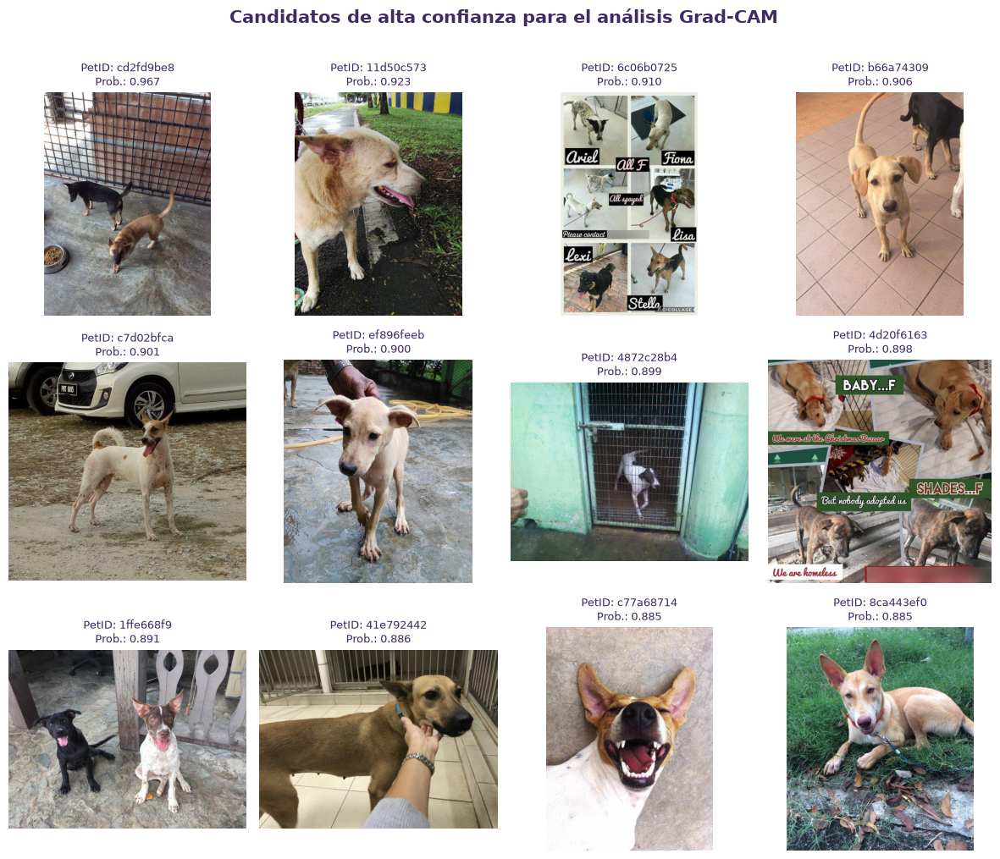

In [50]:
# Selección de candidatos para el ejemplo Grad-CAM

candidatos_gradcam = (
    predicciones_test_gradcam.loc[
        (
            predicciones_test_gradcam["y_true"] == 1
        )
        & (
            predicciones_test_gradcam["y_pred"] == 1
        )
    ]
    .sort_values(
        "y_score",
        ascending=False
    )
    .head(12)
    .reset_index(drop=True)
)

fig, axes = plt.subplots(
    3,
    4,
    figsize=(12, 10)
)

axes = axes.flatten()

for ax, fila in zip(
    axes,
    candidatos_gradcam.itertuples(index=False)
):
    with Image.open(
        fila.ruta_imagen_principal
    ) as imagen:
        imagen = imagen.convert("RGB")
        ax.imshow(imagen)

    ax.set_title(
        f"PetID: {fila.PetID}\n"
        f"Prob.: {fila.y_score:.3f}",
        fontsize=9,
        color="#3F2A64"
    )

    ax.axis("off")

fig.suptitle(
    "Candidatos de alta confianza para el análisis Grad-CAM",
    fontsize=15,
    fontweight="bold",
    color="#3F2A64",
    y=1.01
)

fig.tight_layout()

plt.show()

In [51]:
# Selección manual del ejemplo para Grad-CAM

petid_gradcam_manual = "c7d02bfca"

coincidencia_gradcam = predicciones_test_gradcam.loc[
    predicciones_test_gradcam["PetID"] == petid_gradcam_manual
]

if coincidencia_gradcam.empty:
    raise ValueError(
        f"No se ha encontrado el PetID {petid_gradcam_manual}."
    )

ejemplo_gradcam = coincidencia_gradcam.iloc[0]

print("PetID seleccionado:")
print(ejemplo_gradcam["PetID"])

print("\nClase real:")
print(
    "Adopción lenta"
    if int(ejemplo_gradcam["y_true"]) == 1
    else "Adopción no lenta"
)

print("\nClase predicha:")
print(
    "Adopción lenta"
    if int(ejemplo_gradcam["y_pred"]) == 1
    else "Adopción no lenta"
)

print("\nProbabilidad estimada:")
print(f"{ejemplo_gradcam['y_score']:.4f}")

print("\nRuta de la imagen:")
print(ejemplo_gradcam["ruta_imagen_principal"])

PetID seleccionado:
c7d02bfca

Clase real:
Adopción lenta

Clase predicha:
Adopción lenta

Probabilidad estimada:
0.9014

Ruta de la imagen:
g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_petfinder\train_images\c7d02bfca-1.jpg


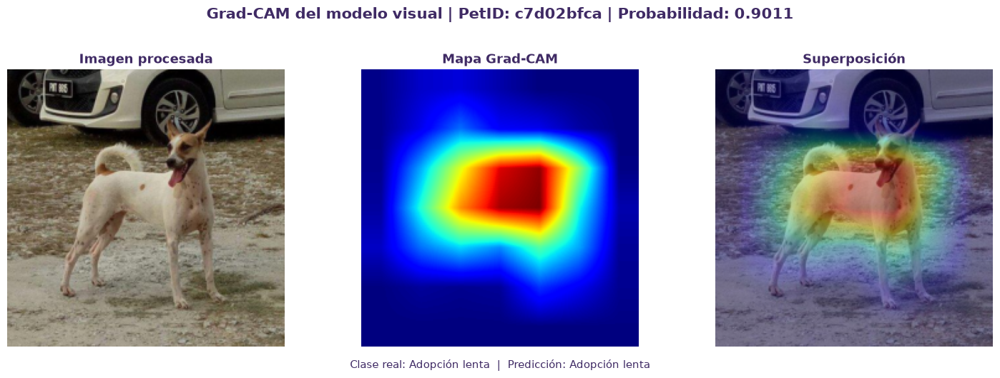

Figura guardada en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\figures\gradcam_ejemplo_c7d02bfca.png


In [52]:
# Visualización Grad-CAM del perro seleccionado

import matplotlib.cm as cm

ruta_ejemplo_gradcam = (
    ejemplo_gradcam["ruta_imagen_principal"]
)

# Preparación de la misma imagen que recibe el modelo
with Image.open(ruta_ejemplo_gradcam) as imagen:
    imagen = imagen.convert("RGB")
    imagen_display_pil = transform_display(imagen)

imagen_display_np = (
    np.array(imagen_display_pil)
    .astype(np.float32)
    / 255.0
)

imagen_tensor = torch.from_numpy(
    imagen_display_np.transpose(2, 0, 1)
).float()

imagen_tensor_norm = (
    (imagen_tensor - mean_imagenet)
    / std_imagenet
).unsqueeze(0)

# Generación de Grad-CAM
mapa_gradcam, prob_gradcam = generar_gradcam(
    modelo=modelo_visual,
    tensor_imagen=imagen_tensor_norm,
    capa_objetivo=capa_gradcam,
    device=device
)

# Mapa de calor
heatmap = cm.jet(
    mapa_gradcam
)[..., :3]

# Superposición sobre la fotografía
overlay = (
    0.70 * imagen_display_np
    + 0.30 * heatmap
)

overlay = np.clip(
    overlay,
    0,
    1
)

clase_real = (
    "Adopción lenta"
    if int(ejemplo_gradcam["y_true"]) == 1
    else "Adopción no lenta"
)

clase_predicha = (
    "Adopción lenta"
    if prob_gradcam >= umbral_visual_optimo
    else "Adopción no lenta"
)

fig, axes = plt.subplots(
    1,
    3,
    figsize=(15, 5)
)

axes[0].imshow(
    imagen_display_np
)

axes[0].set_title(
    "Imagen procesada",
    fontsize=13,
    fontweight="bold",
    color="#3F2A64"
)

axes[0].axis("off")


axes[1].imshow(
    mapa_gradcam,
    cmap="jet"
)

axes[1].set_title(
    "Mapa Grad-CAM",
    fontsize=13,
    fontweight="bold",
    color="#3F2A64"
)

axes[1].axis("off")


axes[2].imshow(
    overlay
)

axes[2].set_title(
    "Superposición",
    fontsize=13,
    fontweight="bold",
    color="#3F2A64"
)

axes[2].axis("off")


fig.suptitle(
    (
        f"Grad-CAM del modelo visual | "
        f"PetID: {ejemplo_gradcam['PetID']} | "
        f"Probabilidad: {prob_gradcam:.4f}"
    ),
    fontsize=15,
    fontweight="bold",
    color="#3F2A64",
    y=1.02
)

fig.text(
    0.5,
    0.01,
    (
        f"Clase real: {clase_real}  |  "
        f"Predicción: {clase_predicha}"
    ),
    ha="center",
    fontsize=11,
    color="#3F2A64"
)

fig.tight_layout(
    rect=[0, 0.04, 1, 0.95]
)

fig_path_gradcam_ejemplo = (
    figures_path
    / f"gradcam_ejemplo_{ejemplo_gradcam['PetID']}.png"
)

fig.savefig(
    fig_path_gradcam_ejemplo,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("Figura guardada en:")
print(fig_path_gradcam_ejemplo)

### 11.2. Análisis de aciertos y errores mediante Grad-CAM

Además del caso representativo correctamente clasificado, se analizan ejemplos de errores del modelo para estudiar si existen diferencias en las regiones visuales utilizadas durante la predicción.

Se consideran casos de falsos positivos, en los que el modelo asigna riesgo de adopción lenta a perros que no pertenecen a esta clase, y falsos negativos, correspondientes a perros con adopción lenta que no son identificados correctamente.

Para facilitar la interpretación visual se seleccionan fotografías en las que el perro aparece de forma clara e individual. Esta revisión tiene un carácter exclusivamente interpretativo y no se utiliza para modificar el modelo, el umbral ni los resultados obtenidos previamente.

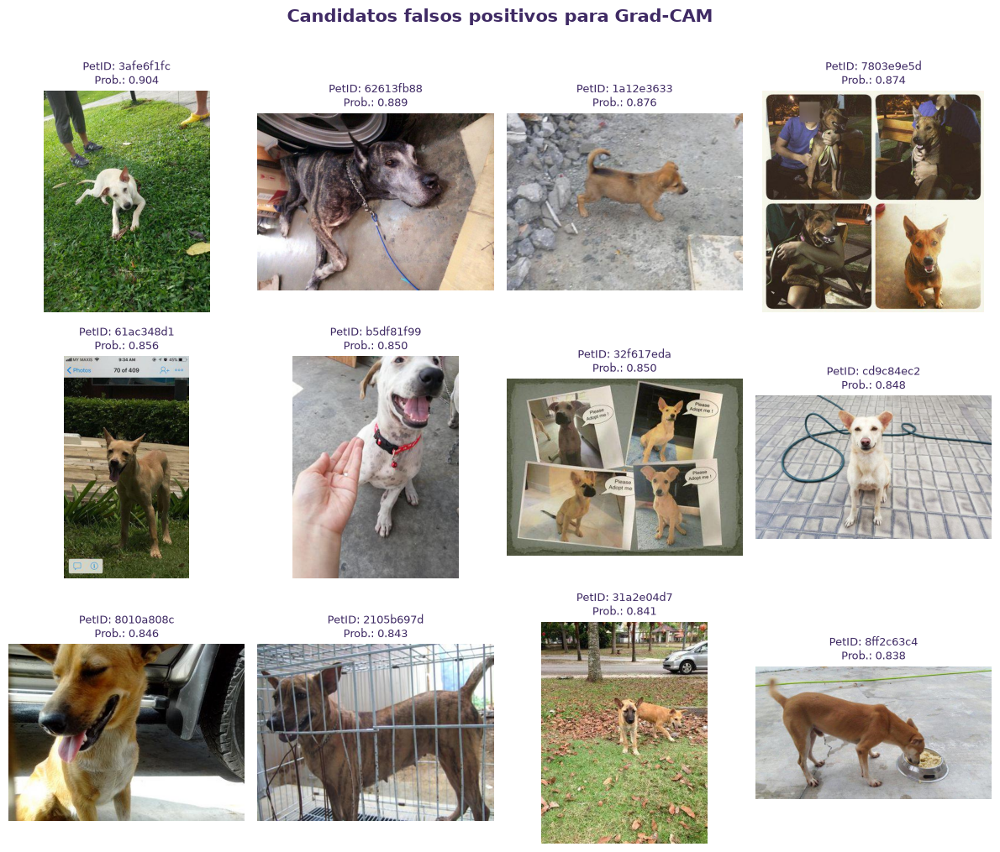

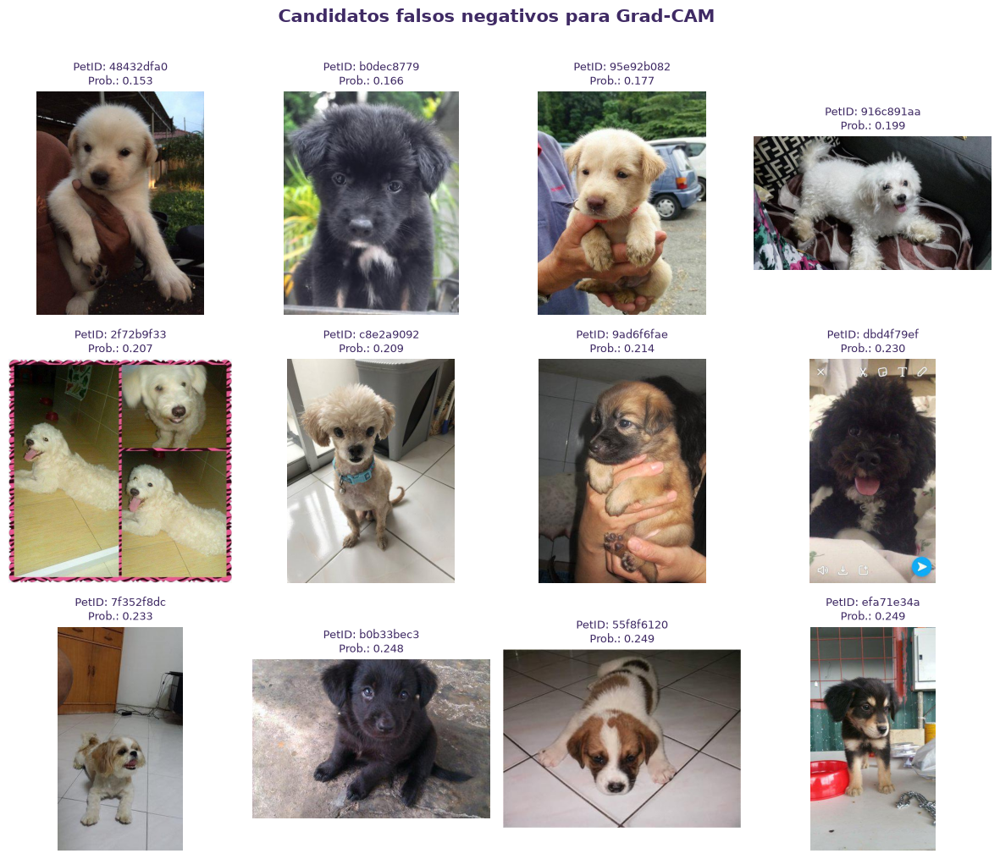

In [53]:
# Selección de candidatos para el análisis de errores con Grad-CAM

candidatos_fp = (
    predicciones_test_gradcam.loc[
        (predicciones_test_gradcam["y_true"] == 0)
        & (predicciones_test_gradcam["y_pred"] == 1)
    ]
    .sort_values(
        "y_score",
        ascending=False
    )
    .head(12)
    .reset_index(drop=True)
)

candidatos_fn = (
    predicciones_test_gradcam.loc[
        (predicciones_test_gradcam["y_true"] == 1)
        & (predicciones_test_gradcam["y_pred"] == 0)
    ]
    .sort_values(
        "y_score",
        ascending=True
    )
    .head(12)
    .reset_index(drop=True)
)


def mostrar_candidatos_gradcam(
    dataframe,
    titulo
):
    fig, axes = plt.subplots(
        3,
        4,
        figsize=(12, 10)
    )

    axes = axes.flatten()

    for ax, fila in zip(
        axes,
        dataframe.itertuples(index=False)
    ):
        with Image.open(
            fila.ruta_imagen_principal
        ) as imagen:
            imagen = imagen.convert("RGB")
            ax.imshow(imagen)

        ax.set_title(
            f"PetID: {fila.PetID}\n"
            f"Prob.: {fila.y_score:.3f}",
            fontsize=9,
            color="#3F2A64"
        )

        ax.axis("off")

    fig.suptitle(
        titulo,
        fontsize=15,
        fontweight="bold",
        color="#3F2A64",
        y=1.01
    )

    fig.tight_layout()

    plt.show()


mostrar_candidatos_gradcam(
    candidatos_fp,
    "Candidatos falsos positivos para Grad-CAM"
)

mostrar_candidatos_gradcam(
    candidatos_fn,
    "Candidatos falsos negativos para Grad-CAM"
)

### 11.3. Comparación de aciertos y errores del modelo

Para profundizar en la interpretación del modelo se comparan tres observaciones representativas del conjunto de test: un verdadero positivo, un falso positivo y un falso negativo.

Los casos se han seleccionado entre fotografías en las que aparece un único perro de forma clara, con el objetivo de facilitar la interpretación espacial de los mapas Grad-CAM. La selección se realiza únicamente con fines ilustrativos y no interviene en el entrenamiento, la selección del modelo ni el cálculo de las métricas.

Esta comparación permite observar si las regiones destacadas por la red se concentran sobre el propio animal tanto en las predicciones correctas como en los errores, y aporta contexto adicional sobre las limitaciones del modelo visual.

In [54]:
# Selección definitiva de casos para la comparación Grad-CAM

petids_gradcam_comparacion = {
    "Verdadero positivo": "c7d02bfca",
    "Falso positivo": "cd9c84ec2",
    "Falso negativo": "7f352f8dc"
}

casos_gradcam_comparacion = {}

for tipo_caso, petid in petids_gradcam_comparacion.items():

    coincidencia = predicciones_test_gradcam.loc[
        predicciones_test_gradcam["PetID"] == petid
    ]

    if coincidencia.empty:
        raise ValueError(
            f"No se ha encontrado el PetID {petid}."
        )

    casos_gradcam_comparacion[tipo_caso] = coincidencia.iloc[0]

resumen_gradcam_comparacion = pd.DataFrame([
    {
        "tipo_caso": tipo_caso,
        "PetID": caso["PetID"],
        "clase_real": (
            "Adopción lenta"
            if int(caso["y_true"]) == 1
            else "Adopción no lenta"
        ),
        "clase_predicha": (
            "Adopción lenta"
            if int(caso["y_pred"]) == 1
            else "Adopción no lenta"
        ),
        "probabilidad": float(caso["y_score"])
    }
    for tipo_caso, caso
    in casos_gradcam_comparacion.items()
])

display(
    resumen_gradcam_comparacion.round(4)
)

,tipo_caso,PetID,clase_real,clase_predicha,probabilidad
0,Verdadero positivo,c7d02bfca,Adopción lenta,Adopción lenta,0.9014
1,Falso positivo,cd9c84ec2,Adopción no lenta,Adopción lenta,0.8477
2,Falso negativo,7f352f8dc,Adopción lenta,Adopción no lenta,0.2327


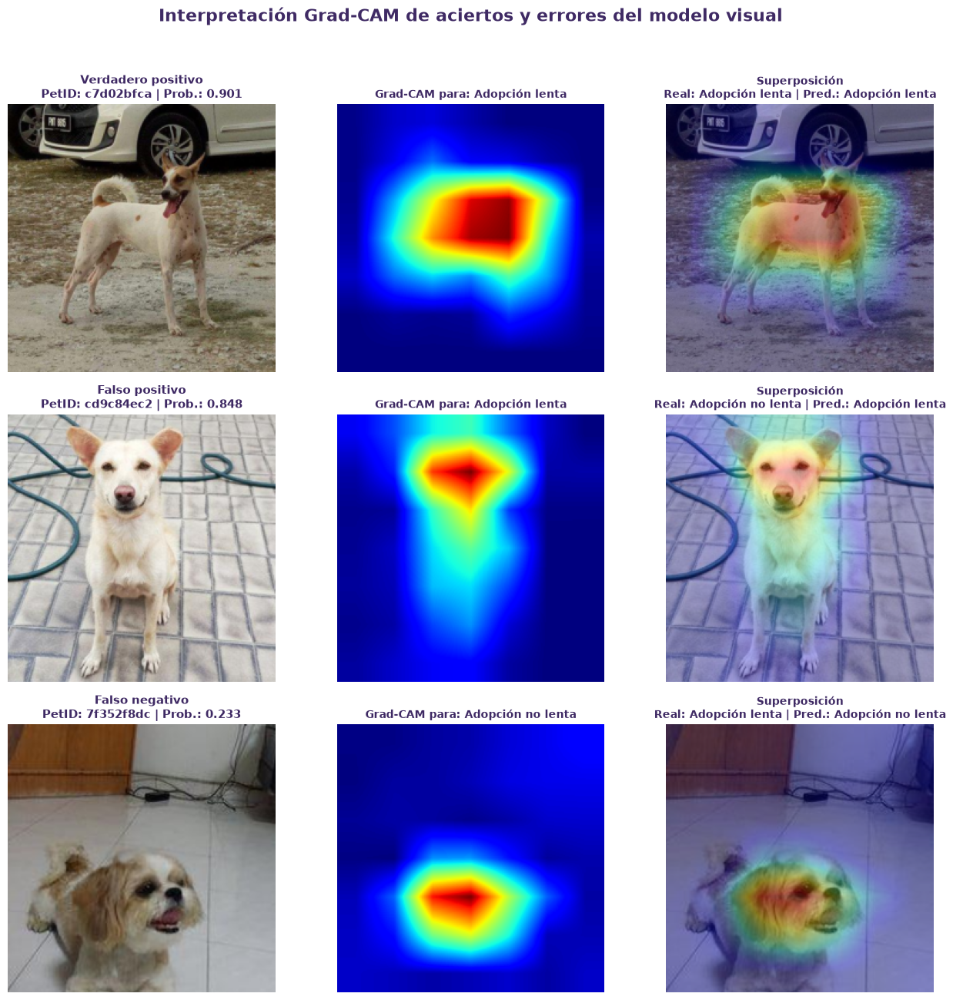

Figura guardada en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\figures\gradcam_comparacion_aciertos_errores.png


In [55]:
# Comparación Grad-CAM de aciertos y errores

def preparar_caso_gradcam(
    caso,
    modelo,
    capa_objetivo,
    device
):
    ruta_imagen = caso["ruta_imagen_principal"]

    with Image.open(ruta_imagen) as imagen:
        imagen = imagen.convert("RGB")
        imagen_display_pil = transform_display(imagen)

    imagen_display_np = (
        np.array(imagen_display_pil)
        .astype(np.float32)
        / 255.0
    )

    imagen_tensor = torch.from_numpy(
        imagen_display_np.transpose(2, 0, 1)
    ).float()

    imagen_tensor_norm = (
        (imagen_tensor - mean_imagenet)
        / std_imagenet
    ).unsqueeze(0)

    clase_predicha = int(
        caso["y_pred"]
    )

    mapa_gradcam, probabilidad = generar_gradcam(
        modelo=modelo,
        tensor_imagen=imagen_tensor_norm,
        capa_objetivo=capa_gradcam,
        device=device,
        clase_objetivo=clase_predicha
    )

    heatmap = cm.jet(
        mapa_gradcam
    )[..., :3]

    overlay = (
        0.70 * imagen_display_np
        + 0.30 * heatmap
    )

    overlay = np.clip(
        overlay,
        0,
        1
    )

    return (
        imagen_display_np,
        mapa_gradcam,
        overlay,
        probabilidad
    )


fig, axes = plt.subplots(
    3,
    3,
    figsize=(13, 13)
)

for fila, (tipo_caso, caso) in enumerate(
    casos_gradcam_comparacion.items()
):

    (
        imagen_np,
        mapa_gradcam,
        overlay,
        probabilidad
    ) = preparar_caso_gradcam(
        caso=caso,
        modelo=modelo_visual,
        capa_objetivo=capa_gradcam,
        device=device
    )

    clase_real = (
        "Adopción lenta"
        if int(caso["y_true"]) == 1
        else "Adopción no lenta"
    )

    clase_predicha = (
        "Adopción lenta"
        if int(caso["y_pred"]) == 1
        else "Adopción no lenta"
    )

    axes[fila, 0].imshow(
        imagen_np
    )

    axes[fila, 0].set_title(
        (
            f"{tipo_caso}\n"
            f"PetID: {caso['PetID']} | "
            f"Prob.: {probabilidad:.3f}"
        ),
        fontsize=11,
        fontweight="bold",
        color="#3F2A64"
    )

    axes[fila, 0].axis("off")

    axes[fila, 1].imshow(
        mapa_gradcam,
        cmap="jet"
    )

    axes[fila, 1].set_title(
        f"Grad-CAM para: {clase_predicha}",
        fontsize=10,
        fontweight="bold",
        color="#3F2A64"
    )

    axes[fila, 1].axis("off")

    axes[fila, 2].imshow(
        overlay
    )

    axes[fila, 2].set_title(
        (
            "Superposición\n"
            f"Real: {clase_real} | "
            f"Pred.: {clase_predicha}"
        ),
        fontsize=10,
        fontweight="bold",
        color="#3F2A64"
    )

    axes[fila, 2].axis("off")


fig.suptitle(
    "Interpretación Grad-CAM de aciertos y errores del modelo visual",
    fontsize=16,
    fontweight="bold",
    color="#3F2A64",
    y=0.995
)

fig.tight_layout(
    rect=[0, 0, 1, 0.97]
)

fig_path_gradcam_comparacion = (
    figures_path
    / "gradcam_comparacion_aciertos_errores.png"
)

fig.savefig(
    fig_path_gradcam_comparacion,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("Figura guardada en:")
print(fig_path_gradcam_comparacion)

### 11.4. Interpretación de los mapas Grad-CAM

Los mapas Grad-CAM muestran que el modelo visual concentra sus regiones de activación principalmente sobre el propio perro, aunque el patrón exacto varía según el tipo de predicción.

En el verdadero positivo, la activación principal se localiza sobre la zona central del cuerpo del animal, lo que indica que la predicción correcta de adopción lenta se apoya en información visual directamente asociada al perro.

En el falso positivo, la atención se concentra especialmente sobre la cabeza y la parte superior del cuerpo. Aunque la observación pertenece realmente a la clase de adopción no lenta, estas regiones generan una activación suficientemente intensa como para inducir una predicción errónea de adopción lenta.

En el falso negativo, el modelo predice adopción no lenta a pesar de tratarse de un caso real de adopción lenta. En este ejemplo, la activación vuelve a concentrarse sobre el perro, lo que sugiere que el error no se debe necesariamente a una falta de atención sobre el animal, sino a una representación visual que no resulta suficiente para identificar correctamente la clase positiva.

En conjunto, estos ejemplos indican que EfficientNet-B0 utiliza principalmente información visual localizada sobre el propio perro, aunque ello no impide la aparición de errores de clasificación. Los mapas Grad-CAM deben interpretarse como una aproximación a las regiones relevantes para cada predicción individual y no como evidencia causal.

## 12. Detección del perro y análisis del encuadre con MediaPipe

Una vez analizadas las regiones relevantes para las predicciones de EfficientNet-B0, se estudia de forma específica cómo aparece representado el perro dentro de la fotografía.

Para ello se utiliza MediaPipe como herramienta de detección de objetos, con el objetivo de localizar automáticamente al perro y obtener información cuantitativa sobre su presencia y encuadre. A partir de las detecciones se podrán analizar aspectos como el número de perros identificados, la confianza de detección, el tamaño relativo del animal dentro de la imagen y su posición respecto al centro de la fotografía.

Este análisis complementa el modelo visual anterior desde una perspectiva diferente. Mientras que Grad-CAM permite estudiar las regiones utilizadas internamente por la red para realizar una predicción, la detección de objetos permite caracterizar de forma explícita la visibilidad y composición de la fotografía.

In [56]:
# Comprobación de MediaPipe en el entorno actual

import importlib.util

mediapipe_disponible = (
    importlib.util.find_spec("mediapipe")
    is not None
)

if not mediapipe_disponible:
    raise ImportError(
        "MediaPipe no está instalado en el entorno. "
        "Instale las dependencias del proyecto antes de ejecutar el notebook."
    )

import mediapipe as mp
import cv2

print("MediaPipe disponible:")
print(True)

print("\nVersión de MediaPipe:")
print(mp.__version__)

print("\nVersión de OpenCV:")
print(cv2.__version__)


MediaPipe disponible:
True

Versión de MediaPipe:
1.0.0

Versión de OpenCV:
5.0.0


In [57]:
# Preparación del modelo de detección utilizado por MediaPipe

from urllib.request import urlretrieve

mediapipe_models_path = (
    models_path
    / "mediapipe"
)

mediapipe_models_path.mkdir(
    parents=True,
    exist_ok=True
)

mediapipe_detector_path = (
    mediapipe_models_path
    / "efficientdet_lite0.tflite"
)

mediapipe_model_url = (
    "https://storage.googleapis.com/mediapipe-models/"
    "object_detector/efficientdet_lite0/float32/latest/"
    "efficientdet_lite0.tflite"
)

if not mediapipe_detector_path.exists():

    print("Descargando modelo de detección...")

    urlretrieve(
        mediapipe_model_url,
        mediapipe_detector_path
    )

    print("Descarga completada.")

print("\nModelo de detección:")
print(mediapipe_detector_path)

print("\n¿Existe el modelo?:")
print(mediapipe_detector_path.exists())

print("\nTamaño del archivo:")
print(
    f"{mediapipe_detector_path.stat().st_size / 1024**2:.2f} MB"
)


Modelo de detección:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\models\mediapipe\efficientdet_lite0.tflite

¿Existe el modelo?:
True

Tamaño del archivo:
13.20 MB


### 12.1. Configuración del detector de perros

Se configura el detector de objetos para trabajar exclusivamente con fotografías individuales y limitar los resultados a la categoría `dog`.

Se establece inicialmente un umbral mínimo de confianza moderado, con el objetivo de recuperar detecciones suficientemente fiables sin excluir de forma prematura fotografías más complejas. Posteriormente se analizará la cobertura obtenida sobre el conjunto completo de imágenes.

In [58]:
# Configuración del detector de perros con MediaPipe

BaseOptions = mp.tasks.BaseOptions
ObjectDetector = mp.tasks.vision.ObjectDetector
ObjectDetectorOptions = mp.tasks.vision.ObjectDetectorOptions
VisionRunningMode = mp.tasks.vision.RunningMode

SCORE_THRESHOLD_MEDIAPIPE = 0.30

detector_options = ObjectDetectorOptions(
    base_options=BaseOptions(
        model_asset_path=str(
            mediapipe_detector_path
        )
    ),
    running_mode=VisionRunningMode.IMAGE,
    max_results=5,
    score_threshold=SCORE_THRESHOLD_MEDIAPIPE,
    category_allowlist=[
        "dog"
    ]
)

detector_perros = (
    ObjectDetector.create_from_options(
        detector_options
    )
)

print("Detector de perros creado correctamente.")

print("\nUmbral mínimo de confianza:")
print(SCORE_THRESHOLD_MEDIAPIPE)

print("\nCategoría analizada:")
print("dog")

Detector de perros creado correctamente.

Umbral mínimo de confianza:
0.3

Categoría analizada:
dog


### 12.2. Comprobación de la detección sobre una fotografía

Antes de aplicar el detector al conjunto completo de imágenes, se realiza una comprobación sobre una fotografía individual en la que el perro aparece claramente visible.

El detector devuelve la posición del animal mediante un *bounding box* y una puntuación de confianza asociada a la detección. Esta primera inspección permite verificar que la localización del perro es adecuada antes de extraer automáticamente variables de encuadre sobre todo el dataset.

PetID analizado:
c7d02bfca

Número de perros detectados:
1

Detección 1:
Categoría: dog
Confianza: 0.8603
Bounding box: x=130, y=116, ancho=242, alto=279


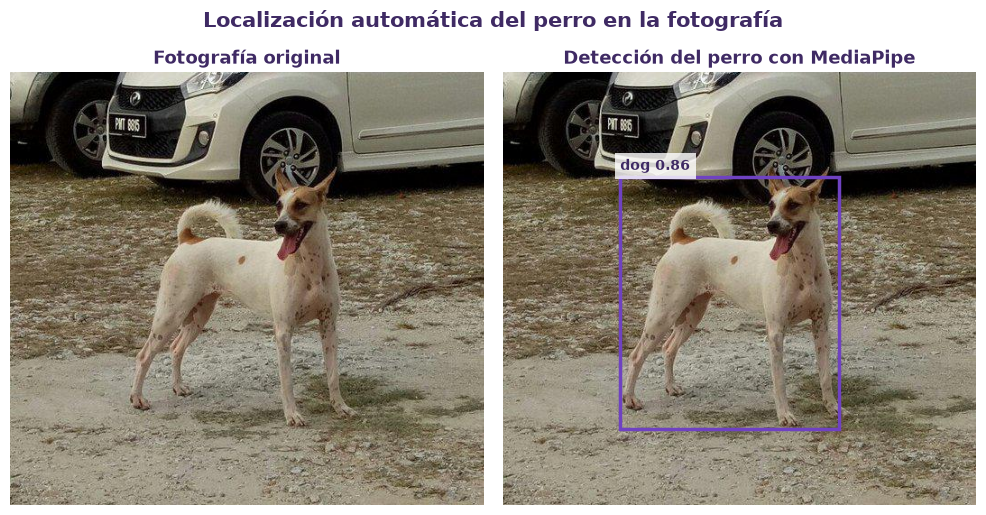


Figura guardada en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\figures\mediapipe_deteccion_ejemplo.png


In [59]:
# Comprobación del detector sobre una fotografía

petid_mediapipe_ejemplo = "c7d02bfca"

ejemplo_mediapipe = (
    predicciones_test_gradcam.loc[
        predicciones_test_gradcam["PetID"]
        == petid_mediapipe_ejemplo
    ]
)

if ejemplo_mediapipe.empty:
    raise ValueError(
        f"No se ha encontrado el PetID {petid_mediapipe_ejemplo}."
    )

ejemplo_mediapipe = ejemplo_mediapipe.iloc[0]

ruta_imagen_mediapipe = (
    ejemplo_mediapipe[
        "ruta_imagen_principal"
    ]
)

with Image.open(
    ruta_imagen_mediapipe
) as imagen:
    imagen_rgb = imagen.convert("RGB")
    imagen_rgb_np = np.array(
        imagen_rgb,
        dtype=np.uint8
    )

imagen_rgb_np = np.ascontiguousarray(
    imagen_rgb_np
)

imagen_mp = mp.Image(
    image_format=mp.ImageFormat.SRGB,
    data=imagen_rgb_np
)

resultado_deteccion = detector_perros.detect(
    imagen_mp
)

print("PetID analizado:")
print(petid_mediapipe_ejemplo)

print("\nNúmero de perros detectados:")
print(len(resultado_deteccion.detections))

for i, deteccion in enumerate(
    resultado_deteccion.detections,
    start=1
):
    categoria = deteccion.categories[0]
    bbox = deteccion.bounding_box

    print(f"\nDetección {i}:")
    print(
        f"Categoría: "
        f"{categoria.category_name}"
    )
    print(
        f"Confianza: "
        f"{categoria.score:.4f}"
    )
    print(
        f"Bounding box: "
        f"x={bbox.origin_x}, "
        f"y={bbox.origin_y}, "
        f"ancho={bbox.width}, "
        f"alto={bbox.height}"
    )


fig, axes = plt.subplots(
    1,
    2,
    figsize=(10, 5)
)

axes[0].imshow(
    imagen_rgb_np
)

axes[0].set_title(
    "Fotografía original",
    fontsize=13,
    fontweight="bold",
    color="#3F2A64"
)

axes[0].axis("off")


axes[1].imshow(
    imagen_rgb_np
)

for deteccion in resultado_deteccion.detections:

    bbox = deteccion.bounding_box
    categoria = deteccion.categories[0]

    rectangulo = plt.Rectangle(
        (
            bbox.origin_x,
            bbox.origin_y
        ),
        bbox.width,
        bbox.height,
        fill=False,
        linewidth=2.5,
        edgecolor="#6F42C1"
    )

    axes[1].add_patch(
        rectangulo
    )

    axes[1].text(
        bbox.origin_x,
        max(
            bbox.origin_y - 8,
            5
        ),
        (
            f"dog "
            f"{categoria.score:.2f}"
        ),
        fontsize=10,
        fontweight="bold",
        color="#3F2A64",
        bbox={
            "facecolor": "white",
            "alpha": 0.8,
            "edgecolor": "none"
        }
    )

axes[1].set_title(
    "Detección del perro con MediaPipe",
    fontsize=13,
    fontweight="bold",
    color="#3F2A64"
)

axes[1].axis("off")


fig.suptitle(
    "Localización automática del perro en la fotografía",
    fontsize=15,
    fontweight="bold",
    color="#3F2A64",
    y=1.02
)

fig.tight_layout()

fig_path_mediapipe_ejemplo = (
    figures_path
    / "mediapipe_deteccion_ejemplo.png"
)

fig.savefig(
    fig_path_mediapipe_ejemplo,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("\nFigura guardada en:")
print(fig_path_mediapipe_ejemplo)

### 12.3. Extracción de variables de encuadre sobre una fotografía

A partir de la detección obtenida, se calculan varias variables descriptivas de encuadre que posteriormente podrán extraerse de forma masiva sobre el conjunto completo de imágenes.

Entre ellas se incluyen el tamaño relativo del perro dentro de la fotografía, la posición del centro del *bounding box*, la distancia respecto al centro de la imagen y una variable indicadora de si el perro aparece razonablemente centrado. Estas medidas permiten cuantificar de forma explícita la visibilidad del animal en la fotografía.

In [60]:
# Cálculo de variables de encuadre sobre la fotografía de ejemplo

if len(resultado_deteccion.detections) == 0:
    raise ValueError(
        "No se ha detectado ningún perro en la imagen de ejemplo."
    )

deteccion_principal = max(
    resultado_deteccion.detections,
    key=lambda d: d.categories[0].score
)

categoria_principal = (
    deteccion_principal.categories[0]
)

bbox = deteccion_principal.bounding_box

alto_imagen, ancho_imagen = (
    imagen_rgb_np.shape[0],
    imagen_rgb_np.shape[1]
)

area_imagen = ancho_imagen * alto_imagen
area_bbox = bbox.width * bbox.height

pct_imagen_ocupada_perro = (
    area_bbox / area_imagen
)

centro_bbox_x = (
    bbox.origin_x + bbox.width / 2
)
centro_bbox_y = (
    bbox.origin_y + bbox.height / 2
)

centro_imagen_x = ancho_imagen / 2
centro_imagen_y = alto_imagen / 2

distancia_centro_px = np.sqrt(
    (centro_bbox_x - centro_imagen_x) ** 2
    + (centro_bbox_y - centro_imagen_y) ** 2
)

distancia_centro_norm = (
    distancia_centro_px
    / np.sqrt(
        centro_imagen_x ** 2
        + centro_imagen_y ** 2
    )
)

bbox_aspect_ratio = (
    bbox.width / bbox.height
)

perro_centrado = (
    distancia_centro_norm <= 0.20
)

resumen_encuadre_ejemplo = pd.DataFrame([
    {
        "PetID": petid_mediapipe_ejemplo,
        "n_detecciones": len(
            resultado_deteccion.detections
        ),
        "confianza_principal": categoria_principal.score,
        "image_width": ancho_imagen,
        "image_height": alto_imagen,
        "bbox_x": bbox.origin_x,
        "bbox_y": bbox.origin_y,
        "bbox_width": bbox.width,
        "bbox_height": bbox.height,
        "bbox_area": area_bbox,
        "bbox_aspect_ratio": bbox_aspect_ratio,
        "pct_imagen_ocupada_perro": pct_imagen_ocupada_perro,
        "centro_bbox_x": centro_bbox_x,
        "centro_bbox_y": centro_bbox_y,
        "distancia_centro_px": distancia_centro_px,
        "distancia_centro_norm": distancia_centro_norm,
        "perro_centrado": perro_centrado
    }
])

print("Resumen de encuadre de la fotografía:")
display(
    resumen_encuadre_ejemplo.round(4)
)

Resumen de encuadre de la fotografía:


,PetID,n_detecciones,confianza_principal,image_width,image_height,bbox_x,bbox_y,bbox_width,bbox_height,bbox_area,bbox_aspect_ratio,pct_imagen_ocupada_perro,centro_bbox_x,centro_bbox_y,distancia_centro_px,distancia_centro_norm,perro_centrado
0,c7d02bfca,1,0.8603,525,480,130,116,242,279,67518,0.8674,0.2679,251.0,255.5,19.3003,0.0543,True


### 12.4. Representación visual del encuadre

Las variables calculadas permiten cuantificar la posición del perro dentro de la fotografía. Para facilitar su interpretación, se representa conjuntamente el *bounding box* detectado, el centro geométrico de la imagen y el centro del perro.

La distancia entre ambos puntos constituye la base de la medida de centralidad utilizada posteriormente. Cuanto menor sea esta distancia relativa, más centrado aparece el perro dentro de la fotografía.

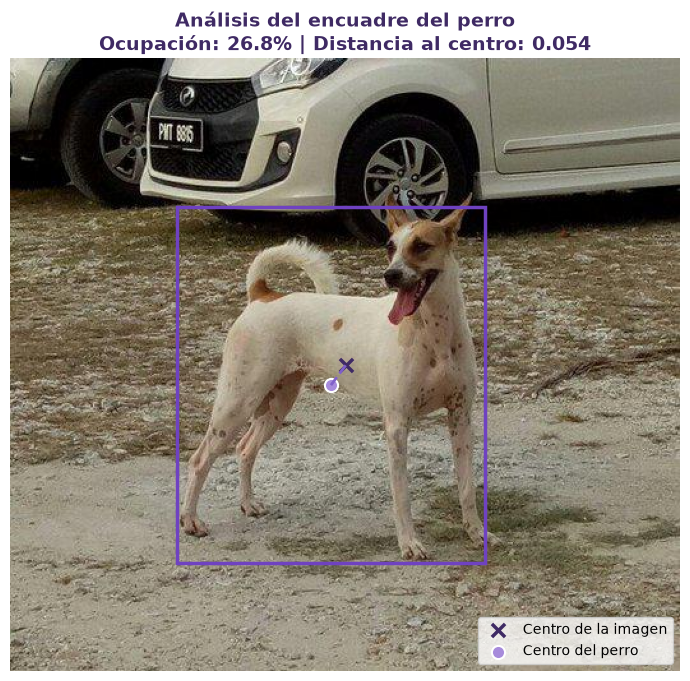

Figura guardada en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\figures\mediapipe_encuadre_ejemplo.png


In [61]:
# Representación visual de la posición del perro

fig, ax = plt.subplots(
    figsize=(7, 7)
)

ax.imshow(
    imagen_rgb_np
)

# Bounding box del perro
rectangulo = plt.Rectangle(
    (
        bbox.origin_x,
        bbox.origin_y
    ),
    bbox.width,
    bbox.height,
    fill=False,
    linewidth=2.5,
    edgecolor="#6F42C1"
)

ax.add_patch(
    rectangulo
)

# Centro de la imagen
ax.scatter(
    centro_imagen_x,
    centro_imagen_y,
    s=90,
    marker="x",
    linewidths=2.5,
    color="#3F2A64",
    label="Centro de la imagen"
)

# Centro del perro
ax.scatter(
    centro_bbox_x,
    centro_bbox_y,
    s=90,
    marker="o",
    color="#A78BDB",
    edgecolor="white",
    linewidth=1.5,
    label="Centro del perro"
)

# Línea entre ambos centros
ax.plot(
    [
        centro_imagen_x,
        centro_bbox_x
    ],
    [
        centro_imagen_y,
        centro_bbox_y
    ],
    linestyle="--",
    linewidth=2,
    color="#8060C9"
)

ax.set_title(
    (
        "Análisis del encuadre del perro\n"
        f"Ocupación: {pct_imagen_ocupada_perro * 100:.1f}% | "
        f"Distancia al centro: {distancia_centro_norm:.3f}"
    ),
    fontsize=14,
    fontweight="bold",
    color="#3F2A64"
)

ax.legend(
    loc="lower right"
)

ax.axis("off")

fig.tight_layout()

fig_path_encuadre_ejemplo = (
    figures_path
    / "mediapipe_encuadre_ejemplo.png"
)

fig.savefig(
    fig_path_encuadre_ejemplo,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("Figura guardada en:")
print(fig_path_encuadre_ejemplo)

### 12.5. Extracción automática de características de encuadre

Una vez comprobado el funcionamiento del detector sobre una fotografía individual, se aplica el mismo procedimiento al conjunto visual completo de PetFinder.

Para cada perro se registra si ha podido ser detectado, el número de detecciones encontradas y la confianza asociada a la detección principal. Cuando se identifica al menos un perro, se extraen además diferentes características relacionadas con su encuadre, como el tamaño relativo dentro de la fotografía, la relación de aspecto del *bounding box*, la posición de su centro y la distancia respecto al centro de la imagen.

En las fotografías con varias detecciones se utiliza como referencia principal aquella con mayor puntuación de confianza, aunque se conserva también el número total de perros detectados. La extracción se realiza sin utilizar la variable objetivo, por lo que las características visuales se obtienen de la misma forma para entrenamiento, validación y test.

Para mejorar la reproducibilidad y evitar recálculos innecesarios, si el archivo de características ya existe se reutiliza automáticamente. El recálculo completo puede forzarse desde la celda de configuración inicial.


In [62]:
# Función para extraer características de detección y encuadre

def extraer_caracteristicas_mediapipe(
    petid,
    ruta_imagen,
    detector,
    umbral_centrado=0.20
):
    resultado = {
        "PetID": petid,
        "perro_detectado": False,
        "n_perros_detectados": 0,
        "confianza_deteccion": np.nan,
        "bbox_x": np.nan,
        "bbox_y": np.nan,
        "bbox_width": np.nan,
        "bbox_height": np.nan,
        "bbox_area": np.nan,
        "bbox_aspect_ratio": np.nan,
        "pct_imagen_ocupada_perro": np.nan,
        "centro_perro_x_norm": np.nan,
        "centro_perro_y_norm": np.nan,
        "distancia_centro_norm": np.nan,
        "perro_centrado": np.nan
    }

    try:
        with Image.open(ruta_imagen) as imagen:
            imagen = imagen.convert("RGB")
            imagen_np = np.array(
                imagen,
                dtype=np.uint8
            )

        imagen_np = np.ascontiguousarray(
            imagen_np
        )

        alto_imagen, ancho_imagen = (
            imagen_np.shape[:2]
        )

        imagen_mp = mp.Image(
            image_format=mp.ImageFormat.SRGB,
            data=imagen_np
        )

        deteccion = detector.detect(
            imagen_mp
        )

        n_detecciones = len(
            deteccion.detections
        )

        resultado["n_perros_detectados"] = (
            n_detecciones
        )

        if n_detecciones == 0:
            return resultado

        deteccion_principal = max(
            deteccion.detections,
            key=lambda d: d.categories[0].score
        )

        categoria = (
            deteccion_principal.categories[0]
        )

        bbox = (
            deteccion_principal.bounding_box
        )

        area_imagen = (
            ancho_imagen * alto_imagen
        )

        area_bbox = (
            bbox.width * bbox.height
        )

        centro_bbox_x = (
            bbox.origin_x
            + bbox.width / 2
        )

        centro_bbox_y = (
            bbox.origin_y
            + bbox.height / 2
        )

        centro_imagen_x = (
            ancho_imagen / 2
        )

        centro_imagen_y = (
            alto_imagen / 2
        )

        distancia_centro_px = np.sqrt(
            (
                centro_bbox_x
                - centro_imagen_x
            ) ** 2
            +
            (
                centro_bbox_y
                - centro_imagen_y
            ) ** 2
        )

        distancia_maxima = np.sqrt(
            centro_imagen_x ** 2
            + centro_imagen_y ** 2
        )

        distancia_centro_norm = (
            distancia_centro_px
            / distancia_maxima
        )

        resultado.update({
            "perro_detectado": True,
            "confianza_deteccion": float(
                categoria.score
            ),
            "bbox_x": int(
                bbox.origin_x
            ),
            "bbox_y": int(
                bbox.origin_y
            ),
            "bbox_width": int(
                bbox.width
            ),
            "bbox_height": int(
                bbox.height
            ),
            "bbox_area": int(
                area_bbox
            ),
            "bbox_aspect_ratio": (
                bbox.width
                / bbox.height
                if bbox.height > 0
                else np.nan
            ),
            "pct_imagen_ocupada_perro": (
                area_bbox
                / area_imagen
            ),
            "centro_perro_x_norm": (
                centro_bbox_x
                / ancho_imagen
            ),
            "centro_perro_y_norm": (
                centro_bbox_y
                / alto_imagen
            ),
            "distancia_centro_norm": (
                distancia_centro_norm
            ),
            "perro_centrado": (
                distancia_centro_norm
                <= umbral_centrado
            )
        })

        return resultado

    except Exception:
        return resultado


print(
    "Función de extracción de características preparada."
)

Función de extracción de características preparada.


In [63]:
# Extracción o carga de características de encuadre con MediaPipe

import time

mediapipe_features_path = (
    visual_outputs_path
    / "petfinder_mediapipe_encuadre.csv"
)

usar_cache_mediapipe = (
    mediapipe_features_path.exists()
    and not RECALCULAR_ARTEFACTOS
)

if usar_cache_mediapipe:

    caracteristicas_mediapipe_df = pd.read_csv(
        mediapipe_features_path,
        encoding="utf-8-sig",
        dtype={"PetID": str}
    )

    tiempo_mediapipe = np.nan

    print(
        "Resultados de MediaPipe cargados desde el archivo existente."
    )

else:

    inicio_mediapipe = time.perf_counter()
    resultados_mediapipe = []
    n_total_mediapipe = len(
        petfinder_visual_model_df
    )

    for i, fila in enumerate(
        petfinder_visual_model_df[
            [
                "PetID",
                "ruta_imagen_principal"
            ]
        ].itertuples(index=False),
        start=1
    ):

        resultado = extraer_caracteristicas_mediapipe(
            petid=fila.PetID,
            ruta_imagen=fila.ruta_imagen_principal,
            detector=detector_perros
        )

        resultados_mediapipe.append(
            resultado
        )

        if (
            i % 500 == 0
            or i == n_total_mediapipe
        ):
            print(
                f"Imágenes procesadas: "
                f"{i}/{n_total_mediapipe}"
            )

    caracteristicas_mediapipe_df = pd.DataFrame(
        resultados_mediapipe
    )

    tiempo_mediapipe = (
        time.perf_counter()
        - inicio_mediapipe
    )

    caracteristicas_mediapipe_df.to_csv(
        mediapipe_features_path,
        index=False,
        encoding="utf-8-sig"
    )

n_petid_duplicados_mediapipe = (
    caracteristicas_mediapipe_df[
        "PetID"
    ]
    .duplicated()
    .sum()
)

if n_petid_duplicados_mediapipe > 0:
    raise ValueError(
        "Se han encontrado PetID duplicados "
        "en los resultados de MediaPipe."
    )

n_perros_detectados_mediapipe = int(
    caracteristicas_mediapipe_df[
        "perro_detectado"
    ].sum()
)

n_sin_deteccion_mediapipe = (
    len(caracteristicas_mediapipe_df)
    - n_perros_detectados_mediapipe
)

pct_deteccion_mediapipe = (
    n_perros_detectados_mediapipe
    / len(caracteristicas_mediapipe_df)
    * 100
)

print("\nFotografías analizadas:")
print(
    len(caracteristicas_mediapipe_df)
)

print("\nPerro detectado:")
print(
    n_perros_detectados_mediapipe
)

print("\nSin detección de perro:")
print(
    n_sin_deteccion_mediapipe
)

print("\nCobertura de detección:")
print(
    f"{pct_deteccion_mediapipe:.2f}%"
)

print("\nPetID duplicados:")
print(
    n_petid_duplicados_mediapipe
)

if not np.isnan(tiempo_mediapipe):
    print("\nTiempo total:")
    print(
        f"{tiempo_mediapipe / 60:.2f} minutos"
    )

print("\nResultados disponibles en:")
print(
    mediapipe_features_path
)

print("\nPrimeras filas:")
display(
    caracteristicas_mediapipe_df
    .head()
    .round(4)
)


Resultados de MediaPipe cargados desde el archivo existente.

Fotografías analizadas:
7938

Perro detectado:
7460

Sin detección de perro:
478

Cobertura de detección:
93.98%

PetID duplicados:
0

Resultados disponibles en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\petfinder_visual\petfinder_mediapipe_encuadre.csv

Primeras filas:


,PetID,perro_detectado,n_perros_detectados,confianza_deteccion,bbox_x,bbox_y,bbox_width,bbox_height,bbox_area,bbox_aspect_ratio,pct_imagen_ocupada_perro,centro_perro_x_norm,centro_perro_y_norm,distancia_centro_norm,perro_centrado
0,3422e4906,True,1,0.8404,15.0,1.0,264.0,384.0,101376.0,0.6875,0.8448,0.4900,0.4825,0.0305,True
1,5842f1ff5,True,1,0.7365,2.0,2.0,392.0,290.0,113680.0,1.3517,0.9473,0.4950,0.4900,0.0144,True
2,850a43f90,True,1,0.6659,108.0,113.0,298.0,281.0,83738.0,1.0605,0.3064,0.4016,0.5937,0.1940,True
3,97aa9eeac,False,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,8b693ca84,True,1,0.5536,5.0,112.0,244.0,350.0,85400.0,0.6971,0.6739,0.4811,0.5979,0.1726,True


In [64]:
# Resumen de cobertura de MediaPipe

print("Fotografías analizadas:")
print(len(caracteristicas_mediapipe_df))

print("\nPerro detectado:")
print(
    caracteristicas_mediapipe_df[
        "perro_detectado"
    ].sum()
)

print("\nSin detección de perro:")
print(
    (
        ~caracteristicas_mediapipe_df[
            "perro_detectado"
        ]
    ).sum()
)

print("\nCobertura de detección:")
print(
    f"{caracteristicas_mediapipe_df['perro_detectado'].mean() * 100:.2f}%"
)

print("\nFotografías con más de un perro detectado:")
print(
    (
        caracteristicas_mediapipe_df[
            "n_perros_detectados"
        ] > 1
    ).sum()
)

Fotografías analizadas:
7938

Perro detectado:
7460

Sin detección de perro:
478

Cobertura de detección:
93.98%

Fotografías con más de un perro detectado:
1131


### 12.6. Análisis de las características de detección y encuadre

Una vez completada la extracción, se analiza la relación entre las características de encuadre y la variable objetivo de adopción lenta.

Para evitar utilizar el conjunto de test en decisiones derivadas de este análisis, las comparaciones exploratorias se realizan inicialmente sobre los conjuntos de entrenamiento y validación. Se estudian tanto la capacidad del detector para localizar al perro como diferentes aspectos de su representación en la fotografía, entre ellos el número de animales detectados, la confianza de detección, el tamaño relativo del perro y su distancia respecto al centro de la imagen.

Estas variables permiten aproximar de forma cuantitativa algunos componentes de la visibilidad y composición de las fotografías.

In [65]:
# Incorporación de las características de MediaPipe al dataset visual

petfinder_visual_mediapipe_df = (
    petfinder_visual_model_df
    .merge(
        caracteristicas_mediapipe_df,
        on="PetID",
        how="left",
        validate="one_to_one"
    )
)

# Conjunto de desarrollo: train + valid
mediapipe_dev_df = (
    petfinder_visual_mediapipe_df.loc[
        petfinder_visual_mediapipe_df[
            "conjunto_petfinder"
        ].isin(
            ["train", "valid"]
        )
    ]
    .copy()
)

print("Dimensiones del dataset enriquecido:")
print(
    petfinder_visual_mediapipe_df.shape
)

print("\nPerros incluidos en desarrollo:")
print(
    len(mediapipe_dev_df)
)

print("\nCobertura de detección en desarrollo:")

cobertura_clase_mediapipe = (
    mediapipe_dev_df
    .groupby(
        "target_adopcion_lenta"
    )
    .agg(
        n_perros=(
            "PetID",
            "size"
        ),
        perros_detectados=(
            "perro_detectado",
            "sum"
        )
    )
)

cobertura_clase_mediapipe[
    "porcentaje_detectado"
] = (
    cobertura_clase_mediapipe[
        "perros_detectados"
    ]
    / cobertura_clase_mediapipe[
        "n_perros"
    ]
    * 100
)

display(
    cobertura_clase_mediapipe.round(2)
)


print("\nFotografías con varios perros:")

varios_perros_clase = (
    mediapipe_dev_df
    .assign(
        varios_perros=lambda df: (
            df["n_perros_detectados"] > 1
        )
    )
    .groupby(
        "target_adopcion_lenta"
    )
    .agg(
        n_perros=(
            "PetID",
            "size"
        ),
        fotos_varios_perros=(
            "varios_perros",
            "sum"
        )
    )
)

varios_perros_clase[
    "porcentaje_varios_perros"
] = (
    varios_perros_clase[
        "fotos_varios_perros"
    ]
    / varios_perros_clase[
        "n_perros"
    ]
    * 100
)

display(
    varios_perros_clase.round(2)
)


print("\nResumen de características de encuadre:")

variables_encuadre = [
    "confianza_deteccion",
    "pct_imagen_ocupada_perro",
    "distancia_centro_norm"
]

resumen_encuadre_clase = (
    mediapipe_dev_df.loc[
        mediapipe_dev_df[
            "perro_detectado"
        ],
        [
            "target_adopcion_lenta",
            *variables_encuadre
        ]
    ]
    .groupby(
        "target_adopcion_lenta"
    )[
        variables_encuadre
    ]
    .agg(
        ["mean", "median"]
    )
)

display(
    resumen_encuadre_clase.round(4)
)

Dimensiones del dataset enriquecido:
(7938, 24)

Perros incluidos en desarrollo:
6346

Cobertura de detección en desarrollo:


,n_perros,perros_detectados,porcentaje_detectado
target_adopcion_lenta,,,
0,2964,2795,94.30
1,3382,3175,93.88



Fotografías con varios perros:


,n_perros,fotos_varios_perros,porcentaje_varios_perros
target_adopcion_lenta,,,
0,2964,363,12.25
1,3382,524,15.49



Resumen de características de encuadre:


confianza_deteccion         pct_imagen_ocupada_perro         distancia_centro_norm        
                                     mean  median                     mean  median                  mean  median
target_adopcion_lenta                                                                                           
0                                  0.7057  0.7281                   0.5252  0.5194                0.1350  0.1038
1                                  0.7109  0.7347                   0.5030  0.4919                0.1463  0.1091

### 12.7. Comparación de las características de encuadre según la adopción

Las características extraídas mediante MediaPipe muestran algunas diferencias descriptivas entre los perros con adopción lenta y no lenta.

Aunque la cobertura y la confianza de detección son muy similares entre ambos grupos, las fotografías asociadas a adopción lenta presentan con mayor frecuencia varios perros y muestran, en promedio, una menor proporción de imagen ocupada por el perro principal y una distancia ligeramente superior respecto al centro de la fotografía.

Para visualizar estos patrones se comparan las principales características de encuadre entre ambas clases. Estas diferencias se interpretan inicialmente de forma exploratoria y posteriormente se evalúa su magnitud mediante pruebas estadísticas y tamaños de efecto.

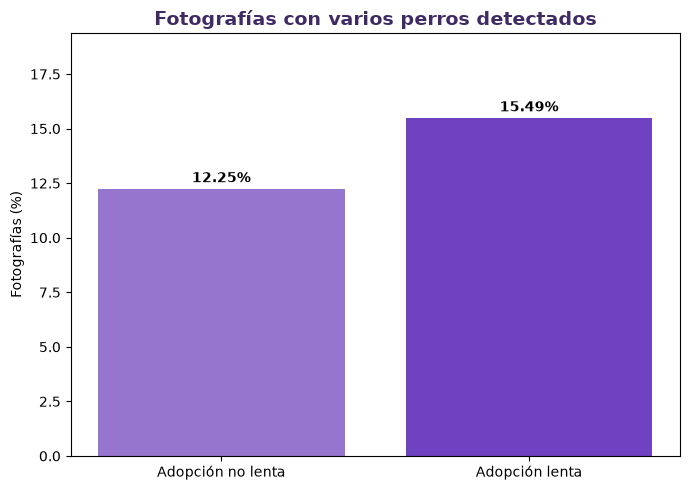

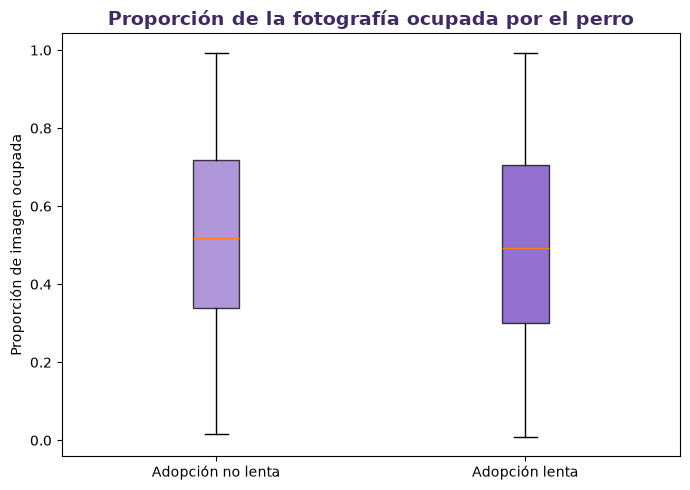

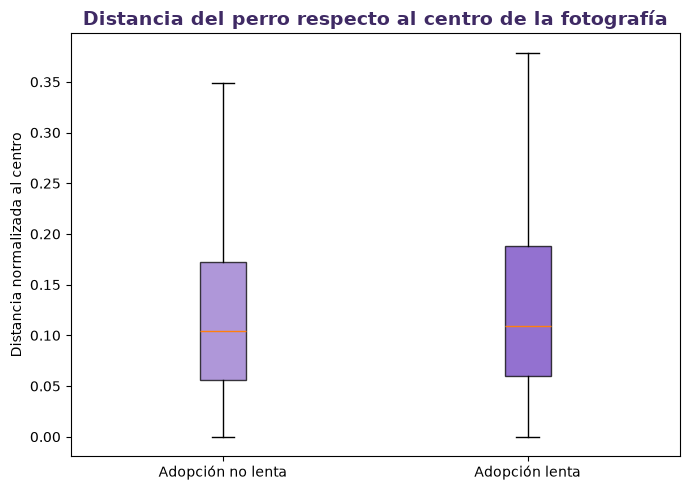

In [66]:
# Comparación visual de las características de encuadre

etiquetas_clase = {
    0: "Adopción no lenta",
    1: "Adopción lenta"
}

color_no_lenta = "#9575CD"
color_lenta = "#6F42C1"


# 1. Fotografías con varios perros detectados

porcentaje_varios = (
    mediapipe_dev_df
    .assign(
        varios_perros=(
            mediapipe_dev_df[
                "n_perros_detectados"
            ] > 1
        )
    )
    .groupby(
        "target_adopcion_lenta"
    )["varios_perros"]
    .mean()
    .mul(100)
)

fig, ax = plt.subplots(
    figsize=(7, 5)
)

ax.bar(
    [
        etiquetas_clase[i]
        for i in porcentaje_varios.index
    ],
    porcentaje_varios.values,
    color=[
        color_no_lenta,
        color_lenta
    ]
)

ax.set_title(
    "Fotografías con varios perros detectados",
    fontsize=14,
    fontweight="bold",
    color="#3F2A64"
)

ax.set_ylabel(
    "Fotografías (%)"
)

ax.set_ylim(
    0,
    max(porcentaje_varios.values) * 1.25
)

for i, valor in enumerate(
    porcentaje_varios.values
):
    ax.text(
        i,
        valor + 0.3,
        f"{valor:.2f}%",
        ha="center",
        fontweight="bold"
    )

fig.tight_layout()

fig.savefig(
    figures_path
    / "mediapipe_varios_perros_adopcion.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()


# Dataset con detecciones válidas

datos_detectados = (
    mediapipe_dev_df.loc[
        mediapipe_dev_df[
            "perro_detectado"
        ]
    ]
    .copy()
)


# 2. Porcentaje de fotografía ocupado por el perro

datos_ocupacion = [
    datos_detectados.loc[
        datos_detectados[
            "target_adopcion_lenta"
        ] == clase,
        "pct_imagen_ocupada_perro"
    ].dropna()
    for clase in [0, 1]
]

fig, ax = plt.subplots(
    figsize=(7, 5)
)

box = ax.boxplot(
    datos_ocupacion,
    patch_artist=True,
    showfliers=False
)

for parche, color in zip(
    box["boxes"],
    [
        color_no_lenta,
        color_lenta
    ]
):
    parche.set_facecolor(
        color
    )

    parche.set_alpha(
        0.75
    )

ax.set_xticks(
    [1, 2]
)

ax.set_xticklabels(
    [
        "Adopción no lenta",
        "Adopción lenta"
    ]
)

ax.set_title(
    "Proporción de la fotografía ocupada por el perro",
    fontsize=14,
    fontweight="bold",
    color="#3F2A64"
)

ax.set_ylabel(
    "Proporción de imagen ocupada"
)

fig.tight_layout()

fig.savefig(
    figures_path
    / "mediapipe_ocupacion_perro_adopcion.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()


# 3. Distancia del perro respecto al centro

datos_centralidad = [
    datos_detectados.loc[
        datos_detectados[
            "target_adopcion_lenta"
        ] == clase,
        "distancia_centro_norm"
    ].dropna()
    for clase in [0, 1]
]

fig, ax = plt.subplots(
    figsize=(7, 5)
)

box = ax.boxplot(
    datos_centralidad,
    patch_artist=True,
    showfliers=False
)

for parche, color in zip(
    box["boxes"],
    [
        color_no_lenta,
        color_lenta
    ]
):
    parche.set_facecolor(
        color
    )

    parche.set_alpha(
        0.75
    )

ax.set_xticks(
    [1, 2]
)

ax.set_xticklabels(
    [
        "Adopción no lenta",
        "Adopción lenta"
    ]
)

ax.set_title(
    "Distancia del perro respecto al centro de la fotografía",
    fontsize=14,
    fontweight="bold",
    color="#3F2A64"
)

ax.set_ylabel(
    "Distancia normalizada al centro"
)

fig.tight_layout()

fig.savefig(
    figures_path
    / "mediapipe_centralidad_perro_adopcion.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

### 12.8. Evaluación estadística de las diferencias de encuadre

Las diferencias observadas gráficamente se complementan mediante pruebas estadísticas y medidas de tamaño de efecto.

Para la presencia de varios perros se utiliza una prueba chi-cuadrado de independencia, acompañada del estadístico V de Cramér como medida de asociación. Para las variables continuas de ocupación de la fotografía y distancia al centro se utiliza la prueba no paramétrica de Mann-Whitney, evitando asumir normalidad en sus distribuciones.

Dado el tamaño de la muestra, la significación estadística se interpreta conjuntamente con el tamaño de efecto. De esta forma se evita atribuir una relevancia práctica elevada a diferencias que, aunque estadísticamente detectables, puedan presentar una magnitud reducida.

Dado que se realizan varias comparaciones simultáneas, los valores *p* se complementan con un ajuste de Benjamini-Hochberg para controlar la tasa de falsos descubrimientos (FDR). La interpretación final se apoya conjuntamente en el valor *p* ajustado y en el tamaño de efecto.


In [67]:
# Pruebas estadísticas y tamaños de efecto de las variables de encuadre

from scipy.stats import (
    chi2_contingency,
    mannwhitneyu
)


def ajustar_p_benjamini_hochberg(p_values):
    """Ajuste Benjamini-Hochberg sin dependencias adicionales."""
    p_values = np.asarray(
        p_values,
        dtype=float
    )

    n = len(p_values)

    orden = np.argsort(
        p_values
    )

    p_ordenados = p_values[
        orden
    ]

    ajustados_ordenados = (
        p_ordenados
        * n
        / np.arange(
            1,
            n + 1
        )
    )

    ajustados_ordenados = np.minimum.accumulate(
        ajustados_ordenados[::-1]
    )[::-1]

    ajustados_ordenados = np.clip(
        ajustados_ordenados,
        0,
        1
    )

    ajustados = np.empty_like(
        ajustados_ordenados
    )

    ajustados[
        orden
    ] = ajustados_ordenados

    return ajustados



# ---------------------------------------------------------
# Función para calcular correlación biserial de rangos
# ---------------------------------------------------------

def rank_biserial_from_u(
    u_stat,
    n1,
    n2
):
    return (
        2 * u_stat / (n1 * n2)
        - 1
    )


# ---------------------------------------------------------
# 1. Presencia de varios perros
# ---------------------------------------------------------

mediapipe_dev_df["varios_perros"] = (
    mediapipe_dev_df[
        "n_perros_detectados"
    ] > 1
)

tabla_varios_perros = pd.crosstab(
    mediapipe_dev_df[
        "target_adopcion_lenta"
    ],
    mediapipe_dev_df[
        "varios_perros"
    ]
)

chi2_varios, p_varios, _, _ = (
    chi2_contingency(
        tabla_varios_perros
    )
)

n_total_varios = (
    tabla_varios_perros
    .to_numpy()
    .sum()
)

cramers_v_varios = np.sqrt(
    chi2_varios
    / n_total_varios
)


# ---------------------------------------------------------
# 2. Ocupación de la fotografía
# ---------------------------------------------------------

ocupacion_no_lenta = (
    datos_detectados.loc[
        datos_detectados[
            "target_adopcion_lenta"
        ] == 0,
        "pct_imagen_ocupada_perro"
    ]
    .dropna()
    .to_numpy()
)

ocupacion_lenta = (
    datos_detectados.loc[
        datos_detectados[
            "target_adopcion_lenta"
        ] == 1,
        "pct_imagen_ocupada_perro"
    ]
    .dropna()
    .to_numpy()
)

u_ocupacion, p_ocupacion = mannwhitneyu(
    ocupacion_lenta,
    ocupacion_no_lenta,
    alternative="two-sided"
)

rbc_ocupacion = rank_biserial_from_u(
    u_ocupacion,
    len(ocupacion_lenta),
    len(ocupacion_no_lenta)
)


# ---------------------------------------------------------
# 3. Distancia respecto al centro
# ---------------------------------------------------------

centro_no_lenta = (
    datos_detectados.loc[
        datos_detectados[
            "target_adopcion_lenta"
        ] == 0,
        "distancia_centro_norm"
    ]
    .dropna()
    .to_numpy()
)

centro_lenta = (
    datos_detectados.loc[
        datos_detectados[
            "target_adopcion_lenta"
        ] == 1,
        "distancia_centro_norm"
    ]
    .dropna()
    .to_numpy()
)

u_centro, p_centro = mannwhitneyu(
    centro_lenta,
    centro_no_lenta,
    alternative="two-sided"
)

rbc_centro = rank_biserial_from_u(
    u_centro,
    len(centro_lenta),
    len(centro_no_lenta)
)


# ---------------------------------------------------------
# Resumen
# ---------------------------------------------------------

resultados_estadisticos_mediapipe = pd.DataFrame([
    {
        "variable": "Varios perros detectados",
        "prueba": "Chi-cuadrado",
        "estadistico": chi2_varios,
        "p_value": p_varios,
        "tamano_efecto": cramers_v_varios,
        "medida_efecto": "V de Cramér"
    },
    {
        "variable": "Ocupación de la fotografía",
        "prueba": "Mann-Whitney U",
        "estadistico": u_ocupacion,
        "p_value": p_ocupacion,
        "tamano_efecto": rbc_ocupacion,
        "medida_efecto": "Rank-biserial"
    },
    {
        "variable": "Distancia al centro",
        "prueba": "Mann-Whitney U",
        "estadistico": u_centro,
        "p_value": p_centro,
        "tamano_efecto": rbc_centro,
        "medida_efecto": "Rank-biserial"
    }
])

resultados_estadisticos_mediapipe[
    "p_value_fdr"
] = ajustar_p_benjamini_hochberg(
    resultados_estadisticos_mediapipe[
        "p_value"
    ].to_numpy()
)

resultados_estadisticos_mediapipe[
    "significativo_fdr_0_05"
] = (
    resultados_estadisticos_mediapipe[
        "p_value_fdr"
    ] < 0.05
)

display(
    resultados_estadisticos_mediapipe.round(5)
)

,variable,prueba,estadistico,p_value,tamano_efecto,medida_efecto,p_value_fdr,significativo_fdr_0_05
0,Varios perros detectados,Chi-cuadrado,1.358076e+01,0.00023,0.04626,V de Cramér,0.00069,True
1,Ocupación de la fotografía,Mann-Whitney U,4.204672e+06,0.00047,-0.05237,Rank-biserial,0.00071,True
2,Distancia al centro,Mann-Whitney U,4.654354e+06,0.00108,0.04897,Rank-biserial,0.00108,True


### 12.9. Síntesis del análisis de detección y encuadre

El análisis mediante MediaPipe muestra que determinadas características de composición de las fotografías presentan asociaciones estadísticamente significativas con la adopción lenta.

Las fotografías correspondientes a perros con adopción lenta contienen con mayor frecuencia varios perros detectados y, cuando se identifica un animal principal, este tiende a ocupar una proporción ligeramente menor de la fotografía y a encontrarse algo más alejado de su centro.

Las tres diferencias resultan estadísticamente significativas en el conjunto de desarrollo. Sin embargo, los tamaños de efecto obtenidos son reducidos, con valores próximos a 0,05. Por tanto, estas características deben interpretarse como señales complementarias de visibilidad y composición, y no como factores con una elevada capacidad explicativa individual.

En conjunto, los resultados sugieren que la forma en que el perro aparece representado en la fotografía contiene información relacionada con la adopción, aunque su efecto aislado es limitado. Este resultado refuerza el enfoque multimodal del proyecto, en el que las señales visuales complementan la información estructurada y textual en lugar de sustituirla.

In [68]:
# Guardado del dataset visual enriquecido con MediaPipe

petfinder_visual_mediapipe_path = (
    visual_outputs_path
    / "petfinder_visual_mediapipe_enriched.csv"
)

petfinder_visual_mediapipe_df.to_csv(
    petfinder_visual_mediapipe_path,
    index=False,
    encoding="utf-8-sig"
)

print("Dataset enriquecido guardado en:")
print(petfinder_visual_mediapipe_path)

print("\nDimensiones:")
print(petfinder_visual_mediapipe_df.shape)

Dataset enriquecido guardado en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\petfinder_visual\petfinder_visual_mediapipe_enriched.csv

Dimensiones:
(7938, 24)


## 13. Segmentación del perro y análisis del contexto visual

Después de analizar la posición y el encuadre del perro dentro de la fotografía, se estudia de forma más precisa qué parte de la información visual corresponde al propio animal y qué parte procede del contexto que lo rodea.

Para ello se utiliza un modelo de segmentación semántica preentrenado capaz de identificar los píxeles correspondientes a la categoría `dog`. A diferencia de la detección mediante *bounding boxes*, la segmentación permite aproximar la silueta real del animal dentro de la fotografía y separar visualmente al perro de su entorno.

A partir de esta segmentación se generarán tres representaciones de cada fotografía: la imagen completa, una versión que conserva únicamente al perro y una versión que mantiene exclusivamente el fondo. Este procedimiento permitirá estudiar posteriormente si la señal predictiva observada por el modelo visual procede principalmente del animal, del contexto de la fotografía o de una combinación de ambos.

### 13.1. Preparación del modelo de segmentación

Para obtener la máscara del perro se utiliza DeepLabV3 con backbone ResNet-50 y pesos preentrenados. El modelo realiza una clasificación a nivel de píxel y permite identificar específicamente las regiones correspondientes a la categoría `dog`.

En esta etapa el modelo se utiliza únicamente para inferencia, sin realizar ningún entrenamiento adicional.

In [69]:
# Preparación del modelo de segmentación

from torchvision.models.segmentation import (
    deeplabv3_resnet50,
    DeepLabV3_ResNet50_Weights
)

weights_segmentacion = (
    DeepLabV3_ResNet50_Weights.DEFAULT
)

modelo_segmentacion = deeplabv3_resnet50(
    weights=weights_segmentacion
)

modelo_segmentacion = (
    modelo_segmentacion
    .to(device)
    .eval()
)

categorias_segmentacion = (
    weights_segmentacion.meta[
        "categories"
    ]
)

print("Modelo de segmentación:")
print("DeepLabV3 - ResNet50")

print("\nNúmero de categorías:")
print(len(categorias_segmentacion))

print("\nCategorías disponibles:")
print(categorias_segmentacion)

print("\nDispositivo utilizado:")
print(device)

Modelo de segmentación:
DeepLabV3 - ResNet50

Número de categorías:
21

Categorías disponibles:
['__background__', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']

Dispositivo utilizado:
cuda


### 13.2. Comprobación de la segmentación sobre una fotografía

Antes de aplicar la segmentación al conjunto completo de imágenes, se realiza una comprobación sobre una fotografía individual en la que el perro aparece claramente visible.

A partir de la predicción a nivel de píxel se obtiene una máscara binaria correspondiente a la categoría `dog`. Esta máscara permite separar visualmente al animal de su entorno y generar dos representaciones complementarias: una que conserva únicamente el perro y otra que mantiene exclusivamente el contexto de la fotografía.

In [70]:
# Segmentación del perro sobre una fotografía de ejemplo

import torch.nn.functional as F

indice_dog_segmentacion = (
    categorias_segmentacion.index("dog")
)

print("Índice de la categoría dog:")
print(indice_dog_segmentacion)


petid_segmentacion_ejemplo = "c7d02bfca"

ejemplo_segmentacion = (
    petfinder_visual_model_df.loc[
        petfinder_visual_model_df["PetID"]
        == petid_segmentacion_ejemplo
    ]
)

if ejemplo_segmentacion.empty:
    raise ValueError(
        f"No se ha encontrado el PetID {petid_segmentacion_ejemplo}."
    )

ejemplo_segmentacion = (
    ejemplo_segmentacion.iloc[0]
)

ruta_segmentacion_ejemplo = (
    ejemplo_segmentacion[
        "ruta_imagen_principal"
    ]
)


# Carga de la fotografía original

with Image.open(
    ruta_segmentacion_ejemplo
) as imagen:
    imagen_original_segmentacion = (
        imagen.convert("RGB")
    )

imagen_original_np = np.array(
    imagen_original_segmentacion,
    dtype=np.uint8
)


# Transformación recomendada por los pesos preentrenados

preprocess_segmentacion = (
    weights_segmentacion.transforms()
)

tensor_segmentacion = (
    preprocess_segmentacion(
        imagen_original_segmentacion
    )
    .unsqueeze(0)
    .to(device)
)


# Inferencia

with torch.no_grad():

    salida_segmentacion = (
        modelo_segmentacion(
            tensor_segmentacion
        )["out"]
    )


# Recuperación de la resolución original

salida_segmentacion = F.interpolate(
    salida_segmentacion,
    size=(
        imagen_original_np.shape[0],
        imagen_original_np.shape[1]
    ),
    mode="bilinear",
    align_corners=False
)

clases_por_pixel = (
    salida_segmentacion
    .argmax(dim=1)
    .squeeze(0)
    .cpu()
    .numpy()
)


# Máscara correspondiente exclusivamente a dog

mascara_perro = (
    clases_por_pixel
    == indice_dog_segmentacion
)


pct_pixeles_perro = (
    mascara_perro.mean()
    * 100
)


# Imagen que conserva únicamente el perro

fondo_blanco = np.full_like(
    imagen_original_np,
    255
)

imagen_perro_aislado = np.where(
    mascara_perro[..., None],
    imagen_original_np,
    fondo_blanco
)


# Imagen que conserva únicamente el contexto

imagen_contexto = np.where(
    mascara_perro[..., None],
    fondo_blanco,
    imagen_original_np
)


print("\nPetID analizado:")
print(petid_segmentacion_ejemplo)

print("\nPíxeles identificados como perro:")
print(f"{pct_pixeles_perro:.2f}%")

Índice de la categoría dog:
12

PetID analizado:
c7d02bfca

Píxeles identificados como perro:
12.17%


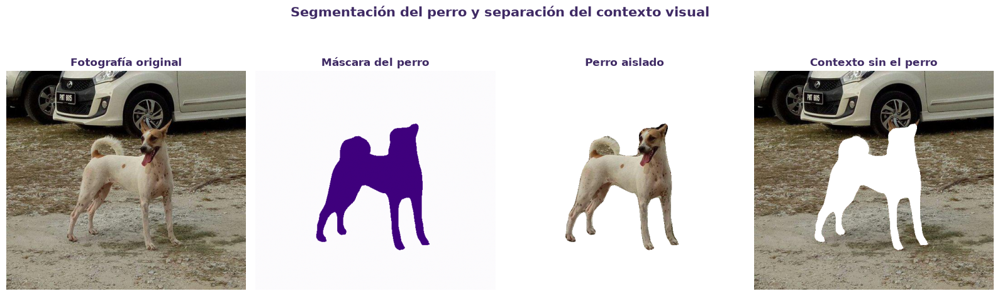

Figura guardada en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\figures\segmentacion_perro_ejemplo.png


In [71]:
# Visualización de la segmentación del perro

fig, axes = plt.subplots(
    1,
    4,
    figsize=(16, 5)
)


axes[0].imshow(
    imagen_original_np
)

axes[0].set_title(
    "Fotografía original",
    fontsize=12,
    fontweight="bold",
    color="#3F2A64"
)

axes[0].axis("off")


axes[1].imshow(
    mascara_perro,
    cmap="Purples"
)

axes[1].set_title(
    "Máscara del perro",
    fontsize=12,
    fontweight="bold",
    color="#3F2A64"
)

axes[1].axis("off")


axes[2].imshow(
    imagen_perro_aislado
)

axes[2].set_title(
    "Perro aislado",
    fontsize=12,
    fontweight="bold",
    color="#3F2A64"
)

axes[2].axis("off")


axes[3].imshow(
    imagen_contexto
)

axes[3].set_title(
    "Contexto sin el perro",
    fontsize=12,
    fontweight="bold",
    color="#3F2A64"
)

axes[3].axis("off")


fig.suptitle(
    "Segmentación del perro y separación del contexto visual",
    fontsize=15,
    fontweight="bold",
    color="#3F2A64",
    y=1.02
)

fig.tight_layout()


fig_path_segmentacion_ejemplo = (
    figures_path
    / "segmentacion_perro_ejemplo.png"
)

fig.savefig(
    fig_path_segmentacion_ejemplo,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("Figura guardada en:")
print(
    fig_path_segmentacion_ejemplo
)

### 13.3. Extracción automática de las máscaras de segmentación

Una vez comprobada la calidad de la segmentación sobre una fotografía individual, el procedimiento se extiende al conjunto visual completo.

Para cada imagen se obtiene una máscara binaria correspondiente a la categoría `dog`. A partir de ella se calcula la proporción de píxeles ocupada por el perro y se registra si el modelo ha conseguido identificar alguna región perteneciente al animal.

Las máscaras permitirán posteriormente generar de forma dinámica las versiones correspondientes al perro aislado y al contexto, evitando almacenar múltiples copias completas de cada fotografía.

Los resultados se almacenan en disco y se reutilizan automáticamente en ejecuciones posteriores del notebook. De este modo, el análisis puede reproducirse sin repetir la segmentación completa salvo que se active expresamente el recálculo.


In [72]:
# Archivos reutilizables de segmentación
segmentacion_summary_path = (
    visual_outputs_path
    / "petfinder_segmentacion_resumen.csv"
)

segmentacion_masks_path = (
    visual_outputs_path
    / "petfinder_segmentacion_masks_224.npz"
)

# Función para obtener la máscara de segmentación del perro

def obtener_mascara_perro(
    ruta_imagen,
    modelo,
    preprocess,
    indice_dog,
    device
):
    try:
        with Image.open(ruta_imagen) as imagen:
            imagen = imagen.convert("RGB")
            imagen_np = np.array(
                imagen,
                dtype=np.uint8
            )

        tensor = (
            preprocess(imagen)
            .unsqueeze(0)
            .to(device)
        )

        with torch.no_grad():
            salida = modelo(
                tensor
            )["out"]

        salida = F.interpolate(
            salida,
            size=(
                imagen_np.shape[0],
                imagen_np.shape[1]
            ),
            mode="bilinear",
            align_corners=False
        )

        clases_pixel = (
            salida
            .argmax(dim=1)
            .squeeze(0)
            .cpu()
            .numpy()
        )

        mascara = (
            clases_pixel
            == indice_dog
        )

        pct_pixeles_perro = float(
            mascara.mean()
        )

        perro_segmentado = bool(
            mascara.any()
        )

        return {
            "mascara": mascara,
            "perro_segmentado": perro_segmentado,
            "pct_pixeles_perro": pct_pixeles_perro
        }

    except Exception:
        return {
            "mascara": None,
            "perro_segmentado": False,
            "pct_pixeles_perro": np.nan
        }


print(
    "Función de segmentación preparada correctamente."
)

Función de segmentación preparada correctamente.


In [73]:
# Se omite esta prueba si las máscaras completas ya están disponibles.
cache_segmentacion_disponible = (
    segmentacion_summary_path.exists()
    and segmentacion_masks_path.exists()
    and not RECALCULAR_ARTEFACTOS
)

if cache_segmentacion_disponible:
    print(
        "Segmentación ya disponible: se omite la prueba de rendimiento."
    )
else:
    # Estimación del tiempo de segmentación sobre una muestra

    import time

    N_MUESTRA_SEGMENTACION = 100

    muestra_segmentacion = (
        petfinder_visual_model_df
        .sample(
            n=N_MUESTRA_SEGMENTACION,
            random_state=RANDOM_STATE
        )
        .reset_index(drop=True)
    )

    resultados_muestra_segmentacion = []

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    inicio_muestra_segmentacion = time.perf_counter()

    for i, fila in enumerate(
        muestra_segmentacion[
            [
                "PetID",
                "ruta_imagen_principal"
            ]
        ].itertuples(index=False),
        start=1
    ):

        resultado = obtener_mascara_perro(
            ruta_imagen=fila.ruta_imagen_principal,
            modelo=modelo_segmentacion,
            preprocess=preprocess_segmentacion,
            indice_dog=indice_dog_segmentacion,
            device=device
        )

        resultados_muestra_segmentacion.append({
            "PetID": fila.PetID,
            "perro_segmentado": resultado[
                "perro_segmentado"
            ],
            "pct_pixeles_perro": resultado[
                "pct_pixeles_perro"
            ]
        })

        if i % 20 == 0:
            print(
                f"Imágenes segmentadas: "
                f"{i}/{N_MUESTRA_SEGMENTACION}"
            )


    tiempo_muestra_segmentacion = (
        time.perf_counter()
        - inicio_muestra_segmentacion
    )

    segmentacion_muestra_df = pd.DataFrame(
        resultados_muestra_segmentacion
    )

    tiempo_medio_imagen = (
        tiempo_muestra_segmentacion
        / N_MUESTRA_SEGMENTACION
    )

    tiempo_estimado_total = (
        tiempo_medio_imagen
        * len(petfinder_visual_model_df)
    )

    cobertura_muestra_segmentacion = (
        segmentacion_muestra_df[
            "perro_segmentado"
        ]
        .mean()
        * 100
    )


    print("\nPrueba completada.")

    print("\nTiempo para 100 fotografías:")
    print(
        f"{tiempo_muestra_segmentacion:.2f} segundos"
    )

    print("\nTiempo medio por fotografía:")
    print(
        f"{tiempo_medio_imagen:.3f} segundos"
    )

    print("\nTiempo estimado para 7.938 fotografías:")
    print(
        f"{tiempo_estimado_total / 60:.2f} minutos"
    )

    print("\nPerro segmentado en la muestra:")
    print(
        f"{cobertura_muestra_segmentacion:.2f}%"
    )

    print("\nUso de GPU:")
    print(device)


Segmentación ya disponible: se omite la prueba de rendimiento.


In [74]:
# Se omite esta prueba si las máscaras completas ya están disponibles.
cache_segmentacion_disponible = (
    segmentacion_summary_path.exists()
    and segmentacion_masks_path.exists()
    and not RECALCULAR_ARTEFACTOS
)

if cache_segmentacion_disponible:
    print(
        "Segmentación ya disponible: se omite la prueba de rendimiento."
    )
else:
    # Prueba de segmentación por lotes en GPU

    import time
    import torch.nn.functional as F

    BATCH_SIZE_SEGMENTACION = 4
    N_MUESTRA_BATCH = 100


    def procesar_batch_segmentacion(
        batch_df,
        modelo,
        preprocess,
        indice_dog,
        device
    ):
        tensores = []
        informacion_imagenes = []

        # Preparación individual de las fotografías
        for fila in batch_df.itertuples(index=False):

            with Image.open(
                fila.ruta_imagen_principal
            ) as imagen:

                imagen = imagen.convert("RGB")

                ancho_original, alto_original = (
                    imagen.size
                )

                tensor = preprocess(
                    imagen
                )

            alto_tensor = tensor.shape[1]
            ancho_tensor = tensor.shape[2]

            tensores.append(
                tensor
            )

            informacion_imagenes.append({
                "PetID": fila.PetID,
                "alto_original": alto_original,
                "ancho_original": ancho_original,
                "alto_tensor": alto_tensor,
                "ancho_tensor": ancho_tensor
            })


        # Dimensiones máximas del lote
        max_alto = max(
            tensor.shape[1]
            for tensor in tensores
        )

        max_ancho = max(
            tensor.shape[2]
            for tensor in tensores
        )


        # Padding únicamente para poder formar el batch
        tensores_padding = []

        for tensor in tensores:

            padding_derecha = (
                max_ancho
                - tensor.shape[2]
            )

            padding_inferior = (
                max_alto
                - tensor.shape[1]
            )

            tensor_padding = F.pad(
                tensor,
                (
                    0,
                    padding_derecha,
                    0,
                    padding_inferior
                )
            )

            tensores_padding.append(
                tensor_padding
            )


        batch_tensor = torch.stack(
            tensores_padding
        ).to(device)


        # Inferencia
        with torch.no_grad():

            salida_batch = modelo(
                batch_tensor
            )["out"]


        resultados_batch = []

        for i, info in enumerate(
            informacion_imagenes
        ):

            # Eliminación del padding
            salida_individual = (
                salida_batch[
                    i:i + 1,
                    :,
                    :info["alto_tensor"],
                    :info["ancho_tensor"]
                ]
            )

            # Recuperación de las dimensiones originales
            salida_individual = F.interpolate(
                salida_individual,
                size=(
                    info["alto_original"],
                    info["ancho_original"]
                ),
                mode="bilinear",
                align_corners=False
            )

            clases_pixel = (
                salida_individual
                .argmax(dim=1)
                .squeeze(0)
                .cpu()
                .numpy()
            )

            mascara = (
                clases_pixel
                == indice_dog
            )

            resultados_batch.append({
                "PetID": info["PetID"],
                "perro_segmentado": bool(
                    mascara.any()
                ),
                "pct_pixeles_perro": float(
                    mascara.mean()
                )
            })


        del batch_tensor
        del salida_batch

        return resultados_batch


    # ---------------------------------------------------------
    # Prueba sobre las mismas 100 fotografías
    # ---------------------------------------------------------

    muestra_batch_segmentacion = (
        muestra_segmentacion[
            [
                "PetID",
                "ruta_imagen_principal"
            ]
        ]
        .copy()
    )

    resultados_prueba_batch = []

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    inicio_batch = time.perf_counter()

    for inicio in range(
        0,
        N_MUESTRA_BATCH,
        BATCH_SIZE_SEGMENTACION
    ):

        fin = min(
            inicio + BATCH_SIZE_SEGMENTACION,
            N_MUESTRA_BATCH
        )

        batch_df = (
            muestra_batch_segmentacion
            .iloc[inicio:fin]
        )

        resultados_batch = (
            procesar_batch_segmentacion(
                batch_df=batch_df,
                modelo=modelo_segmentacion,
                preprocess=preprocess_segmentacion,
                indice_dog=indice_dog_segmentacion,
                device=device
            )
        )

        resultados_prueba_batch.extend(
            resultados_batch
        )

        if (
            fin % 20 == 0
            or fin == N_MUESTRA_BATCH
        ):
            print(
                f"Imágenes segmentadas: "
                f"{fin}/{N_MUESTRA_BATCH}"
            )


    tiempo_prueba_batch = (
        time.perf_counter()
        - inicio_batch
    )

    segmentacion_prueba_batch_df = pd.DataFrame(
        resultados_prueba_batch
    )

    tiempo_medio_batch = (
        tiempo_prueba_batch
        / N_MUESTRA_BATCH
    )

    tiempo_estimado_batch = (
        tiempo_medio_batch
        * len(petfinder_visual_model_df)
    )


    print("\nPrueba por lotes completada.")

    print("\nBatch size:")
    print(BATCH_SIZE_SEGMENTACION)

    print("\nTiempo para 100 fotografías:")
    print(
        f"{tiempo_prueba_batch:.2f} segundos"
    )

    print("\nTiempo medio por fotografía:")
    print(
        f"{tiempo_medio_batch:.3f} segundos"
    )

    print("\nTiempo estimado para 7.938 fotografías:")
    print(
        f"{tiempo_estimado_batch / 60:.2f} minutos"
    )

    print("\nPerro segmentado en la muestra:")
    print(
        f"{segmentacion_prueba_batch_df['perro_segmentado'].mean() * 100:.2f}%"
    )


Segmentación ya disponible: se omite la prueba de rendimiento.


In [76]:
# Segmentación completa o carga de resultados previamente calculados

import time
from torchvision.transforms import InterpolationMode


transform_mask_224 = transforms.Compose([
    transforms.Resize(
        256,
        interpolation=InterpolationMode.NEAREST
    ),
    transforms.CenterCrop(
        (IMAGE_SIZE, IMAGE_SIZE)
    )
])


n_total_segmentacion = len(
    petfinder_visual_model_df
)


usar_cache_segmentacion = (
    segmentacion_summary_path.exists()
    and segmentacion_masks_path.exists()
    and not RECALCULAR_ARTEFACTOS
)


# =========================================================
# CARGA DE RESULTADOS PREVIAMENTE CALCULADOS
# =========================================================

if usar_cache_segmentacion:

    segmentacion_petfinder_df = pd.read_csv(
        segmentacion_summary_path,
        encoding="utf-8-sig",
        dtype={"PetID": str}
    )


    # -----------------------------------------------------
    # Carga del archivo de máscaras
    # -----------------------------------------------------
    # Los archivos generados anteriormente pueden contener
    # PetID almacenado como dtype object.
    #
    # Primero se intenta una carga segura sin pickle.
    # Si el archivo pertenece al formato anterior, se carga
    # una única vez permitiendo pickle y se convierte
    # inmediatamente a un formato compatible sin pickle.
    # -----------------------------------------------------

    archivo_masks_formato_antiguo = False

    try:

        with np.load(
            segmentacion_masks_path,
            allow_pickle=False
        ) as datos_masks:

            petids_masks = (
                datos_masks[
                    "PetID"
                ]
                .astype(str)
                .copy()
            )

            mascaras_224_packed = (
                datos_masks[
                    "masks_packed"
                ]
                .copy()
            )

            mascaras_validas = (
                datos_masks[
                    "mask_valid"
                ]
                .astype(bool)
                .copy()
            )


    except ValueError:

        archivo_masks_formato_antiguo = True

        print(
            "Archivo de máscaras en formato anterior. "
            "Convirtiendo automáticamente..."
        )

        with np.load(
            segmentacion_masks_path,
            allow_pickle=True
        ) as datos_masks:

            petids_masks = (
                np.asarray(
                    datos_masks[
                        "PetID"
                    ]
                )
                .astype(str)
            )

            mascaras_224_packed = (
                datos_masks[
                    "masks_packed"
                ]
                .copy()
            )

            mascaras_validas = (
                datos_masks[
                    "mask_valid"
                ]
                .astype(bool)
                .copy()
            )


    # -----------------------------------------------------
    # Conversión del archivo antiguo a formato seguro
    # -----------------------------------------------------

    if archivo_masks_formato_antiguo:

        longitud_maxima_petid = max(
            len(petid)
            for petid in petids_masks
        )

        petids_masks = np.asarray(
            petids_masks,
            dtype=f"<U{longitud_maxima_petid}"
        )

        np.savez_compressed(
            segmentacion_masks_path,
            PetID=petids_masks,
            masks_packed=mascaras_224_packed,
            mask_valid=mascaras_validas,
            image_size=np.array(
                [IMAGE_SIZE],
                dtype=np.int16
            )
        )

        print(
            "Archivo convertido correctamente "
            "a formato compatible sin pickle."
        )


    # -----------------------------------------------------
    # Comprobación de correspondencia de los PetID
    # -----------------------------------------------------

    petids_esperados = (
        petfinder_visual_model_df[
            "PetID"
        ]
        .astype(str)
        .to_numpy()
    )

    if not np.array_equal(
        petids_masks,
        petids_esperados
    ):

        raise ValueError(
            "El orden de PetID del archivo de máscaras "
            "no coincide con el dataset visual actual."
        )


    # No se vuelve a realizar la segmentación,
    # por lo que no existe un nuevo tiempo de inferencia.

    tiempo_segmentacion_total = np.nan

    print(
        "Resultados de segmentación cargados "
        "desde archivos existentes."
    )


# =========================================================
# CÁLCULO COMPLETO DE LA SEGMENTACIÓN
# =========================================================

else:

    n_pixeles_mask = (
        IMAGE_SIZE * IMAGE_SIZE
    )

    n_bytes_mask = int(
        np.ceil(
            n_pixeles_mask / 8
        )
    )


    mascaras_224_packed = np.zeros(
        (
            n_total_segmentacion,
            n_bytes_mask
        ),
        dtype=np.uint8
    )


    mascaras_validas = np.zeros(
        n_total_segmentacion,
        dtype=bool
    )


    resultados_segmentacion = []


    if torch.cuda.is_available():
        torch.cuda.empty_cache()


    inicio_segmentacion_total = (
        time.perf_counter()
    )


    for i, fila in enumerate(
        petfinder_visual_model_df[
            [
                "PetID",
                "ruta_imagen_principal"
            ]
        ].itertuples(index=False)
    ):

        resultado = obtener_mascara_perro(
            ruta_imagen=fila.ruta_imagen_principal,
            modelo=modelo_segmentacion,
            preprocess=preprocess_segmentacion,
            indice_dog=indice_dog_segmentacion,
            device=device
        )


        mascara_original = resultado[
            "mascara"
        ]

        perro_segmentado = resultado[
            "perro_segmentado"
        ]

        pct_pixeles_original = resultado[
            "pct_pixeles_perro"
        ]


        pct_pixeles_modelo = np.nan


        if (
            mascara_original is not None
            and perro_segmentado
        ):

            mascara_pil = Image.fromarray(
                (
                    mascara_original.astype(
                        np.uint8
                    )
                    * 255
                )
            )


            mascara_224_pil = transform_mask_224(
                mascara_pil
            )


            mascara_224 = (
                np.array(
                    mascara_224_pil
                ) > 127
            )


            pct_pixeles_modelo = float(
                mascara_224.mean()
            )


            mascara_packed = np.packbits(
                mascara_224
                .astype(np.uint8)
                .reshape(-1)
            )


            mascaras_224_packed[
                i,
                :len(mascara_packed)
            ] = mascara_packed


            mascaras_validas[i] = True


        resultados_segmentacion.append({
            "PetID": fila.PetID,
            "perro_segmentado": perro_segmentado,
            "pct_pixeles_perro_original": (
                pct_pixeles_original
            ),
            "pct_pixeles_perro_modelo": (
                pct_pixeles_modelo
            )
        })


        n_procesadas = i + 1


        if (
            n_procesadas % 500 == 0
            or n_procesadas == n_total_segmentacion
        ):

            print(
                f"Imágenes segmentadas: "
                f"{n_procesadas}/"
                f"{n_total_segmentacion}"
            )


    tiempo_segmentacion_total = (
        time.perf_counter()
        - inicio_segmentacion_total
    )


    # -----------------------------------------------------
    # Construcción y guardado del resumen
    # -----------------------------------------------------

    segmentacion_petfinder_df = pd.DataFrame(
        resultados_segmentacion
    )


    segmentacion_petfinder_df.to_csv(
        segmentacion_summary_path,
        index=False,
        encoding="utf-8-sig"
    )


    # -----------------------------------------------------
    # PetID en formato Unicode nativo de NumPy
    # para evitar dtype object y pickle
    # -----------------------------------------------------

    petids_segmentacion_guardado = np.asarray(
        petfinder_visual_model_df[
            "PetID"
        ]
        .astype(str)
        .tolist(),
        dtype=str
    )


    np.savez_compressed(
        segmentacion_masks_path,
        PetID=petids_segmentacion_guardado,
        masks_packed=mascaras_224_packed,
        mask_valid=mascaras_validas,
        image_size=np.array(
            [IMAGE_SIZE],
            dtype=np.int16
        )
    )


# =========================================================
# RESUMEN FINAL
# =========================================================

n_segmentadas = int(
    segmentacion_petfinder_df[
        "perro_segmentado"
    ].sum()
)


n_no_segmentadas = (
    n_total_segmentacion
    - n_segmentadas
)


cobertura_segmentacion = (
    n_segmentadas
    / n_total_segmentacion
    * 100
)


print("\nFotografías analizadas:")
print(
    n_total_segmentacion
)


print("\nPerros segmentados:")
print(
    n_segmentadas
)


print("\nSin segmentación de perro:")
print(
    n_no_segmentadas
)


print("\nCobertura de segmentación:")
print(
    f"{cobertura_segmentacion:.2f}%"
)


if not np.isnan(
    tiempo_segmentacion_total
):

    print("\nTiempo total:")
    print(
        f"{tiempo_segmentacion_total / 60:.2f} minutos"
    )


print("\nResumen disponible en:")
print(
    segmentacion_summary_path
)


print("\nMáscaras compactas disponibles en:")
print(
    segmentacion_masks_path
)


print("\nTamaño del archivo de máscaras:")
print(
    f"{segmentacion_masks_path.stat().st_size / 1024**2:.2f} MB"
)


print("\nPrimeras filas:")

display(
    segmentacion_petfinder_df
    .head()
    .round(4)
)

Archivo de máscaras en formato anterior. Convirtiendo automáticamente...
Archivo convertido correctamente a formato compatible sin pickle.
Resultados de segmentación cargados desde archivos existentes.

Fotografías analizadas:
7938

Perros segmentados:
7878

Sin segmentación de perro:
60

Cobertura de segmentación:
99.24%

Resumen disponible en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\petfinder_visual\petfinder_segmentacion_resumen.csv

Máscaras compactas disponibles en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\petfinder_visual\petfinder_segmentacion_masks_224.npz

Tamaño del archivo de máscaras:
3.67 MB

Primeras filas:


,PetID,perro_segmentado,pct_pixeles_perro_original,pct_pixeles_perro_modelo
0,3422e4906,True,0.4191,0.5600
1,5842f1ff5,True,0.5243,0.7106
2,850a43f90,True,0.2461,0.4615
3,97aa9eeac,True,0.3795,0.5980
4,8b693ca84,True,0.3051,0.6034


In [113]:
# Resumen final de la segmentación

print("Fotografías analizadas:")
print(len(segmentacion_petfinder_df))

print("\nPerros segmentados:")
print(
    segmentacion_petfinder_df[
        "perro_segmentado"
    ].sum()
)

print("\nSin segmentación de perro:")
print(
    (
        ~segmentacion_petfinder_df[
            "perro_segmentado"
        ]
    ).sum()
)

print("\nCobertura de segmentación:")
print(
    f"{segmentacion_petfinder_df['perro_segmentado'].mean() * 100:.2f}%"
)

print("\nProporción media de píxeles ocupados por el perro:")
print(
    f"{segmentacion_petfinder_df['pct_pixeles_perro_original'].mean() * 100:.2f}%"
)

print("\nProporción mediana de píxeles ocupados por el perro:")
print(
    f"{segmentacion_petfinder_df['pct_pixeles_perro_original'].median() * 100:.2f}%"
)

Fotografías analizadas:
7938

Perros segmentados:
7878

Sin segmentación de perro:
60

Cobertura de segmentación:
99.24%

Proporción media de píxeles ocupados por el perro:
29.29%

Proporción mediana de píxeles ocupados por el perro:
27.55%


### 13.4. Comparación entre detección y segmentación

La detección mediante MediaPipe y la segmentación mediante DeepLabV3 proporcionan dos aproximaciones diferentes al espacio ocupado por el perro dentro de la fotografía.

MediaPipe utiliza un *bounding box* rectangular que engloba al animal y puede incluir parte del fondo circundante. En cambio, DeepLabV3 identifica directamente los píxeles correspondientes a la categoría `dog`, proporcionando una aproximación más precisa a la silueta visible del perro.

La comparación entre ambas medidas permite comprobar su grado de asociación y cuantificar la diferencia entre una estimación basada en el encuadre rectangular y otra basada en la superficie real segmentada.

In [77]:
# Comparación entre la ocupación estimada por MediaPipe
# y la obtenida mediante segmentación

comparacion_deteccion_segmentacion = (
    petfinder_visual_mediapipe_df
    .merge(
        segmentacion_petfinder_df[
            [
                "PetID",
                "perro_segmentado",
                "pct_pixeles_perro_original"
            ]
        ],
        on="PetID",
        how="left",
        validate="one_to_one"
    )
)

comparacion_valida = (
    comparacion_deteccion_segmentacion.loc[
        (
            comparacion_deteccion_segmentacion[
                "perro_detectado"
            ]
        )
        & (
            comparacion_deteccion_segmentacion[
                "perro_segmentado"
            ]
        )
    ]
    .copy()
)

correlacion_pearson_ocupacion = (
    comparacion_valida[
        [
            "pct_imagen_ocupada_perro",
            "pct_pixeles_perro_original"
        ]
    ]
    .corr(method="pearson")
    .iloc[0, 1]
)

correlacion_spearman_ocupacion = (
    comparacion_valida[
        [
            "pct_imagen_ocupada_perro",
            "pct_pixeles_perro_original"
        ]
    ]
    .corr(method="spearman")
    .iloc[0, 1]
)

comparacion_valida[
    "diferencia_ocupacion"
] = (
    comparacion_valida[
        "pct_imagen_ocupada_perro"
    ]
    - comparacion_valida[
        "pct_pixeles_perro_original"
    ]
)

print("Fotografías comparables:")
print(
    len(comparacion_valida)
)

print("\nOcupación media mediante bounding box:")
print(
    f"{comparacion_valida['pct_imagen_ocupada_perro'].mean() * 100:.2f}%"
)

print("\nOcupación media mediante segmentación:")
print(
    f"{comparacion_valida['pct_pixeles_perro_original'].mean() * 100:.2f}%"
)

print("\nDiferencia media:")
print(
    f"{comparacion_valida['diferencia_ocupacion'].mean() * 100:.2f} puntos porcentuales"
)

print("\nCorrelación de Pearson:")
print(
    f"{correlacion_pearson_ocupacion:.4f}"
)

print("\nCorrelación de Spearman:")
print(
    f"{correlacion_spearman_ocupacion:.4f}"
)

print("\nResumen:")
display(
    comparacion_valida[
        [
            "pct_imagen_ocupada_perro",
            "pct_pixeles_perro_original",
            "diferencia_ocupacion"
        ]
    ]
    .describe()
    .round(4)
)

Fotografías comparables:
7438

Ocupación media mediante bounding box:
51.48%

Ocupación media mediante segmentación:
29.90%

Diferencia media:
21.58 puntos porcentuales

Correlación de Pearson:
0.7240

Correlación de Spearman:
0.7384

Resumen:


,pct_imagen_ocupada_perro,pct_pixeles_perro_original,diferencia_ocupacion
count,7438.0000,7438.0000,7438.0000
mean,0.5148,0.2990,0.2158
std,0.2445,0.1462,0.1715
min,0.0080,0.0000,-0.5574
25%,0.3183,0.1926,0.1214
50%,0.5075,0.2800,0.2197
75%,0.7154,0.3867,0.3300
max,0.9938,0.9679,0.9039


### 13.5. Relación entre la detección y la segmentación

Las medidas obtenidas mediante MediaPipe y DeepLabV3 presentan una asociación elevada, aunque reflejan conceptos visuales diferentes.

El *bounding box* proporciona una aproximación al espacio rectangular necesario para contener al perro, mientras que la segmentación estima directamente la superficie ocupada por su silueta. Por este motivo, la proporción obtenida mediante detección es sistemáticamente superior en la mayoría de las fotografías.

La relación entre ambas medidas permite comprobar que las dos aproximaciones capturan de forma consistente el tamaño relativo del animal, al tiempo que la segmentación proporciona una estimación más ajustada de su superficie visual real.

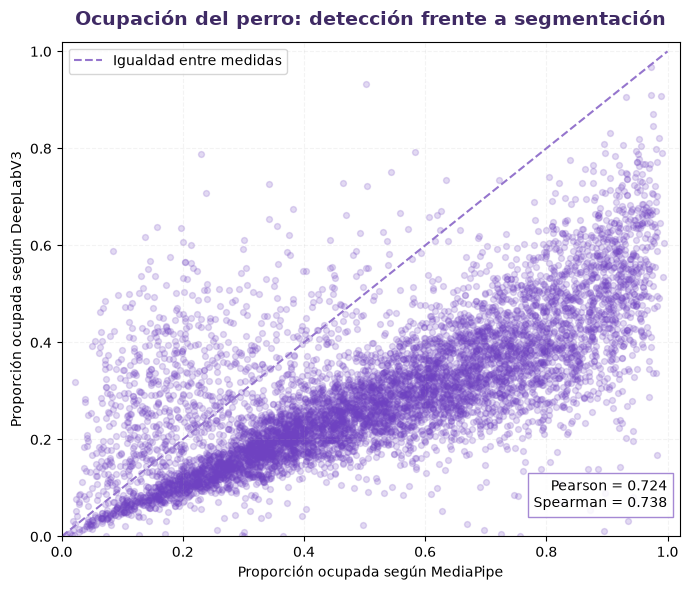

Figura guardada en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\figures\mediapipe_vs_segmentacion_ocupacion.png


In [78]:
# Relación entre la ocupación estimada por MediaPipe y DeepLabV3

fig, ax = plt.subplots(
    figsize=(7, 6)
)

ax.scatter(
    comparacion_valida[
        "pct_imagen_ocupada_perro"
    ],
    comparacion_valida[
        "pct_pixeles_perro_original"
    ],
    s=18,
    alpha=0.20,
    color="#6F42C1"
)

# Línea de igualdad
ax.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    linewidth=1.5,
    color="#9575CD",
    label="Igualdad entre medidas"
)

ax.set_title(
    "Ocupación del perro: detección frente a segmentación",
    fontsize=14,
    fontweight="bold",
    color="#3F2A64",
    pad=12
)

ax.set_xlabel(
    "Proporción ocupada según MediaPipe"
)

ax.set_ylabel(
    "Proporción ocupada según DeepLabV3"
)

ax.set_xlim(
    0,
    1.02
)

ax.set_ylim(
    0,
    1.02
)

ax.grid(
    linestyle="--",
    alpha=0.15
)

ax.legend(
    loc="upper left"
)

ax.text(
    0.98,
    0.05,
    (
        f"Pearson = {correlacion_pearson_ocupacion:.3f}\n"
        f"Spearman = {correlacion_spearman_ocupacion:.3f}"
    ),
    transform=ax.transAxes,
    ha="right",
    va="bottom",
    fontsize=10,
    bbox={
        "facecolor": "white",
        "alpha": 0.85,
        "edgecolor": "#9575CD"
    }
)

fig.tight_layout()

fig_path_deteccion_segmentacion = (
    figures_path
    / "mediapipe_vs_segmentacion_ocupacion.png"
)

fig.savefig(
    fig_path_deteccion_segmentacion,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("Figura guardada en:")
print(fig_path_deteccion_segmentacion)

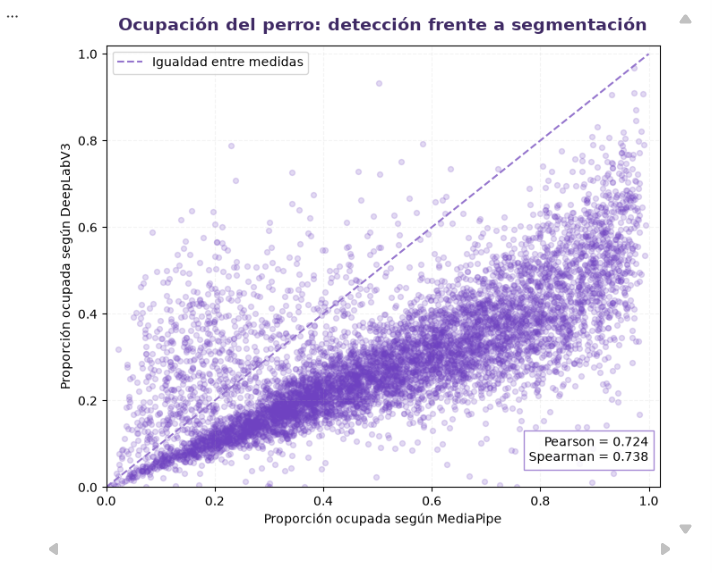

### 13.6. Análisis de la información aportada por el perro y el contexto

La segmentación permite realizar un análisis adicional sobre la procedencia de la señal utilizada por el modelo visual.

A partir de la máscara del perro se generan tres versiones de una misma fotografía: la imagen completa, una representación que conserva únicamente al animal y otra en la que se mantiene exclusivamente el contexto. Las tres versiones se procesan con el mismo EfficientNet-B0 previamente seleccionado, sin modificar sus pesos ni realizar un nuevo entrenamiento.

Este análisis permite estudiar cómo cambia la predicción cuando se elimina alternativamente la información correspondiente al fondo o al propio perro. Debe interpretarse como un análisis de sensibilidad del modelo y no como una evaluación de nuevos modelos entrenados específicamente sobre imágenes segmentadas.

In [79]:
# Comprobación de las representaciones completa, perro y contexto
# utilizando un fondo neutro para EfficientNet

petid_ablation_ejemplo = "c7d02bfca"

# Localización del perro en el dataset visual
fila_ablation = (
    petfinder_visual_model_df.loc[
        petfinder_visual_model_df["PetID"]
        == petid_ablation_ejemplo
    ]
)

if fila_ablation.empty:
    raise ValueError(
        f"No se ha encontrado el PetID {petid_ablation_ejemplo}."
    )

fila_ablation = fila_ablation.iloc[0]


# Localización de su máscara compacta
indice_ablation = (
    petfinder_visual_model_df
    .reset_index(drop=True)
    .index[
        petfinder_visual_model_df[
            "PetID"
        ].reset_index(drop=True)
        == petid_ablation_ejemplo
    ][0]
)

if not mascaras_validas[indice_ablation]:
    raise ValueError(
        "No existe una máscara válida para este perro."
    )


# Reconstrucción de la máscara 224 x 224
mascara_ablation = np.unpackbits(
    mascaras_224_packed[
        indice_ablation
    ]
)[:IMAGE_SIZE * IMAGE_SIZE]

mascara_ablation = (
    mascara_ablation
    .reshape(
        IMAGE_SIZE,
        IMAGE_SIZE
    )
    .astype(bool)
)


# Preparación de la misma zona de imagen utilizada por EfficientNet
with Image.open(
    fila_ablation[
        "ruta_imagen_principal"
    ]
) as imagen:

    imagen = imagen.convert("RGB")

    imagen_224_pil = (
        transform_display(
            imagen
        )
    )

imagen_224_np = (
    np.array(
        imagen_224_pil
    )
    .astype(np.float32)
    / 255.0
)


# Color medio de ImageNet.
# Tras la normalización equivale aproximadamente a cero
# y actúa como una zona neutra para EfficientNet.
color_neutro_imagenet = np.array(
    [
        0.485,
        0.456,
        0.406
    ],
    dtype=np.float32
)

fondo_neutro = np.zeros_like(
    imagen_224_np,
    dtype=np.float32
)

fondo_neutro[:] = (
    color_neutro_imagenet
)


# Imagen que conserva únicamente el perro
imagen_perro_np = np.where(
    mascara_ablation[..., None],
    imagen_224_np,
    fondo_neutro
)


# Imagen que conserva únicamente el contexto
imagen_contexto_np = np.where(
    mascara_ablation[..., None],
    fondo_neutro,
    imagen_224_np
)


# Función para preparar una imagen para EfficientNet
def preparar_tensor_ablation(
    imagen_np
):
    tensor = torch.from_numpy(
        imagen_np.transpose(
            2,
            0,
            1
        )
    ).float()

    tensor = (
        (tensor - mean_imagenet)
        / std_imagenet
    )

    return (
        tensor
        .unsqueeze(0)
        .to(device)
    )


tensor_completo = preparar_tensor_ablation(
    imagen_224_np
)

tensor_perro = preparar_tensor_ablation(
    imagen_perro_np
)

tensor_contexto = preparar_tensor_ablation(
    imagen_contexto_np
)


# Predicciones con el mismo EfficientNet
modelo_visual.eval()

with torch.no_grad():

    prob_completa = torch.sigmoid(
        modelo_visual(
            tensor_completo
        ).squeeze()
    ).item()

    prob_perro = torch.sigmoid(
        modelo_visual(
            tensor_perro
        ).squeeze()
    ).item()

    prob_contexto = torch.sigmoid(
        modelo_visual(
            tensor_contexto
        ).squeeze()
    ).item()


print("PetID:")
print(petid_ablation_ejemplo)

print("\nProbabilidad con fotografía completa:")
print(f"{prob_completa:.4f}")

print("\nProbabilidad conservando únicamente el perro:")
print(f"{prob_perro:.4f}")

print("\nProbabilidad conservando únicamente el contexto:")
print(f"{prob_contexto:.4f}")

print("\nCambio al conservar únicamente el perro:")
print(
    f"{prob_perro - prob_completa:+.4f}"
)

print("\nCambio al conservar únicamente el contexto:")
print(
    f"{prob_contexto - prob_completa:+.4f}"
)

PetID:
c7d02bfca

Probabilidad con fotografía completa:
0.9011

Probabilidad conservando únicamente el perro:
0.8605

Probabilidad conservando únicamente el contexto:
0.8276

Cambio al conservar únicamente el perro:
-0.0406

Cambio al conservar únicamente el contexto:
-0.0734


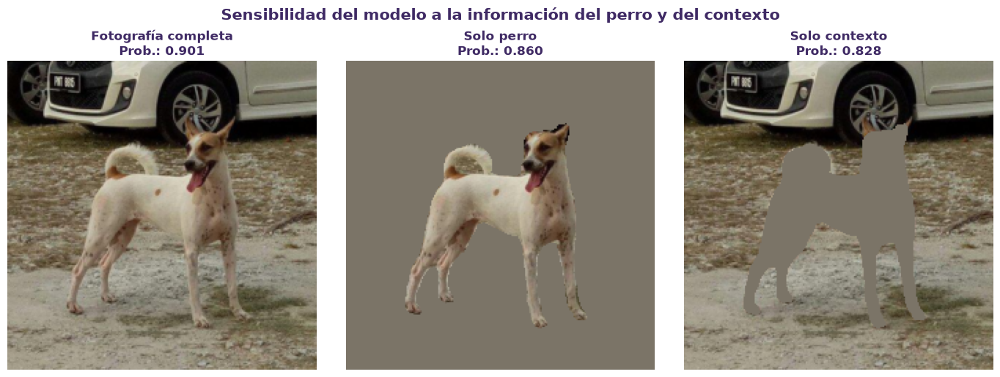

In [80]:
# Visualización del análisis perro frente a contexto

fig, axes = plt.subplots(
    1,
    3,
    figsize=(14, 5)
)

axes[0].imshow(
    imagen_224_np
)

axes[0].set_title(
    f"Fotografía completa\nProb.: {prob_completa:.3f}",
    fontsize=12,
    fontweight="bold",
    color="#3F2A64"
)

axes[0].axis("off")


axes[1].imshow(
    imagen_perro_np
)

axes[1].set_title(
    f"Solo perro\nProb.: {prob_perro:.3f}",
    fontsize=12,
    fontweight="bold",
    color="#3F2A64"
)

axes[1].axis("off")


axes[2].imshow(
    imagen_contexto_np
)

axes[2].set_title(
    f"Solo contexto\nProb.: {prob_contexto:.3f}",
    fontsize=12,
    fontweight="bold",
    color="#3F2A64"
)

axes[2].axis("off")


fig.suptitle(
    "Sensibilidad del modelo a la información del perro y del contexto",
    fontsize=15,
    fontweight="bold",
    color="#3F2A64",
    y=1.02
)

fig.tight_layout()

fig_path_ablation_ejemplo = (
    figures_path
    / "segmentacion_perro_vs_contexto_ejemplo.png"
)

fig.savefig(
    fig_path_ablation_ejemplo,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

### 13.7. Análisis de sensibilidad sobre el conjunto de test

Una vez comprobado el procedimiento sobre una fotografía individual, el análisis se extiende al conjunto de test para estudiar de forma agregada el efecto de conservar únicamente al perro o únicamente el contexto.

Para cada fotografía se generan las tres representaciones utilizando exactamente la misma máscara de segmentación y el mismo preprocesamiento empleado por EfficientNet-B0. El modelo permanece completamente inalterado y no se realiza ningún entrenamiento adicional.

La comparación se plantea como un análisis de sensibilidad: las imágenes parcialmente enmascaradas no constituyen nuevas muestras naturales del problema, sino intervenciones artificiales destinadas a estudiar cuánto se modifica el score cuando se elimina determinada información visual.

In [81]:
# Análisis de sensibilidad del modelo sobre el conjunto de test

import time

# Correspondencia entre PetID y posición de la máscara almacenada
indice_mascara_por_petid = {
    str(petid): i
    for i, petid in enumerate(
        petfinder_visual_model_df[
            "PetID"
        ].astype(str)
    )
}

resultados_ablation_test = []

inicio_ablation_test = time.perf_counter()

modelo_visual.eval()

for i, fila in enumerate(
    test_visual_df[
        [
            "PetID",
            "ruta_imagen_principal",
            "target_adopcion_lenta"
        ]
    ].itertuples(index=False),
    start=1
):

    petid = str(fila.PetID)

    indice_mascara = (
        indice_mascara_por_petid[
            petid
        ]
    )

    if not mascaras_validas[
        indice_mascara
    ]:
        continue

    # Reconstrucción de la máscara
    mascara = np.unpackbits(
        mascaras_224_packed[
            indice_mascara
        ]
    )[:IMAGE_SIZE * IMAGE_SIZE]

    mascara = (
        mascara
        .reshape(
            IMAGE_SIZE,
            IMAGE_SIZE
        )
        .astype(bool)
    )

    # Misma zona de imagen que utiliza EfficientNet
    with Image.open(
        fila.ruta_imagen_principal
    ) as imagen:

        imagen = imagen.convert("RGB")

        imagen_224 = (
            transform_display(
                imagen
            )
        )

    imagen_np = (
        np.array(
            imagen_224
        )
        .astype(np.float32)
        / 255.0
    )

    # Fondo neutro
    fondo_neutro = np.zeros_like(
        imagen_np,
        dtype=np.float32
    )

    fondo_neutro[:] = (
        color_neutro_imagenet
    )

    # Solo perro
    imagen_perro = np.where(
        mascara[..., None],
        imagen_np,
        fondo_neutro
    )

    # Solo contexto
    imagen_contexto = np.where(
        mascara[..., None],
        fondo_neutro,
        imagen_np
    )

    # Preparación conjunta de las tres imágenes
    tensor_completo = preparar_tensor_ablation(
        imagen_np
    )

    tensor_perro = preparar_tensor_ablation(
        imagen_perro
    )

    tensor_contexto = preparar_tensor_ablation(
        imagen_contexto
    )

    batch_ablation = torch.cat(
        [
            tensor_completo,
            tensor_perro,
            tensor_contexto
        ],
        dim=0
    )

    with torch.no_grad():

        logits = (
            modelo_visual(
                batch_ablation
            )
            .squeeze(1)
        )

        probabilidades = (
            torch.sigmoid(
                logits
            )
            .cpu()
            .numpy()
        )

    resultados_ablation_test.append({
        "PetID": petid,
        "y_true": int(
            fila.target_adopcion_lenta
        ),
        "prob_completa": float(
            probabilidades[0]
        ),
        "prob_solo_perro": float(
            probabilidades[1]
        ),
        "prob_solo_contexto": float(
            probabilidades[2]
        )
    })

    if (
        i % 250 == 0
        or i == len(test_visual_df)
    ):
        print(
            f"Fotografías procesadas: "
            f"{i}/{len(test_visual_df)}"
        )


tiempo_ablation_test = (
    time.perf_counter()
    - inicio_ablation_test
)

ablation_test_df = pd.DataFrame(
    resultados_ablation_test
)

print("\nAnálisis completado.")

print("\nFotografías evaluadas:")
print(
    len(ablation_test_df)
)

print("\nTiempo total:")
print(
    f"{tiempo_ablation_test / 60:.2f} minutos"
)

print("\nPrimeras filas:")
display(
    ablation_test_df.head().round(4)
)

Fotografías procesadas: 250/1592
Fotografías procesadas: 500/1592
Fotografías procesadas: 750/1592
Fotografías procesadas: 1000/1592
Fotografías procesadas: 1250/1592
Fotografías procesadas: 1500/1592
Fotografías procesadas: 1592/1592

Análisis completado.

Fotografías evaluadas:
1581

Tiempo total:
0.68 minutos

Primeras filas:


,PetID,y_true,prob_completa,prob_solo_perro,prob_solo_contexto
0,850a43f90,0,0.2423,0.2390,0.3947
1,c02be41e6,0,0.7733,0.7280,0.5498
2,1a76190c5,1,0.2646,0.3527,0.5245
3,4e3640544,1,0.6422,0.7113,0.5182
4,b0dec8779,1,0.1656,0.1352,0.4689


### 13.8. Comparación global entre la información del perro y del contexto

El análisis de sensibilidad se evalúa de forma agregada sobre las fotografías de test con una máscara de segmentación válida.

La capacidad discriminativa de EfficientNet-B0 se calcula utilizando alternativamente la fotografía completa, únicamente los píxeles correspondientes al perro y únicamente el contexto. Las regiones eliminadas se sustituyen por el color medio utilizado en la normalización de ImageNet, reduciendo la introducción de información visual artificial.

Dado que estas representaciones enmascaradas constituyen intervenciones sobre las fotografías originales y el conjunto de test ya se encuentra en fase de evaluación, no se seleccionan nuevos umbrales de clasificación. La comparación se centra principalmente en métricas independientes del umbral y en la variación del score respecto a la fotografía completa.

In [82]:
# Comparación global de fotografía completa, perro y contexto

y_ablation_test = (
    ablation_test_df[
        "y_true"
    ]
    .to_numpy()
)

score_completo_ablation = (
    ablation_test_df[
        "prob_completa"
    ]
    .to_numpy()
)

score_perro_ablation = (
    ablation_test_df[
        "prob_solo_perro"
    ]
    .to_numpy()
)

score_contexto_ablation = (
    ablation_test_df[
        "prob_solo_contexto"
    ]
    .to_numpy()
)


# ---------------------------------------------------------
# Métricas independientes del umbral
# ---------------------------------------------------------

resultados_ablation_metricas = pd.DataFrame([
    {
        "representacion": "Fotografía completa",
        "roc_auc": roc_auc_score(
            y_ablation_test,
            score_completo_ablation
        ),
        "average_precision": average_precision_score(
            y_ablation_test,
            score_completo_ablation
        )
    },
    {
        "representacion": "Solo perro",
        "roc_auc": roc_auc_score(
            y_ablation_test,
            score_perro_ablation
        ),
        "average_precision": average_precision_score(
            y_ablation_test,
            score_perro_ablation
        )
    },
    {
        "representacion": "Solo contexto",
        "roc_auc": roc_auc_score(
            y_ablation_test,
            score_contexto_ablation
        ),
        "average_precision": average_precision_score(
            y_ablation_test,
            score_contexto_ablation
        )
    }
])


# ---------------------------------------------------------
# Cambios del score respecto a la fotografía completa
# ---------------------------------------------------------

ablation_test_df[
    "cambio_solo_perro"
] = (
    ablation_test_df[
        "prob_solo_perro"
    ]
    - ablation_test_df[
        "prob_completa"
    ]
)

ablation_test_df[
    "cambio_solo_contexto"
] = (
    ablation_test_df[
        "prob_solo_contexto"
    ]
    - ablation_test_df[
        "prob_completa"
    ]
)


cambio_medio_perro = (
    ablation_test_df[
        "cambio_solo_perro"
    ]
    .mean()
)

cambio_medio_contexto = (
    ablation_test_df[
        "cambio_solo_contexto"
    ]
    .mean()
)

cambio_abs_perro = (
    ablation_test_df[
        "cambio_solo_perro"
    ]
    .abs()
    .mean()
)

cambio_abs_contexto = (
    ablation_test_df[
        "cambio_solo_contexto"
    ]
    .abs()
    .mean()
)


# ---------------------------------------------------------
# Correlación con el score original
# ---------------------------------------------------------

correlacion_perro = (
    ablation_test_df[
        [
            "prob_completa",
            "prob_solo_perro"
        ]
    ]
    .corr(method="spearman")
    .iloc[0, 1]
)

correlacion_contexto = (
    ablation_test_df[
        [
            "prob_completa",
            "prob_solo_contexto"
        ]
    ]
    .corr(method="spearman")
    .iloc[0, 1]
)


print("Comparación de capacidad discriminativa:")

display(
    resultados_ablation_metricas.round(4)
)


print("\nCambio medio del score al conservar solo el perro:")
print(
    f"{cambio_medio_perro:+.4f}"
)

print("\nCambio medio del score al conservar solo el contexto:")
print(
    f"{cambio_medio_contexto:+.4f}"
)

print("\nCambio absoluto medio al conservar solo el perro:")
print(
    f"{cambio_abs_perro:.4f}"
)

print("\nCambio absoluto medio al conservar solo el contexto:")
print(
    f"{cambio_abs_contexto:.4f}"
)

print("\nCorrelación de Spearman con el score original:")

print(
    f"Solo perro:    "
    f"{correlacion_perro:.4f}"
)

print(
    f"Solo contexto: "
    f"{correlacion_contexto:.4f}"
)

Comparación de capacidad discriminativa:


,representacion,roc_auc,average_precision
0,Fotografía completa,0.6746,0.6926
1,Solo perro,0.6627,0.6832
2,Solo contexto,0.5647,0.5951



Cambio medio del score al conservar solo el perro:
-0.0226

Cambio medio del score al conservar solo el contexto:
+0.0217

Cambio absoluto medio al conservar solo el perro:
0.0575

Cambio absoluto medio al conservar solo el contexto:
0.1404

Correlación de Spearman con el score original:
Solo perro:    0.8962
Solo contexto: 0.2971


### 13.9. Comparación de la información aportada por el perro y el contexto

Los resultados muestran que la representación que conserva únicamente al perro mantiene gran parte de la capacidad discriminativa del modelo original. La reducción de ROC-AUC y Average Precision respecto a la fotografía completa es limitada y los scores generados presentan una elevada correlación con las predicciones originales.

Por el contrario, cuando se conserva únicamente el contexto, la capacidad discriminativa disminuye de forma considerable y la relación con el score original se debilita notablemente.

Estos resultados sugieren que la mayor parte de la señal utilizada por EfficientNet-B0 procede de las características visuales del propio perro, mientras que el contexto aporta información complementaria de menor relevancia. Dado que las imágenes enmascaradas no representan fotografías naturales y el modelo no ha sido entrenado específicamente sobre ellas, este análisis debe interpretarse como una evaluación de sensibilidad y no como una comparación entre modelos independientes.

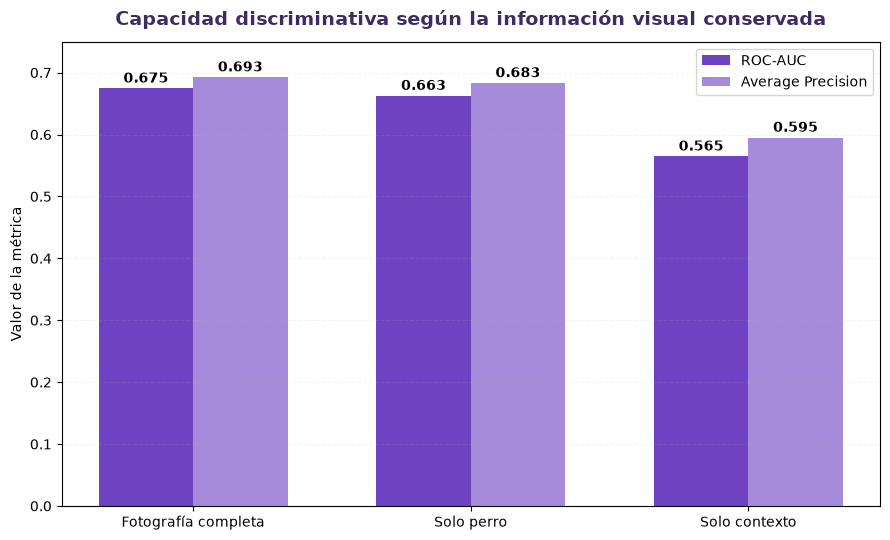

Figura guardada en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\figures\segmentacion_comparacion_perro_contexto.png


In [83]:
# Comparación de la capacidad discriminativa según la información conservada

metricas_plot = (
    resultados_ablation_metricas
    .set_index("representacion")
)

representaciones = [
    "Fotografía completa",
    "Solo perro",
    "Solo contexto"
]

roc_values = (
    metricas_plot
    .loc[
        representaciones,
        "roc_auc"
    ]
    .to_numpy()
)

ap_values = (
    metricas_plot
    .loc[
        representaciones,
        "average_precision"
    ]
    .to_numpy()
)

x = np.arange(
    len(representaciones)
)

ancho_barra = 0.34

fig, ax = plt.subplots(
    figsize=(9, 5.5)
)

barras_roc = ax.bar(
    x - ancho_barra / 2,
    roc_values,
    width=ancho_barra,
    label="ROC-AUC",
    color="#6F42C1"
)

barras_ap = ax.bar(
    x + ancho_barra / 2,
    ap_values,
    width=ancho_barra,
    label="Average Precision",
    color="#A78BDB"
)

ax.set_title(
    "Capacidad discriminativa según la información visual conservada",
    fontsize=14,
    fontweight="bold",
    color="#3F2A64",
    pad=12
)

ax.set_ylabel(
    "Valor de la métrica"
)

ax.set_xticks(
    x
)

ax.set_xticklabels(
    representaciones
)

ax.set_ylim(
    0,
    0.75
)

ax.grid(
    axis="y",
    linestyle="--",
    alpha=0.15
)

ax.legend()


for barras in [
    barras_roc,
    barras_ap
]:
    for barra in barras:

        valor = barra.get_height()

        ax.text(
            barra.get_x()
            + barra.get_width() / 2,
            valor + 0.004,
            f"{valor:.3f}",
            ha="center",
            va="bottom",
            fontsize=10,
            fontweight="bold"
        )


fig.tight_layout()

fig_path_ablation_metricas = (
    figures_path
    / "segmentacion_comparacion_perro_contexto.png"
)

fig.savefig(
    fig_path_ablation_metricas,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("Figura guardada en:")
print(fig_path_ablation_metricas)

## 14. Calidad y composición de las fotografías

Además del contenido semántico y de la posición del perro dentro de la imagen, la forma en que se presenta visualmente una fotografía puede estar relacionada con su capacidad para mostrar al animal de manera clara.

En esta sección se extraen características objetivas relacionadas con la calidad y la composición de las fotografías, complementando las variables geométricas obtenidas previamente mediante MediaPipe y DeepLabV3.

Se analizan aspectos como el brillo, el contraste, la saturación, la nitidez y la presencia de zonas muy oscuras o sobreexpuestas. Estas medidas se calculan directamente a partir de los píxeles de cada fotografía y no utilizan información sobre la variable objetivo.

### 14.1. Definición de las características visuales

Las características seleccionadas permiten cuantificar distintos aspectos técnicos de la fotografía.

El brillo representa la intensidad luminosa media de la imagen, mientras que el contraste refleja la dispersión de dicha intensidad. La nitidez se aproxima mediante la varianza del Laplaciano, una medida habitualmente utilizada para detectar pérdida de detalle o desenfoque. La saturación resume la intensidad cromática y, adicionalmente, se calcula la proporción de píxeles muy oscuros y muy claros como indicadores aproximados de subexposición y sobreexposición.

Estas métricas proporcionan descriptores objetivos de la calidad visual y se calculan de forma homogénea para todas las fotografías.

In [84]:
# Función para extraer características de calidad de una fotografía

def extraer_calidad_imagen(
    ruta_imagen
):
    try:
        imagen_bgr = cv2.imread(
            str(ruta_imagen)
        )

        if imagen_bgr is None:
            raise ValueError(
                "No se ha podido leer la imagen."
            )

        imagen_rgb = cv2.cvtColor(
            imagen_bgr,
            cv2.COLOR_BGR2RGB
        )

        gris = cv2.cvtColor(
            imagen_bgr,
            cv2.COLOR_BGR2GRAY
        )

        hsv = cv2.cvtColor(
            imagen_bgr,
            cv2.COLOR_BGR2HSV
        )

        # Brillo medio normalizado
        brillo = float(
            gris.mean() / 255.0
        )

        # Contraste mediante desviación estándar
        contraste = float(
            gris.std() / 255.0
        )

        # Nitidez mediante varianza del Laplaciano
        nitidez = float(
            cv2.Laplacian(
                gris,
                cv2.CV_64F
            ).var()
        )

        # Saturación media normalizada
        saturacion = float(
            hsv[:, :, 1].mean()
            / 255.0
        )

        # Píxeles extremadamente oscuros
        pct_pixeles_oscuros = float(
            (gris <= 30).mean()
        )

        # Píxeles extremadamente claros
        pct_pixeles_claros = float(
            (gris >= 225).mean()
        )

        return {
            "brillo": brillo,
            "contraste": contraste,
            "nitidez": nitidez,
            "saturacion": saturacion,
            "pct_pixeles_oscuros": (
                pct_pixeles_oscuros
            ),
            "pct_pixeles_claros": (
                pct_pixeles_claros
            )
        }

    except Exception:
        return {
            "brillo": np.nan,
            "contraste": np.nan,
            "nitidez": np.nan,
            "saturacion": np.nan,
            "pct_pixeles_oscuros": np.nan,
            "pct_pixeles_claros": np.nan
        }


print(
    "Función de calidad visual preparada correctamente."
)

Función de calidad visual preparada correctamente.


In [85]:
# Comprobación de las características de calidad sobre una fotografía

petid_calidad_ejemplo = "c7d02bfca"

ejemplo_calidad = (
    petfinder_visual_model_df.loc[
        petfinder_visual_model_df["PetID"]
        == petid_calidad_ejemplo
    ]
)

if ejemplo_calidad.empty:
    raise ValueError(
        f"No se ha encontrado el PetID {petid_calidad_ejemplo}."
    )

ejemplo_calidad = ejemplo_calidad.iloc[0]

ruta_calidad_ejemplo = (
    ejemplo_calidad[
        "ruta_imagen_principal"
    ]
)

caracteristicas_calidad_ejemplo = (
    extraer_calidad_imagen(
        ruta_calidad_ejemplo
    )
)

resumen_calidad_ejemplo = pd.DataFrame([
    {
        "PetID": petid_calidad_ejemplo,
        **caracteristicas_calidad_ejemplo
    }
])

print("Características de calidad de la fotografía:")

display(
    resumen_calidad_ejemplo.round(4)
)

Características de calidad de la fotografía:


,PetID,brillo,contraste,nitidez,saturacion,pct_pixeles_oscuros,pct_pixeles_claros
0,c7d02bfca,0.4484,0.2003,4095.3934,0.265,0.1105,0.0011


### 14.2. Representación de las características de calidad visual

Las métricas extraídas permiten describir cuantitativamente diferentes propiedades técnicas de una fotografía. Para facilitar su interpretación, se representa una imagen de ejemplo junto con sus principales características de calidad.

Las medidas de brillo, contraste, saturación y exposición se encuentran expresadas en escalas normalizadas, mientras que la nitidez se calcula mediante la varianza del Laplaciano y, por tanto, se interpreta de forma comparativa respecto al conjunto de fotografías.

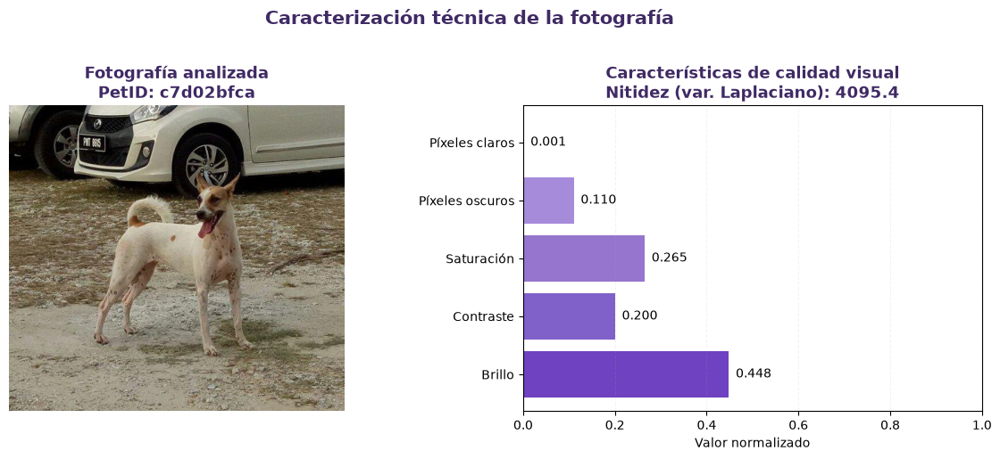

Figura guardada en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\figures\calidad_visual_ejemplo.png


In [86]:
# Representación de las características de calidad visual

with Image.open(
    ruta_calidad_ejemplo
) as imagen:
    imagen_calidad_display = (
        imagen.convert("RGB")
    )

metricas_normalizadas = {
    "Brillo": caracteristicas_calidad_ejemplo[
        "brillo"
    ],
    "Contraste": caracteristicas_calidad_ejemplo[
        "contraste"
    ],
    "Saturación": caracteristicas_calidad_ejemplo[
        "saturacion"
    ],
    "Píxeles oscuros": caracteristicas_calidad_ejemplo[
        "pct_pixeles_oscuros"
    ],
    "Píxeles claros": caracteristicas_calidad_ejemplo[
        "pct_pixeles_claros"
    ]
}

fig, axes = plt.subplots(
    1,
    2,
    figsize=(12, 5)
)

# Fotografía
axes[0].imshow(
    imagen_calidad_display
)

axes[0].set_title(
    f"Fotografía analizada\nPetID: {petid_calidad_ejemplo}",
    fontsize=13,
    fontweight="bold",
    color="#3F2A64"
)

axes[0].axis("off")


# Métricas normalizadas
nombres_metricas = list(
    metricas_normalizadas.keys()
)

valores_metricas = list(
    metricas_normalizadas.values()
)

axes[1].barh(
    nombres_metricas,
    valores_metricas,
    color=[
        "#6F42C1",
        "#8060C9",
        "#9575CD",
        "#A78BDB",
        "#B39DDB"
    ]
)

axes[1].set_xlim(
    0,
    1
)

axes[1].set_xlabel(
    "Valor normalizado"
)

axes[1].set_title(
    (
        "Características de calidad visual\n"
        f"Nitidez (var. Laplaciano): "
        f"{caracteristicas_calidad_ejemplo['nitidez']:.1f}"
    ),
    fontsize=13,
    fontweight="bold",
    color="#3F2A64"
)

axes[1].grid(
    axis="x",
    linestyle="--",
    alpha=0.15
)

for i, valor in enumerate(
    valores_metricas
):
    axes[1].text(
        valor + 0.015,
        i,
        f"{valor:.3f}",
        va="center",
        fontsize=10
    )


fig.suptitle(
    "Caracterización técnica de la fotografía",
    fontsize=15,
    fontweight="bold",
    color="#3F2A64",
    y=1.02
)

fig.tight_layout()

fig_path_calidad_ejemplo = (
    figures_path
    / "calidad_visual_ejemplo.png"
)

fig.savefig(
    fig_path_calidad_ejemplo,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("Figura guardada en:")
print(fig_path_calidad_ejemplo)

### 14.3. Extracción automática de características de calidad visual

Una vez comprobado el cálculo sobre una fotografía individual, las características de calidad se extraen de forma homogénea para el conjunto visual completo de PetFinder.

Para cada fotografía se calculan el brillo, el contraste, la nitidez, la saturación y las proporciones de píxeles extremadamente oscuros y claros. Estas características se obtienen directamente a partir de la imagen original y sin utilizar información sobre la variable objetivo.

Los resultados se almacenan para su posterior comparación entre perros con adopción lenta y no lenta y para analizar si determinados aspectos técnicos de las fotografías presentan alguna asociación con la velocidad de adopción.

In [87]:
# Extracción de características de calidad visual
# sobre el conjunto completo de fotografías

import time

inicio_calidad = time.perf_counter()

resultados_calidad = []

n_total_calidad = len(
    petfinder_visual_model_df
)

for i, fila in enumerate(
    petfinder_visual_model_df[
        [
            "PetID",
            "ruta_imagen_principal"
        ]
    ].itertuples(index=False),
    start=1
):

    caracteristicas = extraer_calidad_imagen(
        fila.ruta_imagen_principal
    )

    resultados_calidad.append({
        "PetID": fila.PetID,
        **caracteristicas
    })

    if (
        i % 500 == 0
        or i == n_total_calidad
    ):
        print(
            f"Fotografías procesadas: "
            f"{i}/{n_total_calidad}"
        )


caracteristicas_calidad_df = pd.DataFrame(
    resultados_calidad
)

tiempo_calidad = (
    time.perf_counter()
    - inicio_calidad
)


# Comprobación de valores válidos

variables_calidad = [
    "brillo",
    "contraste",
    "nitidez",
    "saturacion",
    "pct_pixeles_oscuros",
    "pct_pixeles_claros"
]

n_fotografias_validas_calidad = (
    caracteristicas_calidad_df[
        variables_calidad
    ]
    .notna()
    .all(axis=1)
    .sum()
)

n_fotografias_no_validas_calidad = (
    len(caracteristicas_calidad_df)
    - n_fotografias_validas_calidad
)

cobertura_calidad = (
    n_fotografias_validas_calidad
    / len(caracteristicas_calidad_df)
    * 100
)


# Comprobación de PetID duplicados

n_duplicados_calidad = (
    caracteristicas_calidad_df[
        "PetID"
    ]
    .duplicated()
    .sum()
)


# Guardado

calidad_features_path = (
    visual_outputs_path
    / "petfinder_calidad_visual.csv"
)

caracteristicas_calidad_df.to_csv(
    calidad_features_path,
    index=False,
    encoding="utf-8-sig"
)


print("\nExtracción completada.")

print("\nTiempo total:")
print(
    f"{tiempo_calidad / 60:.2f} minutos"
)

print("\nFotografías analizadas:")
print(
    len(caracteristicas_calidad_df)
)

print("\nFotografías con características válidas:")
print(
    n_fotografias_validas_calidad
)

print("\nFotografías sin características válidas:")
print(
    n_fotografias_no_validas_calidad
)

print("\nCobertura:")
print(
    f"{cobertura_calidad:.2f}%"
)

print("\nPetID duplicados:")
print(
    n_duplicados_calidad
)

print("\nResultados guardados en:")
print(
    calidad_features_path
)

print("\nPrimeras filas:")

display(
    caracteristicas_calidad_df
    .head()
    .round(4)
)

Fotografías procesadas: 500/7938
Fotografías procesadas: 1000/7938
Fotografías procesadas: 1500/7938
Fotografías procesadas: 2000/7938
Fotografías procesadas: 2500/7938
Fotografías procesadas: 3000/7938
Fotografías procesadas: 3500/7938
Fotografías procesadas: 4000/7938
Fotografías procesadas: 4500/7938
Fotografías procesadas: 5000/7938
Fotografías procesadas: 5500/7938
Fotografías procesadas: 6000/7938
Fotografías procesadas: 6500/7938
Fotografías procesadas: 7000/7938
Fotografías procesadas: 7500/7938
Fotografías procesadas: 7938/7938

Extracción completada.

Tiempo total:
1.67 minutos

Fotografías analizadas:
7938

Fotografías con características válidas:
7938

Fotografías sin características válidas:
0

Cobertura:
100.00%

PetID duplicados:
0

Resultados guardados en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\petfinder_visual\petfinder_calidad_visual.csv

Primeras filas:


,PetID,brillo,contraste,nitidez,saturacion,pct_pixeles_oscuros,pct_pixeles_claros
0,3422e4906,0.6692,0.1942,60.5198,0.0742,0.0007,0.0436
1,5842f1ff5,0.3074,0.2463,502.3038,0.4023,0.2988,0.0169
2,850a43f90,0.6500,0.3014,363.9788,0.3066,0.1126,0.1170
3,97aa9eeac,0.5621,0.1774,24.1706,0.0910,0.0240,0.0026
4,8b693ca84,0.3374,0.1514,451.5090,0.3084,0.0740,0.0000


### 14.4. Comparación de la calidad visual según la adopción

Una vez extraídas las características técnicas de las fotografías, se analiza si existen diferencias entre los perros con adopción lenta y no lenta.

Para mantener separado el conjunto de test durante esta fase exploratoria, las comparaciones se realizan inicialmente sobre los conjuntos de entrenamiento y validación. Se estudian el brillo, el contraste, la nitidez, la saturación y la presencia de zonas extremadamente oscuras o claras.

Estas variables permiten evaluar si determinados aspectos de calidad fotográfica presentan patrones diferentes según la velocidad de adopción.

In [88]:
# Incorporación de las características de calidad al dataset visual

petfinder_visual_calidad_df = (
    petfinder_visual_model_df
    .merge(
        caracteristicas_calidad_df,
        on="PetID",
        how="left",
        validate="one_to_one"
    )
)

# Conjunto de desarrollo: train + valid
calidad_dev_df = (
    petfinder_visual_calidad_df.loc[
        petfinder_visual_calidad_df[
            "conjunto_petfinder"
        ].isin(
            ["train", "valid"]
        )
    ]
    .copy()
)


variables_calidad = [
    "brillo",
    "contraste",
    "nitidez",
    "saturacion",
    "pct_pixeles_oscuros",
    "pct_pixeles_claros"
]


print("Dimensiones del dataset enriquecido:")
print(
    petfinder_visual_calidad_df.shape
)

print("\nPerros incluidos en desarrollo:")
print(
    len(calidad_dev_df)
)

print("\nValores ausentes en las características de calidad:")

display(
    calidad_dev_df[
        variables_calidad
    ]
    .isna()
    .sum()
    .to_frame(
        name="n_ausentes"
    )
)


print("\nResumen de características según la adopción:")

resumen_calidad_clase = (
    calidad_dev_df
    .groupby(
        "target_adopcion_lenta"
    )[
        variables_calidad
    ]
    .agg(
        ["mean", "median"]
    )
)

display(
    resumen_calidad_clase.round(4)
)

Dimensiones del dataset enriquecido:
(7938, 16)

Perros incluidos en desarrollo:
6346

Valores ausentes en las características de calidad:


,n_ausentes
brillo,0
contraste,0
nitidez,0
saturacion,0
pct_pixeles_oscuros,0
pct_pixeles_claros,0



Resumen de características según la adopción:


brillo         contraste            nitidez           saturacion         pct_pixeles_oscuros         pct_pixeles_claros        
                         mean  median      mean  median       mean    median       mean  median                mean  median               mean  median
target_adopcion_lenta                                                                                                                                 
0                      0.4813  0.4814    0.2302  0.2293  1219.6670  614.8344     0.2467  0.2294              0.0904  0.0595             0.0712  0.0358
1                      0.4793  0.4778    0.2282  0.2275  1435.4928  769.3600     0.2485  0.2274              0.0868  0.0575             0.0669  0.0355

### 14.5. Evaluación estadística de las características de calidad visual

Las diferencias descriptivas observadas se complementan mediante pruebas estadísticas y medidas de tamaño de efecto.

Dado que varias de las características, especialmente la nitidez, presentan distribuciones potencialmente asimétricas, se utiliza la prueba no paramétrica de Mann-Whitney para comparar los grupos de adopción lenta y no lenta.

La significación estadística se interpreta conjuntamente con la correlación biserial de rangos como medida de tamaño de efecto. Este enfoque permite distinguir entre diferencias estadísticamente detectables y diferencias con una magnitud suficiente para resultar relevantes desde un punto de vista práctico.

Para limitar el riesgo de falsos positivos derivado de las comparaciones múltiples, se aplica además un ajuste de Benjamini-Hochberg sobre los valores *p*. La significación ajustada se interpreta siempre junto con el tamaño de efecto.


In [89]:
# Pruebas estadísticas de las características de calidad visual

from scipy.stats import mannwhitneyu


def ajustar_p_benjamini_hochberg(p_values):
    """Ajuste Benjamini-Hochberg sin dependencias adicionales."""
    p_values = np.asarray(
        p_values,
        dtype=float
    )

    n = len(p_values)

    orden = np.argsort(
        p_values
    )

    p_ordenados = p_values[
        orden
    ]

    ajustados_ordenados = (
        p_ordenados
        * n
        / np.arange(
            1,
            n + 1
        )
    )

    ajustados_ordenados = np.minimum.accumulate(
        ajustados_ordenados[::-1]
    )[::-1]

    ajustados_ordenados = np.clip(
        ajustados_ordenados,
        0,
        1
    )

    ajustados = np.empty_like(
        ajustados_ordenados
    )

    ajustados[
        orden
    ] = ajustados_ordenados

    return ajustados



def rank_biserial_from_u(
    u_stat,
    n1,
    n2
):
    return (
        2 * u_stat / (n1 * n2)
        - 1
    )


resultados_estadisticos_calidad = []

for variable in variables_calidad:

    valores_no_lenta = (
        calidad_dev_df.loc[
            calidad_dev_df[
                "target_adopcion_lenta"
            ] == 0,
            variable
        ]
        .dropna()
        .to_numpy()
    )

    valores_lenta = (
        calidad_dev_df.loc[
            calidad_dev_df[
                "target_adopcion_lenta"
            ] == 1,
            variable
        ]
        .dropna()
        .to_numpy()
    )

    u_stat, p_value = mannwhitneyu(
        valores_lenta,
        valores_no_lenta,
        alternative="two-sided"
    )

    tamano_efecto = rank_biserial_from_u(
        u_stat,
        len(valores_lenta),
        len(valores_no_lenta)
    )

    resultados_estadisticos_calidad.append({
        "variable": variable,
        "media_no_lenta": np.mean(
            valores_no_lenta
        ),
        "media_lenta": np.mean(
            valores_lenta
        ),
        "mediana_no_lenta": np.median(
            valores_no_lenta
        ),
        "mediana_lenta": np.median(
            valores_lenta
        ),
        "p_value": p_value,
        "tamano_efecto": tamano_efecto
    })


resultados_estadisticos_calidad = pd.DataFrame(
    resultados_estadisticos_calidad
)

resultados_estadisticos_calidad[
    "p_value_fdr"
] = ajustar_p_benjamini_hochberg(
    resultados_estadisticos_calidad[
        "p_value"
    ].to_numpy()
)

resultados_estadisticos_calidad[
    "significativo_fdr_0_05"
] = (
    resultados_estadisticos_calidad[
        "p_value_fdr"
    ] < 0.05
)

print(
    "Comparación estadística de las características de calidad:"
)

display(
    resultados_estadisticos_calidad.round(5)
)

Comparación estadística de las características de calidad:


,variable,media_no_lenta,media_lenta,mediana_no_lenta,mediana_lenta,p_value,tamano_efecto,p_value_fdr,significativo_fdr_0_05
0,brillo,0.48128,0.47931,0.48136,0.47776,0.26970,-0.01604,0.40456,False
1,contraste,0.23022,0.22821,0.22927,0.22753,0.07635,-0.02575,0.19018,False
2,nitidez,1219.66703,1435.49278,614.83443,769.36002,0.00000,0.11448,0.00000,True
3,saturacion,0.24669,0.24853,0.22936,0.22738,0.89604,0.00190,0.89604,False
4,pct_pixeles_oscuros,0.09042,0.08679,0.05953,0.05747,0.09509,-0.02425,0.19018,False
5,pct_pixeles_claros,0.07124,0.06692,0.03582,0.03550,0.70273,0.00554,0.84328,False


### 14.6. Distribución de la nitidez según la adopción

Entre las características técnicas analizadas, la nitidez es la variable que presenta la diferencia más clara entre ambos grupos.

Las fotografías correspondientes a perros con adopción lenta muestran valores superiores de varianza del Laplaciano, aunque el tamaño de efecto obtenido es reducido. Por tanto, esta diferencia representa una asociación de magnitud limitada y no permite afirmar que una mayor nitidez favorezca o dificulte la adopción.

Además, la varianza del Laplaciano debe interpretarse como una aproximación al nivel de detalle de la imagen, ya que valores elevados también pueden estar influidos por la textura o el ruido presente en la fotografía.

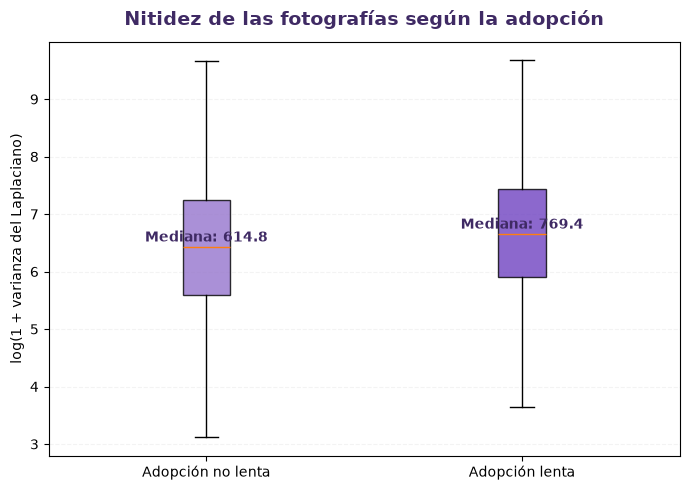

Figura guardada en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\figures\calidad_nitidez_adopcion.png


In [90]:
# Comparación de la nitidez según la adopción

nitidez_no_lenta = (
    calidad_dev_df.loc[
        calidad_dev_df[
            "target_adopcion_lenta"
        ] == 0,
        "nitidez"
    ]
    .dropna()
)

nitidez_lenta = (
    calidad_dev_df.loc[
        calidad_dev_df[
            "target_adopcion_lenta"
        ] == 1,
        "nitidez"
    ]
    .dropna()
)

# Transformación logarítmica únicamente para la representación
nitidez_log_no_lenta = np.log1p(
    nitidez_no_lenta
)

nitidez_log_lenta = np.log1p(
    nitidez_lenta
)

fig, ax = plt.subplots(
    figsize=(7, 5)
)

box = ax.boxplot(
    [
        nitidez_log_no_lenta,
        nitidez_log_lenta
    ],
    patch_artist=True,
    showfliers=False
)

for parche, color in zip(
    box["boxes"],
    [
        "#9575CD",
        "#6F42C1"
    ]
):
    parche.set_facecolor(color)
    parche.set_alpha(0.80)

ax.set_xticks(
    [1, 2]
)

ax.set_xticklabels(
    [
        "Adopción no lenta",
        "Adopción lenta"
    ]
)

ax.set_title(
    "Nitidez de las fotografías según la adopción",
    fontsize=14,
    fontweight="bold",
    color="#3F2A64",
    pad=12
)

ax.set_ylabel(
    "log(1 + varianza del Laplaciano)"
)

ax.grid(
    axis="y",
    linestyle="--",
    alpha=0.15
)

# Medianas originales para facilitar la interpretación
ax.text(
    1,
    np.median(nitidez_log_no_lenta) + 0.10,
    f"Mediana: {np.median(nitidez_no_lenta):.1f}",
    ha="center",
    fontsize=10,
    fontweight="bold",
    color="#3F2A64"
)

ax.text(
    2,
    np.median(nitidez_log_lenta) + 0.10,
    f"Mediana: {np.median(nitidez_lenta):.1f}",
    ha="center",
    fontsize=10,
    fontweight="bold",
    color="#3F2A64"
)

fig.tight_layout()

fig_path_nitidez = (
    figures_path
    / "calidad_nitidez_adopcion.png"
)

fig.savefig(
    fig_path_nitidez,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("Figura guardada en:")
print(fig_path_nitidez)

### 14.7. Síntesis del análisis de calidad visual

El análisis de las características técnicas de las fotografías muestra que la mayoría de las variables presentan distribuciones muy similares entre perros con adopción lenta y no lenta.

No se observan diferencias relevantes en brillo, contraste, saturación ni en la proporción de píxeles extremadamente oscuros o claros. La nitidez es la única característica que presenta una diferencia estadísticamente significativa con un tamaño de efecto superior al del resto de variables, aunque su magnitud continúa siendo reducida.

Las fotografías correspondientes a perros con adopción lenta presentan una mayor mediana de varianza del Laplaciano, lo que indica un mayor nivel de detalle visual según esta medida. Este resultado no permite interpretar dichas fotografías como de mayor calidad de forma general, ya que la varianza del Laplaciano también puede verse influida por la textura y el ruido de la imagen.

En conjunto, las características técnicas básicas de la fotografía no parecen constituir por sí solas una explicación relevante de la adopción lenta. Su contribución debe considerarse complementaria a otras señales relacionadas con el contenido, la composición y la presentación visual del perro.

## 15. Representaciones visuales avanzadas con CLIP y DINOv2

Los análisis anteriores caracterizan las fotografías mediante variables explícitas relacionadas con el contenido visual, el encuadre, la segmentación y la calidad técnica. Sin embargo, estas características representan únicamente una parte de la información presente en una imagen.

Para estudiar patrones visuales de mayor complejidad se incorporan representaciones obtenidas mediante modelos preentrenados de visión. En particular, se utilizan CLIP y DINOv2 para transformar cada fotografía en un vector numérico de características o *embedding*.

CLIP proporciona una representación visual aprendida conjuntamente con información textual, mientras que DINOv2 obtiene representaciones visuales mediante aprendizaje autosupervisado. Ambos enfoques permiten describir similitudes entre fotografías sin definir previamente qué características concretas deben buscarse.

Los embeddings se utilizan para analizar la estructura del espacio visual de PetFinder y evaluar posteriormente si contienen información relacionada con la adopción lenta. Los modelos preentrenados se mantienen congelados y se utilizan exclusivamente como extractores de características.

### 15.1. Preparación de los modelos de representación visual

Se seleccionan dos modelos preentrenados con enfoques complementarios. CLIP permite obtener representaciones visuales alineadas con conceptos semánticos, mientras que DINOv2 genera características visuales mediante aprendizaje autosupervisado.

En ambos casos se utilizan versiones de tamaño moderado, compatibles con los recursos computacionales disponibles. Los modelos permanecen completamente congelados y no se realiza ningún ajuste de sus pesos durante la extracción de características.

Para reducir el consumo de memoria de la GPU, los modelos se procesarán de forma independiente.

In [91]:
# Comprobación del entorno para CLIP y DINOv2

import importlib.util

transformers_disponible = (
    importlib.util.find_spec("transformers")
    is not None
)

print("Transformers disponible:")
print(transformers_disponible)

if transformers_disponible:
    import transformers

    print("\nVersión de Transformers:")
    print(transformers.__version__)

print("\nPyTorch disponible:")
print(torch.__version__)

print("\nGPU disponible:")
print(torch.cuda.is_available())

if torch.cuda.is_available():

    print("\nGPU utilizada:")
    print(
        torch.cuda.get_device_name(0)
    )

    print("\nMemoria total de la GPU:")
    print(
        f"{torch.cuda.get_device_properties(0).total_memory / 1024**3:.2f} GB"
    )

Transformers disponible:
True


c:\Users\isaa-\venvs\invisible-dogs-dl\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm



Versión de Transformers:
5.15.1

PyTorch disponible:
2.7.1+cu118

GPU disponible:
True

GPU utilizada:
NVIDIA GeForce GTX 1650

Memoria total de la GPU:
4.00 GB


### 15.2. Extracción de representaciones visuales con CLIP

CLIP permite transformar cada fotografía en una representación numérica que resume información visual de alto nivel aprendida conjuntamente a partir de imágenes y lenguaje.

En este análisis se utiliza exclusivamente el codificador visual preentrenado, sin realizar ningún ajuste adicional de sus pesos. Para cada fotografía se obtiene un *embedding* de dimensión fija que posteriormente podrá utilizarse para estudiar similitudes entre imágenes, explorar la estructura del espacio visual y evaluar la presencia de información relacionada con la adopción lenta.

In [92]:
# Preparación de CLIP como extractor de características visuales

from transformers import (
    CLIPProcessor,
    CLIPVisionModelWithProjection
)

CLIP_MODEL_ID = (
    "openai/clip-vit-base-patch32"
)

print("Cargando procesador CLIP...")

processor_clip = (
    CLIPProcessor.from_pretrained(
        CLIP_MODEL_ID
    )
)

print("Cargando modelo CLIP...")

modelo_clip = (
    CLIPVisionModelWithProjection
    .from_pretrained(
        CLIP_MODEL_ID,
        dtype=torch.float16
    )
    .to(device)
    .eval()
)

print("\nModelo CLIP cargado correctamente.")

print("\nModelo:")
print(CLIP_MODEL_ID)

print("\nDispositivo:")
print(
    next(modelo_clip.parameters()).device
)

print("\nPrecisión:")
print(
    next(modelo_clip.parameters()).dtype
)

if torch.cuda.is_available():

    memoria_libre, memoria_total = (
        torch.cuda.mem_get_info()
    )

    print("\nMemoria GPU disponible tras la carga:")
    print(
        f"{memoria_libre / 1024**3:.2f} GB "
        f"de {memoria_total / 1024**3:.2f} GB"
    )

Cargando procesador CLIP...


Cargando modelo CLIP...


Loading weights: 100%|██████████| 200/200 [00:00<00:00, 563.26it/s]
[transformers] CLIPVisionModelWithProjection LOAD REPORT from: openai/clip-vit-base-patch32
Key                                                          | Status     |  | 
-------------------------------------------------------------+------------+--+-
text_model.encoder.layers.{0...11}.self_attn.q_proj.bias     | UNEXPECTED |  | 
text_model.encoder.layers.{0...11}.self_attn.v_proj.weight   | UNEXPECTED |  | 
text_model.encoder.layers.{0...11}.self_attn.out_proj.bias   | UNEXPECTED |  | 
text_model.encoder.layers.{0...11}.self_attn.v_proj.bias     | UNEXPECTED |  | 
text_model.encoder.layers.{0...11}.mlp.fc1.bias              | UNEXPECTED |  | 
text_model.encoder.layers.{0...11}.self_attn.out_proj.weight | UNEXPECTED |  | 
text_model.encoder.layers.{0...11}.mlp.fc1.weight            | UNEXPECTED |  | 
text_model.encoder.layers.{0...11}.mlp.fc2.weight            | UNEXPECTED |  | 
text_model.encoder.layers.{0...11}.layer


Modelo CLIP cargado correctamente.

Modelo:
openai/clip-vit-base-patch32

Dispositivo:
cuda:0

Precisión:
torch.float16

Memoria GPU disponible tras la carga:
0.46 GB de 4.00 GB


In [93]:
# Comprobación de la extracción de embeddings con CLIP

petid_clip_ejemplo = "c7d02bfca"

ejemplo_clip = (
    petfinder_visual_model_df.loc[
        petfinder_visual_model_df["PetID"]
        == petid_clip_ejemplo
    ]
)

if ejemplo_clip.empty:
    raise ValueError(
        f"No se ha encontrado el PetID {petid_clip_ejemplo}."
    )

ejemplo_clip = ejemplo_clip.iloc[0]

ruta_clip_ejemplo = (
    ejemplo_clip[
        "ruta_imagen_principal"
    ]
)


# Carga de la fotografía

with Image.open(
    ruta_clip_ejemplo
) as imagen:
    imagen_clip = imagen.convert("RGB")


# Preprocesamiento específico de CLIP

inputs_clip = processor_clip(
    images=imagen_clip,
    return_tensors="pt"
)

inputs_clip = {
    clave: (
        valor
        .to(device)
        .to(torch.float16)
        if torch.is_floating_point(valor)
        else valor.to(device)
    )
    for clave, valor
    in inputs_clip.items()
}


# Extracción del embedding

with torch.no_grad():

    salida_clip = modelo_clip(
        **inputs_clip
    )

embedding_clip = (
    salida_clip.image_embeds
    .squeeze(0)
    .float()
    .cpu()
    .numpy()
)


# Normalización L2

norma_clip_original = np.linalg.norm(
    embedding_clip
)

embedding_clip_norm = (
    embedding_clip
    / (
        norma_clip_original
        + 1e-12
    )
)

norma_clip_normalizado = np.linalg.norm(
    embedding_clip_norm
)


# Comprobaciones

print("PetID analizado:")
print(petid_clip_ejemplo)

print("\nDimensiones del embedding CLIP:")
print(
    embedding_clip.shape
)

print("\nNúmero de componentes:")
print(
    embedding_clip.size
)

print("\n¿Contiene valores NaN?:")
print(
    np.isnan(
        embedding_clip
    ).any()
)

print("\n¿Contiene valores infinitos?:")
print(
    np.isinf(
        embedding_clip
    ).any()
)

print("\nNorma L2 antes de normalizar:")
print(
    f"{norma_clip_original:.4f}"
)

print("\nNorma L2 después de normalizar:")
print(
    f"{norma_clip_normalizado:.4f}"
)

print("\nPrimeras 10 componentes del embedding normalizado:")
print(
    np.round(
        embedding_clip_norm[:10],
        4
    )
)

PetID analizado:
c7d02bfca

Dimensiones del embedding CLIP:
(512,)

Número de componentes:
512

¿Contiene valores NaN?:
False

¿Contiene valores infinitos?:
False

Norma L2 antes de normalizar:
11.0116

Norma L2 después de normalizar:
1.0000

Primeras 10 componentes del embedding normalizado:
[ 0.0544  0.0251  0.0232  0.0399  0.0216 -0.0266  0.0354 -0.0424  0.026
  0.0164]


### 15.3. Optimización de la extracción de embeddings

Antes de extraer las representaciones de todo el conjunto visual, se evalúa el tamaño de lote más adecuado para el hardware disponible.

A diferencia de la segmentación, el preprocesamiento de CLIP transforma todas las fotografías a unas dimensiones comunes, lo que permite procesar varias imágenes simultáneamente de forma eficiente en GPU.

La comparación se realiza sobre una muestra fija de fotografías y se selecciona el tamaño de lote que reduzca el tiempo de inferencia sin superar la memoria disponible.

In [94]:
# Comparación de tamaños de lote para la extracción con CLIP

import time
import gc
import torch.nn.functional as F

N_MUESTRA_CLIP = 100

BATCH_SIZES_CLIP = [
    1,
    4,
    8,
    16,
    32
]

muestra_clip = (
    petfinder_visual_model_df
    .sample(
        n=N_MUESTRA_CLIP,
        random_state=RANDOM_STATE
    )
    .reset_index(drop=True)
)


def extraer_embeddings_clip_batch(
    dataframe,
    batch_size
):
    embeddings = []

    inicio = time.perf_counter()

    for inicio_batch in range(
        0,
        len(dataframe),
        batch_size
    ):

        fin_batch = min(
            inicio_batch + batch_size,
            len(dataframe)
        )

        batch_df = dataframe.iloc[
            inicio_batch:fin_batch
        ]

        imagenes = []

        for ruta in batch_df[
            "ruta_imagen_principal"
        ]:

            with Image.open(ruta) as imagen:
                imagenes.append(
                    imagen.convert("RGB").copy()
                )

        inputs = processor_clip(
            images=imagenes,
            return_tensors="pt"
        )

        pixel_values = (
            inputs["pixel_values"]
            .to(
                device=device,
                dtype=torch.float16
            )
        )

        with torch.no_grad():

            salida = modelo_clip(
                pixel_values=pixel_values
            )

            embeddings_batch = (
                salida.image_embeds
            )

            # Normalización L2
            embeddings_batch = F.normalize(
                embeddings_batch,
                p=2,
                dim=1
            )

        embeddings.append(
            embeddings_batch
            .float()
            .cpu()
            .numpy()
        )

        del pixel_values
        del salida
        del embeddings_batch
        del inputs
        del imagenes

    tiempo = (
        time.perf_counter()
        - inicio
    )

    embeddings = np.vstack(
        embeddings
    )

    return (
        embeddings,
        tiempo
    )


resultados_batch_clip = []

for batch_size in BATCH_SIZES_CLIP:

    print(
        f"\nProbando batch size = "
        f"{batch_size}..."
    )

    gc.collect()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.reset_peak_memory_stats()

    try:

        embeddings_prueba, tiempo_prueba = (
            extraer_embeddings_clip_batch(
                dataframe=muestra_clip,
                batch_size=batch_size
            )
        )

        memoria_maxima = (
            torch.cuda.max_memory_allocated()
            / 1024**3
            if torch.cuda.is_available()
            else np.nan
        )

        tiempo_por_imagen = (
            tiempo_prueba
            / N_MUESTRA_CLIP
        )

        tiempo_estimado_total = (
            tiempo_por_imagen
            * len(petfinder_visual_model_df)
            / 60
        )

        resultados_batch_clip.append({
            "batch_size": batch_size,
            "estado": "OK",
            "tiempo_100_s": tiempo_prueba,
            "tiempo_por_imagen_s": tiempo_por_imagen,
            "estimacion_total_min": tiempo_estimado_total,
            "memoria_maxima_gpu_gb": memoria_maxima
        })

        print(
            f"Tiempo: {tiempo_prueba:.2f} s"
        )

        print(
            f"Estimación total: "
            f"{tiempo_estimado_total:.2f} min"
        )

        print(
            f"Memoria GPU máxima: "
            f"{memoria_maxima:.2f} GB"
        )

        del embeddings_prueba

    except RuntimeError as error:

        if "out of memory" in str(error).lower():

            resultados_batch_clip.append({
                "batch_size": batch_size,
                "estado": "CUDA OOM",
                "tiempo_100_s": np.nan,
                "tiempo_por_imagen_s": np.nan,
                "estimacion_total_min": np.nan,
                "memoria_maxima_gpu_gb": np.nan
            })

            print(
                "Memoria GPU insuficiente."
            )

            if torch.cuda.is_available():
                torch.cuda.empty_cache()

        else:
            raise error


resultados_batch_clip_df = pd.DataFrame(
    resultados_batch_clip
)

print(
    "\nComparación de tamaños de lote:"
)

display(
    resultados_batch_clip_df.round(3)
)


Probando batch size = 1...
Tiempo: 5.64 s
Estimación total: 7.46 min
Memoria GPU máxima: 0.42 GB

Probando batch size = 4...
Tiempo: 4.86 s
Estimación total: 6.43 min
Memoria GPU máxima: 0.43 GB

Probando batch size = 8...
Tiempo: 4.45 s
Estimación total: 5.88 min
Memoria GPU máxima: 0.43 GB

Probando batch size = 16...
Tiempo: 4.03 s
Estimación total: 5.33 min
Memoria GPU máxima: 0.44 GB

Probando batch size = 32...
Tiempo: 3.86 s
Estimación total: 5.10 min
Memoria GPU máxima: 0.46 GB

Comparación de tamaños de lote:


,batch_size,estado,tiempo_100_s,tiempo_por_imagen_s,estimacion_total_min,memoria_maxima_gpu_gb
0,1,OK,5.641,0.056,7.463,0.424
1,4,OK,4.863,0.049,6.434,0.427
2,8,OK,4.446,0.044,5.882,0.431
3,16,OK,4.029,0.040,5.331,0.442
4,32,OK,3.856,0.039,5.102,0.465


### 15.4. Extracción completa de embeddings CLIP

Tras evaluar diferentes tamaños de lote, se selecciona un tamaño de 32 imágenes por ofrecer el menor tiempo de procesamiento entre las configuraciones probadas sin alcanzar los límites de memoria disponibles.

A continuación, CLIP se aplica al conjunto visual completo de PetFinder. Para cada fotografía se obtiene un embedding visual de 512 componentes, que se normaliza mediante norma L2 para facilitar posteriormente el análisis de similitud y el entrenamiento de modelos sobre estas representaciones.

Los embeddings se almacenan junto con el identificador de cada perro para garantizar su correspondencia con el resto de fuentes de información del proyecto.

Los embeddings se guardan en disco y, salvo que se fuerce el recálculo desde la configuración inicial, se reutilizan automáticamente en ejecuciones posteriores.


In [95]:
# Extracción completa o carga de embeddings CLIP

import time
import torch.nn.functional as F

BATCH_SIZE_CLIP = 32

clip_embeddings_path = (
    visual_outputs_path
    / "petfinder_clip_embeddings.npz"
)

usar_cache_clip = (
    clip_embeddings_path.exists()
    and not RECALCULAR_ARTEFACTOS
)

if usar_cache_clip:

    datos_clip = np.load(
        clip_embeddings_path,
        allow_pickle=False
    )

    petids_clip = datos_clip[
        "PetID"
    ].astype(str)

    embeddings_clip = datos_clip[
        "embeddings"
    ].astype(np.float32)

    tiempo_clip_total = np.nan

    print(
        "Embeddings CLIP cargados desde el archivo existente."
    )

else:

    inicio_clip_total = time.perf_counter()

    embeddings_clip_lista = []
    petids_clip = []

    n_total_clip = len(
        petfinder_visual_model_df
    )

    modelo_clip.eval()

    for inicio_batch in range(
        0,
        n_total_clip,
        BATCH_SIZE_CLIP
    ):

        fin_batch = min(
            inicio_batch + BATCH_SIZE_CLIP,
            n_total_clip
        )

        batch_df = (
            petfinder_visual_model_df
            .iloc[inicio_batch:fin_batch]
        )

        imagenes = []

        for ruta in batch_df[
            "ruta_imagen_principal"
        ]:

            with Image.open(ruta) as imagen:
                imagenes.append(
                    imagen.convert("RGB").copy()
                )

        inputs_clip = processor_clip(
            images=imagenes,
            return_tensors="pt"
        )

        pixel_values = (
            inputs_clip[
                "pixel_values"
            ]
            .to(
                device=device,
                dtype=torch.float16
            )
        )

        with torch.no_grad():

            salida_clip = modelo_clip(
                pixel_values=pixel_values
            )

            embeddings_batch = (
                salida_clip.image_embeds
            )

            embeddings_batch = F.normalize(
                embeddings_batch,
                p=2,
                dim=1
            )

        embeddings_clip_lista.append(
            embeddings_batch
            .float()
            .cpu()
            .numpy()
        )

        petids_clip.extend(
            batch_df[
                "PetID"
            ]
            .astype(str)
            .tolist()
        )

        del pixel_values
        del salida_clip
        del embeddings_batch
        del inputs_clip
        del imagenes

        if (
            fin_batch % 500 < BATCH_SIZE_CLIP
            or fin_batch == n_total_clip
        ):
            print(
                f"Fotografías procesadas: "
                f"{fin_batch}/{n_total_clip}"
            )

    embeddings_clip = np.vstack(
        embeddings_clip_lista
    ).astype(np.float32)

    petids_clip = np.array(
        petids_clip,
        dtype=str
    )

    tiempo_clip_total = (
        time.perf_counter()
        - inicio_clip_total
    )

    np.savez_compressed(
        clip_embeddings_path,
        PetID=petids_clip,
        embeddings=embeddings_clip
    )

n_total_clip = len(
    petfinder_visual_model_df
)

if embeddings_clip.shape[0] != n_total_clip:
    raise ValueError(
        "El número de embeddings CLIP "
        "no coincide con el número de fotografías."
    )

if np.isnan(
    embeddings_clip
).any():
    raise ValueError(
        "Se han encontrado valores NaN "
        "en los embeddings CLIP."
    )

if np.isinf(
    embeddings_clip
).any():
    raise ValueError(
        "Se han encontrado valores infinitos "
        "en los embeddings CLIP."
    )

petids_esperados_clip = (
    petfinder_visual_model_df[
        "PetID"
    ]
    .astype(str)
    .to_numpy()
)

if not np.array_equal(
    petids_clip,
    petids_esperados_clip
):
    raise ValueError(
        "El orden de PetID de CLIP no coincide "
        "con el dataset visual actual."
    )

normas_clip = np.linalg.norm(
    embeddings_clip,
    axis=1
)

print("\nFotografías procesadas:")
print(
    embeddings_clip.shape[0]
)

print("\nDimensión de cada embedding:")
print(
    embeddings_clip.shape[1]
)

print("\nDimensiones de la matriz:")
print(
    embeddings_clip.shape
)

print("\n¿Contiene NaN?:")
print(
    np.isnan(
        embeddings_clip
    ).any()
)

print("\nNorma L2 media:")
print(
    f"{normas_clip.mean():.4f}"
)

if not np.isnan(tiempo_clip_total):
    print("\nTiempo total:")
    print(
        f"{tiempo_clip_total / 60:.2f} minutos"
    )

print("\nEmbeddings disponibles en:")
print(
    clip_embeddings_path
)

print("\nTamaño del archivo:")
print(
    f"{clip_embeddings_path.stat().st_size / 1024**2:.2f} MB"
)


Embeddings CLIP cargados desde el archivo existente.

Fotografías procesadas:
7938

Dimensión de cada embedding:
512

Dimensiones de la matriz:
(7938, 512)

¿Contiene NaN?:
False

Norma L2 media:
1.0000

Embeddings disponibles en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\petfinder_visual\petfinder_clip_embeddings.npz

Tamaño del archivo:
9.24 MB


In [96]:
# Comprobación final de los embeddings CLIP

print("Dimensiones de la matriz CLIP:")
print(embeddings_clip.shape)

print("\nFotografías representadas:")
print(len(petids_clip))

print("\nNúmero de componentes por fotografía:")
print(embeddings_clip.shape[1])

print("\n¿Contiene valores NaN?:")
print(np.isnan(embeddings_clip).any())

print("\n¿Contiene valores infinitos?:")
print(np.isinf(embeddings_clip).any())

normas_clip = np.linalg.norm(
    embeddings_clip,
    axis=1
)

print("\nNorma L2 media:")
print(f"{normas_clip.mean():.4f}")

print("\nNorma L2 mínima:")
print(f"{normas_clip.min():.4f}")

print("\nNorma L2 máxima:")
print(f"{normas_clip.max():.4f}")

print("\nPetID duplicados:")
print(
    pd.Series(petids_clip)
    .duplicated()
    .sum()
)

Dimensiones de la matriz CLIP:
(7938, 512)

Fotografías representadas:
7938

Número de componentes por fotografía:
512

¿Contiene valores NaN?:
False

¿Contiene valores infinitos?:
False

Norma L2 media:
1.0000

Norma L2 mínima:
0.9995

Norma L2 máxima:
1.0005

PetID duplicados:
0


### 15.5. Extracción de representaciones visuales con DINOv2

Como segunda aproximación a la representación visual de las fotografías se utiliza DINOv2, un modelo preentrenado mediante aprendizaje autosupervisado.

A diferencia de CLIP, cuyo espacio de representación se aprende conjuntamente a partir de información visual y textual, DINOv2 obtiene características directamente de la estructura visual de las imágenes. Esta diferencia permite disponer de dos representaciones complementarias de una misma fotografía.

El modelo se mantiene completamente congelado y se utiliza únicamente como extractor de características. Para cada fotografía se obtiene un embedding visual de dimensión fija que posteriormente se analizará de forma conjunta con las representaciones generadas por CLIP.

In [97]:
# Liberación del modelo CLIP antes de cargar DINOv2

import gc

modelo_clip = modelo_clip.to("cpu")

gc.collect()

if torch.cuda.is_available():

    torch.cuda.empty_cache()

    memoria_libre, memoria_total = (
        torch.cuda.mem_get_info()
    )

    print("Memoria GPU disponible:")
    print(
        f"{memoria_libre / 1024**3:.2f} GB "
        f"de {memoria_total / 1024**3:.2f} GB"
    )

Memoria GPU disponible:
0.66 GB de 4.00 GB


### 15.6. Preparación del extractor DINOv2

Se utiliza la versión pequeña de DINOv2, adecuada para la extracción local de características con los recursos computacionales disponibles.

El modelo recibe cada fotografía después de aplicar su preprocesamiento específico y genera una representación visual que posteriormente se normaliza mediante norma L2, siguiendo el mismo criterio utilizado con CLIP.

In [98]:
# Preparación de DINOv2 como extractor de características visuales

from transformers import (
    AutoImageProcessor,
    AutoModel
)

DINOV2_MODEL_ID = (
    "facebook/dinov2-small"
)

print("Cargando procesador DINOv2...")

processor_dinov2 = (
    AutoImageProcessor.from_pretrained(
        DINOV2_MODEL_ID
    )
)

print("Cargando modelo DINOv2...")

modelo_dinov2 = (
    AutoModel.from_pretrained(
        DINOV2_MODEL_ID,
        dtype=torch.float16
    )
    .to(device)
    .eval()
)

print("\nModelo DINOv2 cargado correctamente.")

print("\nModelo:")
print(DINOV2_MODEL_ID)

print("\nDispositivo:")
print(
    next(modelo_dinov2.parameters()).device
)

print("\nPrecisión:")
print(
    next(modelo_dinov2.parameters()).dtype
)

if torch.cuda.is_available():

    memoria_libre, memoria_total = (
        torch.cuda.mem_get_info()
    )

    print("\nMemoria GPU disponible tras la carga:")
    print(
        f"{memoria_libre / 1024**3:.2f} GB "
        f"de {memoria_total / 1024**3:.2f} GB"
    )

Cargando procesador DINOv2...
Cargando modelo DINOv2...


Loading weights: 100%|██████████| 223/223 [00:00<00:00, 1903.71it/s]



Modelo DINOv2 cargado correctamente.

Modelo:
facebook/dinov2-small

Dispositivo:
cuda:0

Precisión:
torch.float16

Memoria GPU disponible tras la carga:
0.82 GB de 4.00 GB


In [99]:
# Comprobación de la extracción de embeddings con DINOv2

petid_dinov2_ejemplo = "c7d02bfca"

ejemplo_dinov2 = (
    petfinder_visual_model_df.loc[
        petfinder_visual_model_df["PetID"]
        == petid_dinov2_ejemplo
    ]
)

if ejemplo_dinov2.empty:
    raise ValueError(
        f"No se ha encontrado el PetID {petid_dinov2_ejemplo}."
    )

ejemplo_dinov2 = ejemplo_dinov2.iloc[0]

ruta_dinov2_ejemplo = (
    ejemplo_dinov2[
        "ruta_imagen_principal"
    ]
)


# Carga de la fotografía

with Image.open(
    ruta_dinov2_ejemplo
) as imagen:
    imagen_dinov2 = imagen.convert("RGB")


# Preprocesamiento específico de DINOv2

inputs_dinov2 = processor_dinov2(
    images=imagen_dinov2,
    return_tensors="pt"
)

pixel_values_dinov2 = (
    inputs_dinov2[
        "pixel_values"
    ]
    .to(
        device=device,
        dtype=torch.float16
    )
)


# Extracción del embedding

with torch.no_grad():

    salida_dinov2 = modelo_dinov2(
        pixel_values=pixel_values_dinov2
    )


# Token CLS como representación global
embedding_dinov2 = (
    salida_dinov2
    .last_hidden_state[:, 0, :]
    .squeeze(0)
    .float()
    .cpu()
    .numpy()
)


# Normalización L2

norma_dinov2_original = np.linalg.norm(
    embedding_dinov2
)

embedding_dinov2_norm = (
    embedding_dinov2
    / (
        norma_dinov2_original
        + 1e-12
    )
)

norma_dinov2_normalizado = np.linalg.norm(
    embedding_dinov2_norm
)


# Comprobaciones

print("PetID analizado:")
print(petid_dinov2_ejemplo)

print("\nDimensiones del embedding DINOv2:")
print(
    embedding_dinov2.shape
)

print("\nNúmero de componentes:")
print(
    embedding_dinov2.size
)

print("\n¿Contiene valores NaN?:")
print(
    np.isnan(
        embedding_dinov2
    ).any()
)

print("\n¿Contiene valores infinitos?:")
print(
    np.isinf(
        embedding_dinov2
    ).any()
)

print("\nNorma L2 antes de normalizar:")
print(
    f"{norma_dinov2_original:.4f}"
)

print("\nNorma L2 después de normalizar:")
print(
    f"{norma_dinov2_normalizado:.4f}"
)

print("\nPrimeras 10 componentes del embedding normalizado:")
print(
    np.round(
        embedding_dinov2_norm[:10],
        4
    )
)

PetID analizado:
c7d02bfca

Dimensiones del embedding DINOv2:
(384,)

Número de componentes:
384

¿Contiene valores NaN?:
False

¿Contiene valores infinitos?:
False

Norma L2 antes de normalizar:
48.1389

Norma L2 después de normalizar:
1.0000

Primeras 10 componentes del embedding normalizado:
[-0.053  -0.0505  0.0363 -0.002   0.0205 -0.0261  0.0468  0.0562  0.0689
 -0.0219]


### 15.7. Optimización de la extracción de embeddings DINOv2

Antes de aplicar DINOv2 al conjunto visual completo, se evalúan diferentes tamaños de lote sobre una muestra fija de fotografías.

El objetivo es seleccionar una configuración que reduzca el tiempo de inferencia manteniendo un uso de memoria compatible con el hardware disponible. Dado que todas las imágenes son transformadas a unas dimensiones comunes por el preprocesador de DINOv2, la inferencia por lotes permite aprovechar de forma eficiente la GPU.

In [100]:
# Comparación de tamaños de lote para la extracción con DINOv2

import time
import gc
import torch.nn.functional as F

N_MUESTRA_DINOV2 = 100

BATCH_SIZES_DINOV2 = [
    1,
    4,
    8,
    16,
    32,
    64
]

muestra_dinov2 = (
    petfinder_visual_model_df
    .sample(
        n=N_MUESTRA_DINOV2,
        random_state=RANDOM_STATE
    )
    .reset_index(drop=True)
)


def extraer_embeddings_dinov2_batch(
    dataframe,
    batch_size
):
    embeddings = []

    inicio = time.perf_counter()

    for inicio_batch in range(
        0,
        len(dataframe),
        batch_size
    ):

        fin_batch = min(
            inicio_batch + batch_size,
            len(dataframe)
        )

        batch_df = dataframe.iloc[
            inicio_batch:fin_batch
        ]

        imagenes = []

        for ruta in batch_df[
            "ruta_imagen_principal"
        ]:

            with Image.open(ruta) as imagen:
                imagenes.append(
                    imagen.convert("RGB").copy()
                )

        inputs = processor_dinov2(
            images=imagenes,
            return_tensors="pt"
        )

        pixel_values = (
            inputs["pixel_values"]
            .to(
                device=device,
                dtype=torch.float16
            )
        )

        with torch.no_grad():

            salida = modelo_dinov2(
                pixel_values=pixel_values
            )

            # Token CLS como representación global
            embeddings_batch = (
                salida
                .last_hidden_state[:, 0, :]
            )

            # Normalización L2
            embeddings_batch = F.normalize(
                embeddings_batch,
                p=2,
                dim=1
            )

        embeddings.append(
            embeddings_batch
            .float()
            .cpu()
            .numpy()
        )

        del pixel_values
        del salida
        del embeddings_batch
        del inputs
        del imagenes

    tiempo = (
        time.perf_counter()
        - inicio
    )

    embeddings = np.vstack(
        embeddings
    )

    return (
        embeddings,
        tiempo
    )


resultados_batch_dinov2 = []

for batch_size in BATCH_SIZES_DINOV2:

    print(
        f"\nProbando batch size = "
        f"{batch_size}..."
    )

    gc.collect()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.reset_peak_memory_stats()

    try:

        embeddings_prueba, tiempo_prueba = (
            extraer_embeddings_dinov2_batch(
                dataframe=muestra_dinov2,
                batch_size=batch_size
            )
        )

        memoria_maxima = (
            torch.cuda.max_memory_allocated()
            / 1024**3
            if torch.cuda.is_available()
            else np.nan
        )

        tiempo_por_imagen = (
            tiempo_prueba
            / N_MUESTRA_DINOV2
        )

        tiempo_estimado_total = (
            tiempo_por_imagen
            * len(petfinder_visual_model_df)
            / 60
        )

        resultados_batch_dinov2.append({
            "batch_size": batch_size,
            "estado": "OK",
            "tiempo_100_s": tiempo_prueba,
            "tiempo_por_imagen_s": tiempo_por_imagen,
            "estimacion_total_min": tiempo_estimado_total,
            "memoria_maxima_gpu_gb": memoria_maxima
        })

        print(
            f"Tiempo: {tiempo_prueba:.2f} s"
        )

        print(
            f"Estimación total: "
            f"{tiempo_estimado_total:.2f} min"
        )

        print(
            f"Memoria GPU máxima: "
            f"{memoria_maxima:.2f} GB"
        )

        del embeddings_prueba

    except RuntimeError as error:

        if "out of memory" in str(error).lower():

            resultados_batch_dinov2.append({
                "batch_size": batch_size,
                "estado": "CUDA OOM",
                "tiempo_100_s": np.nan,
                "tiempo_por_imagen_s": np.nan,
                "estimacion_total_min": np.nan,
                "memoria_maxima_gpu_gb": np.nan
            })

            print(
                "Memoria GPU insuficiente."
            )

            if torch.cuda.is_available():
                torch.cuda.empty_cache()

        else:
            raise error


resultados_batch_dinov2_df = pd.DataFrame(
    resultados_batch_dinov2
)

print(
    "\nComparación de tamaños de lote:"
)

display(
    resultados_batch_dinov2_df.round(3)
)


Probando batch size = 1...
Tiempo: 7.16 s
Estimación total: 9.47 min
Memoria GPU máxima: 0.30 GB

Probando batch size = 4...
Tiempo: 5.34 s
Estimación total: 7.07 min
Memoria GPU máxima: 0.30 GB

Probando batch size = 8...
Tiempo: 5.16 s
Estimación total: 6.83 min
Memoria GPU máxima: 0.32 GB

Probando batch size = 16...
Tiempo: 4.98 s
Estimación total: 6.59 min
Memoria GPU máxima: 0.34 GB

Probando batch size = 32...
Tiempo: 4.70 s
Estimación total: 6.22 min
Memoria GPU máxima: 0.38 GB

Probando batch size = 64...
Tiempo: 4.66 s
Estimación total: 6.16 min
Memoria GPU máxima: 0.47 GB

Comparación de tamaños de lote:


,batch_size,estado,tiempo_100_s,tiempo_por_imagen_s,estimacion_total_min,memoria_maxima_gpu_gb
0,1,OK,7.160,0.072,9.473,0.295
1,4,OK,5.340,0.053,7.065,0.304
2,8,OK,5.159,0.052,6.826,0.316
3,16,OK,4.982,0.050,6.592,0.338
4,32,OK,4.699,0.047,6.216,0.384
5,64,OK,4.659,0.047,6.164,0.475


### 15.8. Extracción completa de embeddings DINOv2

Tras comparar diferentes tamaños de lote, se selecciona un tamaño de 64 fotografías, que presenta el menor tiempo de procesamiento entre las configuraciones evaluadas sin superar los recursos de memoria disponibles.

DINOv2 se aplica a continuación al conjunto visual completo de PetFinder. Para cada fotografía se utiliza el token `CLS` como representación global de la imagen, obteniendo un embedding de 384 componentes.

Las representaciones se normalizan mediante norma L2 y se almacenan junto con el identificador de cada perro para permitir su posterior análisis y comparación con los embeddings obtenidos mediante CLIP.

Los embeddings se guardan en disco y, salvo que se fuerce el recálculo desde la configuración inicial, se reutilizan automáticamente en ejecuciones posteriores.


In [101]:
# Extracción completa o carga de embeddings DINOv2

import time
import torch.nn.functional as F

BATCH_SIZE_DINOV2 = 64

dinov2_embeddings_path = (
    visual_outputs_path
    / "petfinder_dinov2_embeddings.npz"
)

usar_cache_dinov2 = (
    dinov2_embeddings_path.exists()
    and not RECALCULAR_ARTEFACTOS
)

if usar_cache_dinov2:

    datos_dinov2 = np.load(
        dinov2_embeddings_path,
        allow_pickle=False
    )

    petids_dinov2 = datos_dinov2[
        "PetID"
    ].astype(str)

    embeddings_dinov2 = datos_dinov2[
        "embeddings"
    ].astype(np.float32)

    tiempo_dinov2_total = np.nan

    print(
        "Embeddings DINOv2 cargados desde el archivo existente."
    )

else:

    inicio_dinov2_total = time.perf_counter()

    embeddings_dinov2_lista = []
    petids_dinov2 = []

    n_total_dinov2 = len(
        petfinder_visual_model_df
    )

    modelo_dinov2.eval()

    for inicio_batch in range(
        0,
        n_total_dinov2,
        BATCH_SIZE_DINOV2
    ):

        fin_batch = min(
            inicio_batch + BATCH_SIZE_DINOV2,
            n_total_dinov2
        )

        batch_df = (
            petfinder_visual_model_df
            .iloc[inicio_batch:fin_batch]
        )

        imagenes = []

        for ruta in batch_df[
            "ruta_imagen_principal"
        ]:

            with Image.open(ruta) as imagen:
                imagenes.append(
                    imagen.convert("RGB").copy()
                )

        inputs_dinov2 = processor_dinov2(
            images=imagenes,
            return_tensors="pt"
        )

        pixel_values = (
            inputs_dinov2[
                "pixel_values"
            ]
            .to(
                device=device,
                dtype=torch.float16
            )
        )

        with torch.no_grad():

            salida_dinov2 = modelo_dinov2(
                pixel_values=pixel_values
            )

            embeddings_batch = (
                salida_dinov2
                .last_hidden_state[:, 0, :]
            )

            embeddings_batch = F.normalize(
                embeddings_batch,
                p=2,
                dim=1
            )

        embeddings_dinov2_lista.append(
            embeddings_batch
            .float()
            .cpu()
            .numpy()
        )

        petids_dinov2.extend(
            batch_df[
                "PetID"
            ]
            .astype(str)
            .tolist()
        )

        del pixel_values
        del salida_dinov2
        del embeddings_batch
        del inputs_dinov2
        del imagenes

        if (
            fin_batch % 500 < BATCH_SIZE_DINOV2
            or fin_batch == n_total_dinov2
        ):
            print(
                f"Fotografías procesadas: "
                f"{fin_batch}/{n_total_dinov2}"
            )

    embeddings_dinov2 = np.vstack(
        embeddings_dinov2_lista
    ).astype(np.float32)

    petids_dinov2 = np.array(
        petids_dinov2,
        dtype=str
    )

    tiempo_dinov2_total = (
        time.perf_counter()
        - inicio_dinov2_total
    )

    np.savez_compressed(
        dinov2_embeddings_path,
        PetID=petids_dinov2,
        embeddings=embeddings_dinov2
    )

n_total_dinov2 = len(
    petfinder_visual_model_df
)

if embeddings_dinov2.shape[0] != n_total_dinov2:
    raise ValueError(
        "El número de embeddings DINOv2 "
        "no coincide con el número de fotografías."
    )

if np.isnan(
    embeddings_dinov2
).any():
    raise ValueError(
        "Se han encontrado valores NaN "
        "en los embeddings DINOv2."
    )

if np.isinf(
    embeddings_dinov2
).any():
    raise ValueError(
        "Se han encontrado valores infinitos "
        "en los embeddings DINOv2."
    )

petids_esperados_dinov2 = (
    petfinder_visual_model_df[
        "PetID"
    ]
    .astype(str)
    .to_numpy()
)

if not np.array_equal(
    petids_dinov2,
    petids_esperados_dinov2
):
    raise ValueError(
        "El orden de PetID de DINOv2 no coincide "
        "con el dataset visual actual."
    )

normas_dinov2 = np.linalg.norm(
    embeddings_dinov2,
    axis=1
)

print("\nFotografías procesadas:")
print(
    embeddings_dinov2.shape[0]
)

print("\nDimensión de cada embedding:")
print(
    embeddings_dinov2.shape[1]
)

print("\nDimensiones de la matriz:")
print(
    embeddings_dinov2.shape
)

print("\n¿Contiene NaN?:")
print(
    np.isnan(
        embeddings_dinov2
    ).any()
)

print("\n¿Contiene valores infinitos?:")
print(
    np.isinf(
        embeddings_dinov2
    ).any()
)

print("\nNorma L2 media:")
print(
    f"{normas_dinov2.mean():.4f}"
)

if not np.isnan(tiempo_dinov2_total):
    print("\nTiempo total:")
    print(
        f"{tiempo_dinov2_total / 60:.2f} minutos"
    )

print("\nEmbeddings disponibles en:")
print(
    dinov2_embeddings_path
)

print("\nTamaño del archivo:")
print(
    f"{dinov2_embeddings_path.stat().st_size / 1024**2:.2f} MB"
)


Embeddings DINOv2 cargados desde el archivo existente.

Fotografías procesadas:
7938

Dimensión de cada embedding:
384

Dimensiones de la matriz:
(7938, 384)

¿Contiene NaN?:
False

¿Contiene valores infinitos?:
False

Norma L2 media:
1.0000

Embeddings disponibles en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\petfinder_visual\petfinder_dinov2_embeddings.npz

Tamaño del archivo:
6.88 MB


In [102]:
# Comprobación final de los embeddings DINOv2

print("Dimensiones de la matriz DINOv2:")
print(embeddings_dinov2.shape)

print("\nFotografías representadas:")
print(len(petids_dinov2))

print("\nNúmero de componentes por fotografía:")
print(embeddings_dinov2.shape[1])

print("\n¿Contiene valores NaN?:")
print(np.isnan(embeddings_dinov2).any())

print("\n¿Contiene valores infinitos?:")
print(np.isinf(embeddings_dinov2).any())

normas_dinov2 = np.linalg.norm(
    embeddings_dinov2,
    axis=1
)

print("\nNorma L2 media:")
print(f"{normas_dinov2.mean():.4f}")

print("\nNorma L2 mínima:")
print(f"{normas_dinov2.min():.4f}")

print("\nNorma L2 máxima:")
print(f"{normas_dinov2.max():.4f}")

print("\nPetID duplicados:")
print(
    pd.Series(petids_dinov2)
    .duplicated()
    .sum()
)

Dimensiones de la matriz DINOv2:
(7938, 384)

Fotografías representadas:
7938

Número de componentes por fotografía:
384

¿Contiene valores NaN?:
False

¿Contiene valores infinitos?:
False

Norma L2 media:
1.0000

Norma L2 mínima:
0.9996

Norma L2 máxima:
1.0004

PetID duplicados:
0


### 15.9. Análisis del espacio visual mediante PCA

Los embeddings obtenidos mediante CLIP y DINOv2 contienen cientos de características por fotografía, por lo que no pueden interpretarse directamente en su espacio original.

Para explorar la estructura de estas representaciones se utiliza Análisis de Componentes Principales (PCA), una técnica de reducción de dimensionalidad que permite proyectar los embeddings sobre un número reducido de componentes conservando parte de su variabilidad.

El PCA se ajusta exclusivamente sobre las fotografías pertenecientes a los conjuntos de entrenamiento y validación, manteniendo el conjunto de test fuera de esta fase exploratoria. Se analiza tanto la varianza acumulada por las primeras componentes como la distribución de las fotografías en las dos primeras dimensiones.

Este análisis tiene carácter exploratorio y permite estudiar si las representaciones visuales muestran algún grado de organización relacionado con la adopción lenta antes de utilizarlas en modelos predictivos.

In [103]:
# Preparación de los embeddings CLIP y DINOv2
# para el análisis exploratorio

from sklearn.decomposition import PCA


# ---------------------------------------------------------
# Dataset auxiliar con PetID, conjunto y variable objetivo
# ---------------------------------------------------------

metadata_embeddings_df = (
    petfinder_visual_model_df[
        [
            "PetID",
            "conjunto_petfinder",
            "target_adopcion_lenta"
        ]
    ]
    .copy()
)

metadata_embeddings_df[
    "PetID"
] = (
    metadata_embeddings_df[
        "PetID"
    ].astype(str)
)


# ---------------------------------------------------------
# CLIP
# ---------------------------------------------------------

clip_embeddings_df = pd.DataFrame(
    embeddings_clip,
    index=petids_clip
)

clip_embeddings_df.index.name = "PetID"


# ---------------------------------------------------------
# DINOv2
# ---------------------------------------------------------

dinov2_embeddings_df = pd.DataFrame(
    embeddings_dinov2,
    index=petids_dinov2
)

dinov2_embeddings_df.index.name = "PetID"


# ---------------------------------------------------------
# Comprobación de correspondencia entre representaciones
# ---------------------------------------------------------

petids_metadata = set(
    metadata_embeddings_df[
        "PetID"
    ]
)

petids_clip_set = set(
    clip_embeddings_df.index
)

petids_dinov2_set = set(
    dinov2_embeddings_df.index
)


print("PetID en metadata:")
print(len(petids_metadata))

print("\nPetID en CLIP:")
print(len(petids_clip_set))

print("\nPetID en DINOv2:")
print(len(petids_dinov2_set))

print("\n¿CLIP coincide con metadata?:")
print(
    petids_clip_set
    == petids_metadata
)

print("\n¿DINOv2 coincide con metadata?:")
print(
    petids_dinov2_set
    == petids_metadata
)


# ---------------------------------------------------------
# Índices de desarrollo
# ---------------------------------------------------------

petids_dev_embeddings = (
    metadata_embeddings_df.loc[
        metadata_embeddings_df[
            "conjunto_petfinder"
        ].isin(
            ["train", "valid"]
        ),
        "PetID"
    ]
    .tolist()
)

y_dev_embeddings = (
    metadata_embeddings_df
    .set_index("PetID")
    .loc[
        petids_dev_embeddings,
        "target_adopcion_lenta"
    ]
    .to_numpy()
)


X_clip_dev = (
    clip_embeddings_df
    .loc[
        petids_dev_embeddings
    ]
    .to_numpy()
)

X_dinov2_dev = (
    dinov2_embeddings_df
    .loc[
        petids_dev_embeddings
    ]
    .to_numpy()
)


print("\nFotografías en desarrollo:")
print(
    len(petids_dev_embeddings)
)

print("\nDimensiones CLIP desarrollo:")
print(
    X_clip_dev.shape
)

print("\nDimensiones DINOv2 desarrollo:")
print(
    X_dinov2_dev.shape
)

print("\nDistribución de la variable objetivo:")

display(
    pd.Series(
        y_dev_embeddings,
        name="target_adopcion_lenta"
    )
    .value_counts()
    .sort_index()
    .to_frame(
        name="n_perros"
    )
)

PetID en metadata:
7938

PetID en CLIP:
7938

PetID en DINOv2:
7938

¿CLIP coincide con metadata?:
True

¿DINOv2 coincide con metadata?:
True

Fotografías en desarrollo:
6346

Dimensiones CLIP desarrollo:
(6346, 512)

Dimensiones DINOv2 desarrollo:
(6346, 384)

Distribución de la variable objetivo:


,n_perros
target_adopcion_lenta,
0,2964
1,3382


### 15.10. Varianza explicada por las componentes principales

Para cuantificar el grado de compresión de las representaciones visuales, se ajusta un PCA independiente sobre los embeddings de CLIP y DINOv2 correspondientes al conjunto de desarrollo.

Se analiza la proporción de varianza acumulada por las primeras 2, 10, 25 y 50 componentes. Este análisis permite evaluar hasta qué punto la información contenida en los espacios originales de 512 y 384 dimensiones puede resumirse mediante un número reducido de componentes.

El PCA se ajusta exclusivamente con las fotografías de entrenamiento y validación, sin utilizar el conjunto de test.

In [104]:
# Ajuste del PCA sobre los embeddings de desarrollo

N_COMPONENTES_PCA = 50

pca_clip = PCA(
    n_components=N_COMPONENTES_PCA,
    random_state=RANDOM_STATE
)

pca_dinov2 = PCA(
    n_components=N_COMPONENTES_PCA,
    random_state=RANDOM_STATE
)


# Ajuste únicamente sobre train + valid
X_clip_dev_pca = pca_clip.fit_transform(
    X_clip_dev
)

X_dinov2_dev_pca = pca_dinov2.fit_transform(
    X_dinov2_dev
)


# Varianza explicada acumulada
varianza_acumulada_clip = np.cumsum(
    pca_clip.explained_variance_ratio_
)

varianza_acumulada_dinov2 = np.cumsum(
    pca_dinov2.explained_variance_ratio_
)


componentes_resumen = [
    2,
    10,
    25,
    50
]

resumen_varianza_pca = pd.DataFrame({
    "n_componentes": componentes_resumen,
    "CLIP": [
        varianza_acumulada_clip[n - 1]
        for n in componentes_resumen
    ],
    "DINOv2": [
        varianza_acumulada_dinov2[n - 1]
        for n in componentes_resumen
    ]
})


print("Dimensiones de las proyecciones PCA:")

print("\nCLIP:")
print(
    X_clip_dev_pca.shape
)

print("\nDINOv2:")
print(
    X_dinov2_dev_pca.shape
)


print("\nVarianza explicada acumulada:")

display(
    resumen_varianza_pca
    .assign(
        CLIP=lambda df: (
            df["CLIP"] * 100
        ),
        DINOv2=lambda df: (
            df["DINOv2"] * 100
        )
    )
    .rename(
        columns={
            "CLIP": "CLIP (%)",
            "DINOv2": "DINOv2 (%)"
        }
    )
    .round(2)
)


print("\nVarianza explicada por las dos primeras componentes:")

print(
    f"CLIP: "
    f"{varianza_acumulada_clip[1] * 100:.2f}%"
)

print(
    f"DINOv2: "
    f"{varianza_acumulada_dinov2[1] * 100:.2f}%"
)

Dimensiones de las proyecciones PCA:

CLIP:
(6346, 50)

DINOv2:
(6346, 50)

Varianza explicada acumulada:


,n_componentes,CLIP (%),DINOv2 (%)
0,2,15.930000,16.129999
1,10,40.610001,43.150002
2,25,59.189999,60.970001
3,50,72.739998,75.180000



Varianza explicada por las dos primeras componentes:
CLIP: 15.93%
DINOv2: 16.13%


### 15.11. Varianza acumulada de las representaciones visuales

La varianza explicada acumulada permite comparar el grado de concentración de la información en los espacios de representación obtenidos mediante CLIP y DINOv2.

Las dos aproximaciones muestran una reducción progresiva de dimensionalidad similar, aunque DINOv2 concentra ligeramente más varianza en las primeras componentes. En ambos casos, las dos primeras componentes representan únicamente una fracción limitada de la variabilidad total, por lo que las proyecciones bidimensionales posteriores deben interpretarse exclusivamente con fines exploratorios.

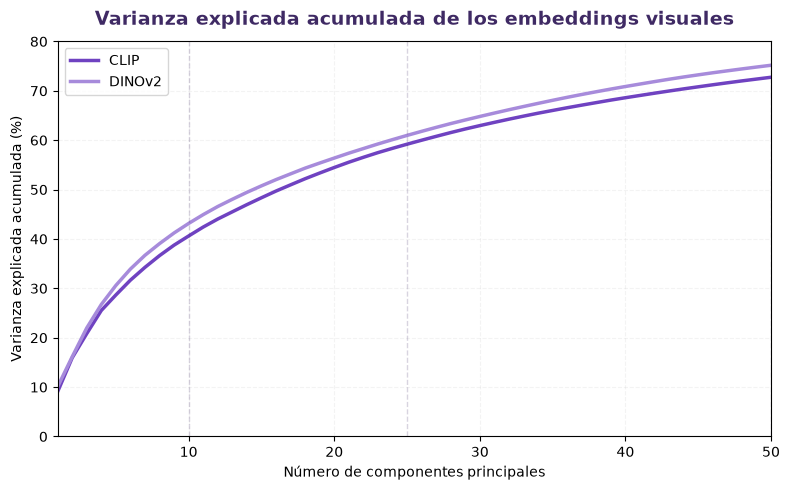

Figura guardada en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\figures\embeddings_pca_varianza_acumulada.png


In [105]:
# Representación de la varianza explicada acumulada

componentes_pca = np.arange(
    1,
    N_COMPONENTES_PCA + 1
)

fig, ax = plt.subplots(
    figsize=(8, 5)
)

ax.plot(
    componentes_pca,
    varianza_acumulada_clip * 100,
    linewidth=2.5,
    label="CLIP",
    color="#6F42C1"
)

ax.plot(
    componentes_pca,
    varianza_acumulada_dinov2 * 100,
    linewidth=2.5,
    label="DINOv2",
    color="#A78BDB"
)

for n in [
    10,
    25,
    50
]:
    ax.axvline(
        n,
        linestyle="--",
        linewidth=1,
        alpha=0.20,
        color="#3F2A64"
    )

ax.set_title(
    "Varianza explicada acumulada de los embeddings visuales",
    fontsize=14,
    fontweight="bold",
    color="#3F2A64",
    pad=12
)

ax.set_xlabel(
    "Número de componentes principales"
)

ax.set_ylabel(
    "Varianza explicada acumulada (%)"
)

ax.set_xlim(
    1,
    N_COMPONENTES_PCA
)

ax.set_ylim(
    0,
    80
)

ax.grid(
    linestyle="--",
    alpha=0.15
)

ax.legend()

fig.tight_layout()

fig_path_pca_varianza = (
    figures_path
    / "embeddings_pca_varianza_acumulada.png"
)

fig.savefig(
    fig_path_pca_varianza,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("Figura guardada en:")
print(fig_path_pca_varianza)

### 15.12. Proyección bidimensional de CLIP y DINOv2

Para explorar visualmente la organización de las fotografías, los embeddings se proyectan sobre las dos primeras componentes principales de cada representación.

Las observaciones se diferencian según la variable objetivo de adopción lenta. Dado que las dos primeras componentes explican aproximadamente el 16 % de la varianza total en ambos casos, la presencia o ausencia de separación entre clases en esta representación no debe interpretarse como una evaluación de la capacidad predictiva completa de los embeddings.

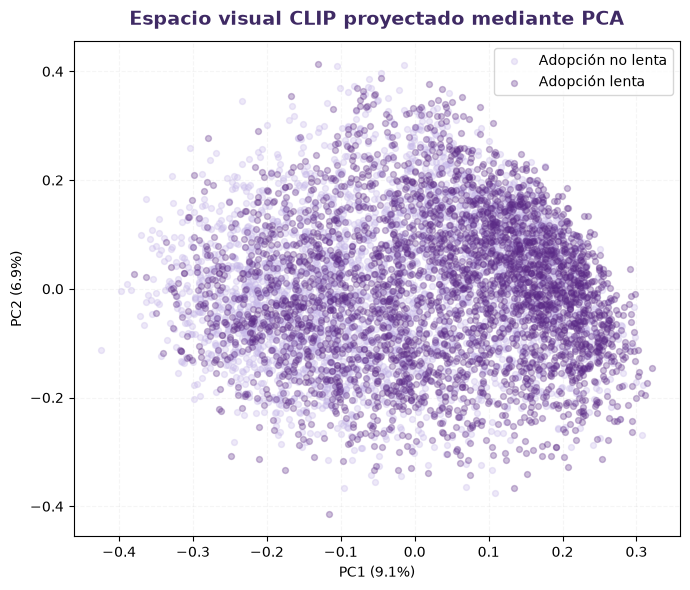

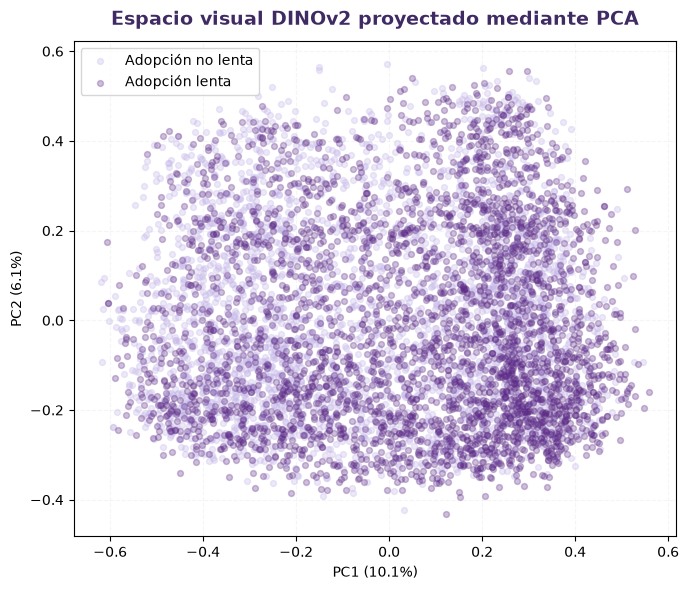

Figuras guardadas en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\figures\clip_pca_adopcion.png
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\figures\dinov2_pca_adopcion.png


In [106]:
# Proyección PCA de CLIP y DINOv2 según la adopción

etiquetas_pca = {
    0: "Adopción no lenta",
    1: "Adopción lenta"
}

colores_pca = {
    0: "#C4B5E8",   # Lavanda claro
    1: "#5B2A86"    # Morado oscuro
}


# ---------------------------------------------------------
# CLIP
# ---------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(7, 6)
)

for clase in [0, 1]:

    mascara_clase = (
        y_dev_embeddings
        == clase
    )

    ax.scatter(
        X_clip_dev_pca[
            mascara_clase,
            0
        ],
        X_clip_dev_pca[
            mascara_clase,
            1
        ],
        s=18,
        alpha=0.30,
        color=colores_pca[clase],
        label=etiquetas_pca[clase]
    )

ax.set_title(
    "Espacio visual CLIP proyectado mediante PCA",
    fontsize=14,
    fontweight="bold",
    color="#3F2A64",
    pad=12
)

ax.set_xlabel(
    (
        "PC1 "
        f"({pca_clip.explained_variance_ratio_[0] * 100:.1f}%)"
    )
)

ax.set_ylabel(
    (
        "PC2 "
        f"({pca_clip.explained_variance_ratio_[1] * 100:.1f}%)"
    )
)

ax.grid(
    linestyle="--",
    alpha=0.12
)

ax.legend(
    frameon=True,
    loc="best"
)

fig.tight_layout()

fig_path_pca_clip = (
    figures_path
    / "clip_pca_adopcion.png"
)

fig.savefig(
    fig_path_pca_clip,
    dpi=300,
    bbox_inches="tight"
)

plt.show()


# ---------------------------------------------------------
# DINOv2
# ---------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(7, 6)
)

for clase in [0, 1]:

    mascara_clase = (
        y_dev_embeddings
        == clase
    )

    ax.scatter(
        X_dinov2_dev_pca[
            mascara_clase,
            0
        ],
        X_dinov2_dev_pca[
            mascara_clase,
            1
        ],
        s=18,
        alpha=0.30,
        color=colores_pca[clase],
        label=etiquetas_pca[clase]
    )

ax.set_title(
    "Espacio visual DINOv2 proyectado mediante PCA",
    fontsize=14,
    fontweight="bold",
    color="#3F2A64",
    pad=12
)

ax.set_xlabel(
    (
        "PC1 "
        f"({pca_dinov2.explained_variance_ratio_[0] * 100:.1f}%)"
    )
)

ax.set_ylabel(
    (
        "PC2 "
        f"({pca_dinov2.explained_variance_ratio_[1] * 100:.1f}%)"
    )
)

ax.grid(
    linestyle="--",
    alpha=0.12
)

ax.legend(
    frameon=True,
    loc="best"
)

fig.tight_layout()

fig_path_pca_dinov2 = (
    figures_path
    / "dinov2_pca_adopcion.png"
)

fig.savefig(
    fig_path_pca_dinov2,
    dpi=300,
    bbox_inches="tight"
)

plt.show()


print("Figuras guardadas en:")
print(fig_path_pca_clip)
print(fig_path_pca_dinov2)

### 15.13. Evaluación predictiva de los embeddings visuales

La proyección mediante PCA permite explorar visualmente la estructura de los embeddings, pero las dos primeras componentes conservan únicamente una parte reducida de su variabilidad.

Para evaluar de forma cuantitativa si las representaciones completas contienen información relacionada con la adopción lenta, se utiliza un clasificador lineal sobre los embeddings congelados de CLIP y DINOv2.

Este procedimiento, habitualmente denominado *linear probing*, permite medir hasta qué punto la variable objetivo puede separarse a partir de las características ya aprendidas por cada modelo sin modificar los pesos de los extractores visuales.

La selección del clasificador y de sus hiperparámetros se realiza exclusivamente utilizando los conjuntos de entrenamiento y validación. El conjunto de test permanece reservado para la evaluación final.

### 15.14. Preparación de los conjuntos para la evaluación predictiva

Para mantener la separación metodológica entre entrenamiento, validación y evaluación final, los embeddings se organizan según la misma partición definida previamente para PetFinder.

Los clasificadores lineales se ajustarán únicamente con el conjunto de entrenamiento y se compararán sobre validación. El conjunto de test se conserva sin intervenir en la selección del nivel de regularización ni del umbral de decisión de CLIP y DINOv2.


In [107]:
# Preparación de los embeddings por conjunto

metadata_embeddings_indexada = (
    metadata_embeddings_df
    .set_index("PetID")
)


# ---------------------------------------------------------
# PetID de cada conjunto
# ---------------------------------------------------------

petids_train_embeddings = (
    metadata_embeddings_df.loc[
        metadata_embeddings_df[
            "conjunto_petfinder"
        ] == "train",
        "PetID"
    ]
    .tolist()
)

petids_valid_embeddings = (
    metadata_embeddings_df.loc[
        metadata_embeddings_df[
            "conjunto_petfinder"
        ] == "valid",
        "PetID"
    ]
    .tolist()
)

petids_test_embeddings = (
    metadata_embeddings_df.loc[
        metadata_embeddings_df[
            "conjunto_petfinder"
        ] == "test",
        "PetID"
    ]
    .tolist()
)


# ---------------------------------------------------------
# Variable objetivo
# ---------------------------------------------------------

y_train_embeddings = (
    metadata_embeddings_indexada
    .loc[
        petids_train_embeddings,
        "target_adopcion_lenta"
    ]
    .to_numpy()
)

y_valid_embeddings = (
    metadata_embeddings_indexada
    .loc[
        petids_valid_embeddings,
        "target_adopcion_lenta"
    ]
    .to_numpy()
)

y_test_embeddings = (
    metadata_embeddings_indexada
    .loc[
        petids_test_embeddings,
        "target_adopcion_lenta"
    ]
    .to_numpy()
)


# ---------------------------------------------------------
# CLIP
# ---------------------------------------------------------

X_clip_train = (
    clip_embeddings_df
    .loc[
        petids_train_embeddings
    ]
    .to_numpy()
)

X_clip_valid = (
    clip_embeddings_df
    .loc[
        petids_valid_embeddings
    ]
    .to_numpy()
)

X_clip_test = (
    clip_embeddings_df
    .loc[
        petids_test_embeddings
    ]
    .to_numpy()
)


# ---------------------------------------------------------
# DINOv2
# ---------------------------------------------------------

X_dinov2_train = (
    dinov2_embeddings_df
    .loc[
        petids_train_embeddings
    ]
    .to_numpy()
)

X_dinov2_valid = (
    dinov2_embeddings_df
    .loc[
        petids_valid_embeddings
    ]
    .to_numpy()
)

X_dinov2_test = (
    dinov2_embeddings_df
    .loc[
        petids_test_embeddings
    ]
    .to_numpy()
)


# ---------------------------------------------------------
# Comprobaciones
# ---------------------------------------------------------

print("Tamaños de los conjuntos:")

print("\nEntrenamiento:")
print(len(y_train_embeddings))

print("\nValidación:")
print(len(y_valid_embeddings))

print("\nTest:")
print(len(y_test_embeddings))


print("\nCLIP:")

print("Train:", X_clip_train.shape)
print("Valid:", X_clip_valid.shape)
print("Test:", X_clip_test.shape)


print("\nDINOv2:")

print("Train:", X_dinov2_train.shape)
print("Valid:", X_dinov2_valid.shape)
print("Test:", X_dinov2_test.shape)


print("\nDistribución de la variable objetivo:")

distribucion_embeddings = pd.DataFrame({
    "conjunto": (
        ["train"] * len(y_train_embeddings)
        + ["valid"] * len(y_valid_embeddings)
        + ["test"] * len(y_test_embeddings)
    ),
    "target": np.concatenate([
        y_train_embeddings,
        y_valid_embeddings,
        y_test_embeddings
    ])
})

display(
    pd.crosstab(
        distribucion_embeddings[
            "conjunto"
        ],
        distribucion_embeddings[
            "target"
        ],
        rownames=["Conjunto"],
        colnames=["Adopción lenta"]
    )
)

Tamaños de los conjuntos:

Entrenamiento:
5085

Validación:
1261

Test:
1592

CLIP:
Train: (5085, 512)
Valid: (1261, 512)
Test: (1592, 512)

DINOv2:
Train: (5085, 384)
Valid: (1261, 384)
Test: (1592, 384)

Distribución de la variable objetivo:


Adopción lenta,0,1
Conjunto,,
test,746,846
train,2374,2711
valid,590,671


### 15.15. Selección del clasificador lineal sobre los embeddings

Para evaluar la información predictiva contenida en las representaciones visuales se entrena una regresión logística sobre los embeddings congelados de CLIP y DINOv2.

Dado que los embeddings ya se encuentran normalizados mediante norma L2, se utilizan directamente como entrada del clasificador. Se comparan diferentes intensidades de regularización mediante el parámetro `C`.

Los modelos se entrenan exclusivamente sobre el conjunto de entrenamiento y se comparan sobre validación. La selección se realiza prioritariamente mediante ROC-AUC y Average Precision, métricas independientes del umbral de clasificación. Las métricas de Precision, Recall y F1 calculadas con umbral 0,5 se muestran únicamente como referencia en esta fase.

In [108]:
# Linear probing sobre CLIP y DINOv2

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score
)


VALORES_C = [
    0.01,
    0.1,
    1.0,
    10.0,
    100.0
]


def evaluar_linear_probe(
    X_train,
    y_train,
    X_valid,
    y_valid,
    nombre_representacion
):
    resultados = []

    modelos = {}

    for C in VALORES_C:

        modelo = LogisticRegression(
            C=C,
            penalty="l2",
            solver="lbfgs",
            max_iter=3000,
            random_state=RANDOM_STATE
        )

        modelo.fit(
            X_train,
            y_train
        )

        score_valid = (
            modelo.predict_proba(
                X_valid
            )[:, 1]
        )

        pred_valid = (
            score_valid >= 0.5
        ).astype(int)

        resultados.append({
            "representacion": nombre_representacion,
            "C": C,
            "accuracy": accuracy_score(
                y_valid,
                pred_valid
            ),
            "precision": precision_score(
                y_valid,
                pred_valid,
                zero_division=0
            ),
            "recall": recall_score(
                y_valid,
                pred_valid,
                zero_division=0
            ),
            "f1": f1_score(
                y_valid,
                pred_valid,
                zero_division=0
            ),
            "roc_auc": roc_auc_score(
                y_valid,
                score_valid
            ),
            "average_precision": average_precision_score(
                y_valid,
                score_valid
            )
        })

        modelos[C] = modelo

    resultados_df = pd.DataFrame(
        resultados
    )

    # Selección priorizando ROC-AUC
    # y utilizando AP como criterio secundario.
    mejor_fila = (
        resultados_df
        .sort_values(
            by=[
                "roc_auc",
                "average_precision"
            ],
            ascending=False
        )
        .iloc[0]
    )

    mejor_C = float(
        mejor_fila["C"]
    )

    mejor_modelo = modelos[
        mejor_C
    ]

    return (
        resultados_df,
        mejor_modelo,
        mejor_C
    )


# ---------------------------------------------------------
# CLIP
# ---------------------------------------------------------

(
    resultados_clip_probe,
    mejor_modelo_clip_probe,
    mejor_C_clip
) = evaluar_linear_probe(
    X_train=X_clip_train,
    y_train=y_train_embeddings,
    X_valid=X_clip_valid,
    y_valid=y_valid_embeddings,
    nombre_representacion="CLIP"
)


# ---------------------------------------------------------
# DINOv2
# ---------------------------------------------------------

(
    resultados_dinov2_probe,
    mejor_modelo_dinov2_probe,
    mejor_C_dinov2
) = evaluar_linear_probe(
    X_train=X_dinov2_train,
    y_train=y_train_embeddings,
    X_valid=X_dinov2_valid,
    y_valid=y_valid_embeddings,
    nombre_representacion="DINOv2"
)


# ---------------------------------------------------------
# Resultados
# ---------------------------------------------------------

resultados_linear_probe = pd.concat(
    [
        resultados_clip_probe,
        resultados_dinov2_probe
    ],
    ignore_index=True
)


print("Resultados de validación:")

display(
    resultados_linear_probe
    .sort_values(
        [
            "representacion",
            "roc_auc"
        ],
        ascending=[
            True,
            False
        ]
    )
    .round(4)
)


print("\nMejor C para CLIP:")
print(mejor_C_clip)

print("\nMejor C para DINOv2:")
print(mejor_C_dinov2)


print("\nMejor resultado de CLIP:")

display(
    resultados_clip_probe.loc[
        resultados_clip_probe[
            "C"
        ] == mejor_C_clip
    ]
    .round(4)
)


print("\nMejor resultado de DINOv2:")

display(
    resultados_dinov2_probe.loc[
        resultados_dinov2_probe[
            "C"
        ] == mejor_C_dinov2
    ]
    .round(4)
)

c:\Users\isaa-\venvs\invisible-dogs-dl\Lib\site-packages\sklearn\linear_model\_logistic.py:1403: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', l1_ratio set to a float between 0 and 1 instead of penalty='elasticnet', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\isaa-\venvs\invisible-dogs-dl\Lib\site-packages\sklearn\linear_model\_logistic.py:1403: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', l1_ratio set to a float between 0 and 1 instead of penalty='elasticnet', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\isaa-\venvs\invisible-d

Resultados de validación:


c:\Users\isaa-\venvs\invisible-dogs-dl\Lib\site-packages\sklearn\linear_model\_logistic.py:1403: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', l1_ratio set to a float between 0 and 1 instead of penalty='elasticnet', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\isaa-\venvs\invisible-dogs-dl\Lib\site-packages\sklearn\linear_model\_logistic.py:1403: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', l1_ratio set to a float between 0 and 1 instead of penalty='elasticnet', and C=np.inf instead of penalty=None.
  warnings.warn(
c:\Users\isaa-\venvs\invisible-d

,representacion,C,accuracy,precision,recall,f1,roc_auc,average_precision
2,CLIP,1.00,0.6471,0.6540,0.7154,0.6833,0.6962,0.7178
1,CLIP,0.10,0.6439,0.6445,0.7377,0.6880,0.6856,0.6993
3,CLIP,10.00,0.6344,0.6458,0.6930,0.6686,0.6844,0.7161
0,CLIP,0.01,0.5916,0.5739,0.9031,0.7018,0.6723,0.6803
4,CLIP,100.00,0.6154,0.6306,0.6692,0.6493,0.6580,0.6897
7,DINOv2,1.00,0.6582,0.6719,0.6990,0.6852,0.7083,0.7300
6,DINOv2,0.10,0.6574,0.6608,0.7317,0.6945,0.7020,0.7135
8,DINOv2,10.00,0.6590,0.6754,0.6915,0.6834,0.6992,0.7264
9,DINOv2,100.00,0.6463,0.6647,0.6766,0.6706,0.6902,0.7188
5,DINOv2,0.01,0.6376,0.6271,0.7869,0.6980,0.6871,0.6982



Mejor C para CLIP:
1.0

Mejor C para DINOv2:
1.0

Mejor resultado de CLIP:


,representacion,C,accuracy,precision,recall,f1,roc_auc,average_precision
2,CLIP,1.0,0.6471,0.654,0.7154,0.6833,0.6962,0.7178



Mejor resultado de DINOv2:


,representacion,C,accuracy,precision,recall,f1,roc_auc,average_precision
2,DINOv2,1.0,0.6582,0.6719,0.699,0.6852,0.7083,0.73


### 15.16. Selección del umbral de clasificación

Una vez seleccionada la intensidad de regularización de cada clasificador mediante métricas independientes del umbral, se determina el punto de corte utilizado para transformar los scores continuos en predicciones binarias.

El umbral se selecciona exclusivamente sobre el conjunto de validación, maximizando el F1-score. Este criterio permite equilibrar Precision y Recall en un problema en el que resulta especialmente relevante identificar perros potencialmente asociados a una adopción lenta sin depender del umbral convencional de 0,5.

El conjunto de test permanece completamente excluido tanto de la selección del clasificador como de la elección del umbral.

In [109]:
# Selección del umbral óptimo para CLIP y DINOv2
# utilizando exclusivamente el conjunto de validación

from sklearn.metrics import (
    precision_recall_curve,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score
)


def seleccionar_umbral_f1(
    y_true,
    y_score
):
    precision_curve, recall_curve, thresholds = (
        precision_recall_curve(
            y_true,
            y_score
        )
    )

    # precision y recall contienen un elemento adicional
    precision_thresholds = precision_curve[:-1]
    recall_thresholds = recall_curve[:-1]

    f1_thresholds = (
        2
        * precision_thresholds
        * recall_thresholds
        / (
            precision_thresholds
            + recall_thresholds
            + 1e-12
        )
    )

    indice_mejor = np.argmax(
        f1_thresholds
    )

    umbral_optimo = float(
        thresholds[
            indice_mejor
        ]
    )

    return {
        "umbral": umbral_optimo,
        "precision": float(
            precision_thresholds[
                indice_mejor
            ]
        ),
        "recall": float(
            recall_thresholds[
                indice_mejor
            ]
        ),
        "f1": float(
            f1_thresholds[
                indice_mejor
            ]
        )
    }


# ---------------------------------------------------------
# Scores de validación
# ---------------------------------------------------------

score_clip_valid = (
    mejor_modelo_clip_probe
    .predict_proba(
        X_clip_valid
    )[:, 1]
)

score_dinov2_valid = (
    mejor_modelo_dinov2_probe
    .predict_proba(
        X_dinov2_valid
    )[:, 1]
)


# ---------------------------------------------------------
# Selección de umbrales
# ---------------------------------------------------------

umbral_clip_info = seleccionar_umbral_f1(
    y_valid_embeddings,
    score_clip_valid
)

umbral_dinov2_info = seleccionar_umbral_f1(
    y_valid_embeddings,
    score_dinov2_valid
)

umbral_clip_optimo = (
    umbral_clip_info[
        "umbral"
    ]
)

umbral_dinov2_optimo = (
    umbral_dinov2_info[
        "umbral"
    ]
)


# ---------------------------------------------------------
# Función de resumen
# ---------------------------------------------------------

def resumen_umbral_validacion(
    nombre,
    y_true,
    y_score,
    umbral
):
    y_pred = (
        y_score >= umbral
    ).astype(int)

    return {
        "representacion": nombre,
        "umbral": umbral,
        "accuracy": accuracy_score(
            y_true,
            y_pred
        ),
        "precision": precision_score(
            y_true,
            y_pred,
            zero_division=0
        ),
        "recall": recall_score(
            y_true,
            y_pred,
            zero_division=0
        ),
        "f1": f1_score(
            y_true,
            y_pred,
            zero_division=0
        ),
        "roc_auc": roc_auc_score(
            y_true,
            y_score
        ),
        "average_precision": average_precision_score(
            y_true,
            y_score
        )
    }


resultados_umbrales_embeddings = pd.DataFrame([
    resumen_umbral_validacion(
        nombre="CLIP",
        y_true=y_valid_embeddings,
        y_score=score_clip_valid,
        umbral=umbral_clip_optimo
    ),
    resumen_umbral_validacion(
        nombre="DINOv2",
        y_true=y_valid_embeddings,
        y_score=score_dinov2_valid,
        umbral=umbral_dinov2_optimo
    )
])


print("Umbral seleccionado para CLIP:")
print(
    f"{umbral_clip_optimo:.4f}"
)

print("\nUmbral seleccionado para DINOv2:")
print(
    f"{umbral_dinov2_optimo:.4f}"
)

print(
    "\nResultados con los umbrales "
    "seleccionados en validación:"
)

display(
    resultados_umbrales_embeddings
    .round(4)
)


# ---------------------------------------------------------
# Comparación con el umbral convencional 0,5
# ---------------------------------------------------------

comparacion_umbral_embeddings = []

for nombre, y_score, umbral in [
    (
        "CLIP",
        score_clip_valid,
        umbral_clip_optimo
    ),
    (
        "DINOv2",
        score_dinov2_valid,
        umbral_dinov2_optimo
    )
]:

    for etiqueta_umbral, valor_umbral in [
        ("0,5", 0.5),
        ("Seleccionado", umbral)
    ]:

        y_pred = (
            y_score >= valor_umbral
        ).astype(int)

        comparacion_umbral_embeddings.append({
            "representacion": nombre,
            "tipo_umbral": etiqueta_umbral,
            "umbral": valor_umbral,
            "precision": precision_score(
                y_valid_embeddings,
                y_pred,
                zero_division=0
            ),
            "recall": recall_score(
                y_valid_embeddings,
                y_pred,
                zero_division=0
            ),
            "f1": f1_score(
                y_valid_embeddings,
                y_pred,
                zero_division=0
            )
        })


comparacion_umbral_embeddings_df = pd.DataFrame(
    comparacion_umbral_embeddings
)

print("\nComparación con el umbral 0,5:")

display(
    comparacion_umbral_embeddings_df
    .round(4)
)

Umbral seleccionado para CLIP:
0.4117

Umbral seleccionado para DINOv2:
0.3479

Resultados con los umbrales seleccionados en validación:


,representacion,umbral,accuracy,precision,recall,f1,roc_auc,average_precision
0,CLIP,0.4117,0.6265,0.6055,0.8554,0.7091,0.6962,0.7178
1,DINOv2,0.3479,0.6082,0.5837,0.9195,0.7141,0.7083,0.7300



Comparación con el umbral 0,5:


,representacion,tipo_umbral,umbral,precision,recall,f1
0,CLIP,"0,5",0.5000,0.6540,0.7154,0.6833
1,CLIP,Seleccionado,0.4117,0.6055,0.8554,0.7091
2,DINOv2,"0,5",0.5000,0.6719,0.6990,0.6852
3,DINOv2,Seleccionado,0.3479,0.5837,0.9195,0.7141


### 15.17. Evaluación final sobre el conjunto de test

Una vez seleccionados el nivel de regularización y el umbral de clasificación utilizando exclusivamente los conjuntos de entrenamiento y validación, las configuraciones quedan fijadas antes de acceder al conjunto de test.

Los clasificadores lineales seleccionados para CLIP y DINOv2 se aplican directamente a las fotografías de test sin realizar ningún ajuste adicional. De esta forma, el conjunto de test proporciona una estimación independiente de la capacidad de generalización de las representaciones visuales.

La evaluación incluye métricas dependientes del umbral —Accuracy, Precision, Recall y F1-score— y métricas independientes del mismo —ROC-AUC y Average Precision—.

In [110]:
# Evaluación final de CLIP y DINOv2 sobre test

def evaluar_modelo_embeddings_test(
    nombre,
    modelo,
    X_test,
    y_test,
    umbral
):
    # Scores continuos
    y_score = (
        modelo
        .predict_proba(
            X_test
        )[:, 1]
    )

    # Predicciones binarias con el umbral fijado en validación
    y_pred = (
        y_score >= umbral
    ).astype(int)

    metricas = {
        "representacion": nombre,
        "umbral": umbral,
        "accuracy": accuracy_score(
            y_test,
            y_pred
        ),
        "precision": precision_score(
            y_test,
            y_pred,
            zero_division=0
        ),
        "recall": recall_score(
            y_test,
            y_pred,
            zero_division=0
        ),
        "f1": f1_score(
            y_test,
            y_pred,
            zero_division=0
        ),
        "roc_auc": roc_auc_score(
            y_test,
            y_score
        ),
        "average_precision": average_precision_score(
            y_test,
            y_score
        )
    }

    return (
        metricas,
        y_score,
        y_pred
    )


# ---------------------------------------------------------
# CLIP
# ---------------------------------------------------------

(
    metricas_clip_test,
    score_clip_test,
    pred_clip_test
) = evaluar_modelo_embeddings_test(
    nombre="CLIP",
    modelo=mejor_modelo_clip_probe,
    X_test=X_clip_test,
    y_test=y_test_embeddings,
    umbral=umbral_clip_optimo
)


# ---------------------------------------------------------
# DINOv2
# ---------------------------------------------------------

(
    metricas_dinov2_test,
    score_dinov2_test,
    pred_dinov2_test
) = evaluar_modelo_embeddings_test(
    nombre="DINOv2",
    modelo=mejor_modelo_dinov2_probe,
    X_test=X_dinov2_test,
    y_test=y_test_embeddings,
    umbral=umbral_dinov2_optimo
)


# ---------------------------------------------------------
# Tabla de resultados finales
# ---------------------------------------------------------

resultados_embeddings_test = pd.DataFrame([
    metricas_clip_test,
    metricas_dinov2_test
])


print("Resultados finales sobre test:")

display(
    resultados_embeddings_test
    .round(4)
)

Resultados finales sobre test:


,representacion,umbral,accuracy,precision,recall,f1,roc_auc,average_precision
0,CLIP,0.4117,0.6244,0.6046,0.8475,0.7057,0.6881,0.7086
1,DINOv2,0.3479,0.6049,0.5834,0.8972,0.7070,0.6874,0.7045


In [111]:
# Comparación de las representaciones visuales con EfficientNet-B0

comparacion_modelos_visuales_test = pd.DataFrame([
    {
        "modelo": "EfficientNet-B0",
        "accuracy": metricas_test_visual[
            "accuracy"
        ],
        "precision": metricas_test_visual[
            "precision"
        ],
        "recall": metricas_test_visual[
            "recall"
        ],
        "f1": metricas_test_visual[
            "f1"
        ],
        "roc_auc": metricas_test_visual[
            "roc_auc"
        ],
        "average_precision": metricas_test_visual[
            "average_precision"
        ]
    },
    {
        "modelo": "CLIP + regresión logística",
        "accuracy": metricas_clip_test[
            "accuracy"
        ],
        "precision": metricas_clip_test[
            "precision"
        ],
        "recall": metricas_clip_test[
            "recall"
        ],
        "f1": metricas_clip_test[
            "f1"
        ],
        "roc_auc": metricas_clip_test[
            "roc_auc"
        ],
        "average_precision": metricas_clip_test[
            "average_precision"
        ]
    },
    {
        "modelo": "DINOv2 + regresión logística",
        "accuracy": metricas_dinov2_test[
            "accuracy"
        ],
        "precision": metricas_dinov2_test[
            "precision"
        ],
        "recall": metricas_dinov2_test[
            "recall"
        ],
        "f1": metricas_dinov2_test[
            "f1"
        ],
        "roc_auc": metricas_dinov2_test[
            "roc_auc"
        ],
        "average_precision": metricas_dinov2_test[
            "average_precision"
        ]
    }
])


print(
    "Comparación final de aproximaciones visuales:"
)

display(
    comparacion_modelos_visuales_test
    .sort_values(
        "roc_auc",
        ascending=False
    )
    .round(4)
)

Comparación final de aproximaciones visuales:


,modelo,accuracy,precision,recall,f1,roc_auc,average_precision
1,CLIP + regresión logística,0.6244,0.6046,0.8475,0.7057,0.6881,0.7086
2,DINOv2 + regresión logística,0.6049,0.5834,0.8972,0.7070,0.6874,0.7045
0,EfficientNet-B0,0.5773,0.5618,0.9291,0.7002,0.6736,0.6917


### 15.18. Comparación final de las aproximaciones visuales

La evaluación sobre el conjunto de test muestra que las representaciones visuales obtenidas mediante CLIP y DINOv2 contienen información relevante para diferenciar perros asociados a una adopción lenta.

CLIP alcanza el mayor ROC-AUC y Average Precision de las tres aproximaciones visuales evaluadas, mientras que DINOv2 obtiene un F1-score ligeramente superior. Ambos modelos superan a EfficientNet-B0 en capacidad discriminativa global, a pesar de que sus extractores visuales permanecen completamente congelados y únicamente se utiliza una regresión logística sobre sus embeddings.

EfficientNet-B0 mantiene, sin embargo, el mayor Recall, identificando una mayor proporción de los perros con adopción lenta a costa de una menor Precision. Este comportamiento resulta coherente con el umbral seleccionado previamente para priorizar la sensibilidad del modelo.

En conjunto, los resultados indican que las representaciones visuales preentrenadas de propósito general permiten capturar patrones relacionados con la adopción lenta sin necesidad de ajustar directamente el extractor sobre PetFinder. CLIP y DINOv2 presentan un comportamiento muy similar, aunque CLIP obtiene una ligera ventaja en las métricas independientes del umbral sobre el conjunto de test.

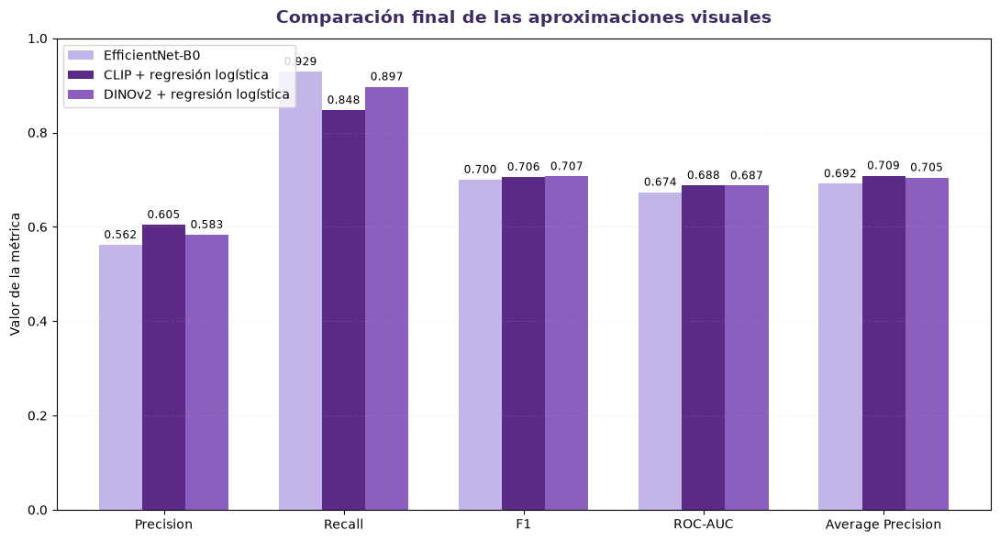

Figura guardada en:
g:\Mi unidad\TFM\invisible-dogs-tfm\outputs\figures\comparacion_final_modelos_visuales.png


In [112]:
# Comparación visual de las aproximaciones basadas en imagen

metricas_comparacion = [
    "precision",
    "recall",
    "f1",
    "roc_auc",
    "average_precision"
]

nombres_metricas = [
    "Precision",
    "Recall",
    "F1",
    "ROC-AUC",
    "Average Precision"
]

# Los nombres deben coincidir exactamente
# con los utilizados en comparacion_modelos_visuales_test
modelos_comparacion = [
    "EfficientNet-B0",
    "CLIP + regresión logística",
    "DINOv2 + regresión logística"
]


datos_comparacion = (
    comparacion_modelos_visuales_test
    .set_index("modelo")
    .loc[
        modelos_comparacion,
        metricas_comparacion
    ]
)


x = np.arange(
    len(metricas_comparacion)
)

ancho = 0.24


fig, ax = plt.subplots(
    figsize=(11, 6)
)


colores_modelos = [
    "#C4B5E8",  # EfficientNet-B0
    "#5B2A86",  # CLIP
    "#8B5FBF"   # DINOv2
]


for i, modelo in enumerate(
    modelos_comparacion
):

    valores = (
        datos_comparacion
        .loc[modelo]
        .to_numpy()
    )

    barras = ax.bar(
        x + (i - 1) * ancho,
        valores,
        width=ancho,
        label=modelo,
        color=colores_modelos[i]
    )

    for barra, valor in zip(
        barras,
        valores
    ):

        ax.text(
            barra.get_x()
            + barra.get_width() / 2,
            valor + 0.008,
            f"{valor:.3f}",
            ha="center",
            va="bottom",
            fontsize=8.5
        )


ax.set_title(
    "Comparación final de las aproximaciones visuales",
    fontsize=14,
    fontweight="bold",
    color="#3F2A64",
    pad=12
)

ax.set_ylabel(
    "Valor de la métrica"
)

ax.set_xticks(
    x
)

ax.set_xticklabels(
    nombres_metricas
)

ax.set_ylim(
    0,
    1.0
)

ax.grid(
    axis="y",
    linestyle="--",
    alpha=0.15
)

ax.legend(
    loc="upper left"
)

fig.tight_layout()


fig_path_comparacion_visual = (
    figures_path
    / "comparacion_final_modelos_visuales.png"
)

fig.savefig(
    fig_path_comparacion_visual,
    dpi=300,
    bbox_inches="tight"
)

plt.show()


print("Figura guardada en:")
print(fig_path_comparacion_visual)

## 16. Síntesis del análisis visual

El análisis desarrollado en este notebook ha permitido estudiar la información contenida en las fotografías de PetFinder desde diferentes perspectivas complementarias, combinando aprendizaje profundo, interpretabilidad, análisis geométrico, segmentación, calidad técnica y representaciones visuales preentrenadas.

El modelo EfficientNet-B0 entrenado específicamente para la identificación de perros asociados a una adopción lenta alcanzó en test un F1-score de 0,7002 y un ROC-AUC de 0,6736. Su elevado Recall (0,9291) indica una elevada capacidad para identificar perros pertenecientes a la clase positiva, aunque a costa de una menor Precision.

La combinación de este modelo visual con la información estructurada y textual analizada previamente permitió comprobar que ambas fuentes contienen señales parcialmente complementarias. Sin embargo, el modelo basado en información estructurada y textual continuó mostrando una elevada capacidad predictiva, evidenciando que la imagen constituye una fuente adicional de información y no un sustituto del resto de características disponibles.

La interpretabilidad mediante Grad-CAM mostró que, en diferentes ejemplos, EfficientNet concentra parte de su atención sobre regiones correspondientes al propio perro. Este resultado se reforzó mediante el análisis de segmentación con DeepLabV3: al conservar únicamente al animal, el modelo mantuvo gran parte de su capacidad discriminativa, con un ROC-AUC de 0,6627 frente a 0,6746 de la fotografía completa. En cambio, al conservar exclusivamente el contexto, el ROC-AUC disminuyó hasta 0,5647.

Estos resultados indican que la mayor parte de la señal utilizada por el modelo visual procede de las características del propio perro, aunque el contexto de la fotografía contiene cierta información adicional.

El análisis mediante MediaPipe permitió estudiar características relacionadas con el encuadre. Las fotografías asociadas a adopción lenta presentaron una frecuencia ligeramente superior de varios perros, una menor ocupación del animal dentro de la fotografía y una mayor distancia respecto al centro. No obstante, los tamaños de efecto obtenidos fueron reducidos, por lo que estas características deben interpretarse como señales complementarias y no como factores con elevada capacidad explicativa individual.

Las características técnicas básicas de las fotografías —brillo, contraste, saturación y exposición— mostraron diferencias muy reducidas entre ambos grupos. La nitidez fue la única variable con una asociación más apreciable, aunque nuevamente con un tamaño de efecto limitado. Por tanto, no se observa evidencia de que una menor calidad técnica de la fotografía explique por sí sola la adopción lenta.

Finalmente, las representaciones visuales obtenidas mediante CLIP y DINOv2 demostraron que los modelos visuales preentrenados contienen información relevante para esta tarea incluso sin modificar sus extractores. Utilizando únicamente una regresión logística sobre los embeddings congelados, CLIP alcanzó en test un ROC-AUC de 0,6881 y un Average Precision de 0,7086, mientras que DINOv2 obtuvo un ROC-AUC de 0,6874 y un F1-score de 0,7070.

Por tanto, los resultados muestran que la fotografía contiene información relacionada con la adopción lenta y que esta señal puede capturarse mediante diferentes aproximaciones. Sin embargo, su capacidad predictiva aislada es moderada y debe entenderse como complementaria a la información estructurada y textual. Esta conclusión respalda el enfoque multimodal de Invisible Dogs, en el que diferentes fuentes de información contribuyen conjuntamente a caracterizar el riesgo de una adopción más lenta.